In [1]:
import pandas as pd
from pandas import *
from IPython.display import HTML, display_html
from matplotlib import pyplot as plt
import seaborn as sns
import statsmodels as sm
import nvd3

loaded nvd3 IPython extension
run nvd3.ipynb.initialize_javascript() to set up the notebook
help(nvd3.ipynb.initialize_javascript) for options


In [2]:
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 100

In [3]:
nvd3.ipynb.initialize_javascript(use_remote=True)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

All the data are stored in the data folder and let's take a look.

In [4]:
!ls -l -h data

total 2360528
-rw-r--r--  1 yeqing  staff   444B 15 Jun 23:35 DataDict.html
-rw-r--r--@ 1 yeqing  staff    21K  2 May 21:47 LCDataDictionary.xlsx
-rw-r--r--@ 1 yeqing  staff   492M  2 May 21:47 database.sqlite
-rw-r--r--@ 1 yeqing  staff   240M 15 Jun 23:04 lending-club-loan-data.zip
-rw-r--r--@ 1 yeqing  staff   421M  2 May 21:47 loan.csv


## Section 1. Data Description

The file LCDataDictionary.xlsx is the lookup table for finding the corresponding explanation of each column of the data.

In [5]:
data_dict = read_excel('data/LCDataDictionary.xlsx')

HTML(data_dict.to_html())

,LoanStatNew,Description
0,addr_state,The state provided by the borrower in the loan...
1,annual_inc,The self-reported annual income provided by th...
2,annual_inc_joint,The combined self-reported annual income provi...
3,application_type,Indicates whether the loan is an individual ap...
4,collection_recovery_fee,post charge off collection fee
5,collections_12_mths_ex_med,Number of collections in 12 months excluding m...
6,delinq_2yrs,The number of 30+ days past-due incidences of ...
7,desc,Loan description provided by the borrower
8,dti,A ratio calculated using the borrower’s total ...
9,dti_joint,A ratio calculated using the co-borrowers' tot...


## Section 2. Dataset Summary

Let's start by loading the raw data.

In [6]:
df_loan = read_csv('data/loan.csv')

/Library/Python/2.7/site-packages/IPython/core/interactiveshell.py:2723: DtypeWarning: Columns (19,55) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [7]:
df_loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 887379 entries, 0 to 887378
Data columns (total 74 columns):
id                             887379 non-null int64
member_id                      887379 non-null int64
loan_amnt                      887379 non-null float64
funded_amnt                    887379 non-null float64
funded_amnt_inv                887379 non-null float64
term                           887379 non-null object
int_rate                       887379 non-null float64
installment                    887379 non-null float64
grade                          887379 non-null object
sub_grade                      887379 non-null object
emp_title                      835922 non-null object
emp_length                     887379 non-null object
home_ownership                 887379 non-null object
annual_inc                     887375 non-null float64
verification_status            887379 non-null object
issue_d                        887379 non-null object
loan_status          

There are 887379 observations in total. 

It is noticed there are quite a lot of variables containing missing values. Later we may need to dig deeper about why those variables contain missing values and how they would affect the analysis, and whether we need to put more effort to interpolate the values (or drop for good) in order to make proper prediction. 

There are 74 variables in total:
* Identity: 3 (id, member_id, url)
* Numeric: 48
* Categorical: 23

Let's take a bit pre-processing on the data types and convert the categorical variables into categorical column in the dataframe.

In [8]:
# identity variables
id_vars = ['id', 'member_id', 'policy_code', 'url']

# date variables
date_vars = filter(lambda x: x[-2:] == '_d', df_loan.columns.tolist())
date_vars += ['earliest_cr_line']

# categorical variables
cat_vars = df_loan.dtypes[df_loan.dtypes.astype(str).isin(['object', 'category'])].index.tolist()
cat_vars = list(set(cat_vars).difference(set(id_vars + date_vars)))
cat_vars = sorted(cat_vars)

# numeric variables
num_vars = list(set(df_loan.columns.tolist()).difference(set(id_vars + date_vars + cat_vars)))
num_vars = sorted(num_vars)

# convert identity and categorical vairables into category dtype in dataframe.
for col in cat_vars + id_vars:
    df_loan[col] = df_loan[col].astype('category')

# convert date vairables into datetime dtype in dataframe.
for col in date_vars:
    df_loan[col] = to_datetime(df_loan[col], format='%b-%Y')
    

Now let's profile the dataset. 

In [9]:
df_loan.describe(include='all').T.join(DataFrame(df_loan.dtypes, columns=['dtype']))

/Library/Python/2.7/site-packages/numpy/lib/function_base.py:3823: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max,dtype
id,887379,887379,6.86171e+07,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,category
member_id,887379,887379,7.35448e+07,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,category
loan_amnt,887379,NaN,NaN,NaN,NaN,NaN,14755.3,8435.46,500,8000,13000,20000,35000,float64
funded_amnt,887379,NaN,NaN,NaN,NaN,NaN,14741.9,8429.9,500,8000,13000,20000,35000,float64
funded_amnt_inv,887379,NaN,NaN,NaN,NaN,NaN,14702.5,8442.11,0,8000,13000,20000,35000,float64
term,887379,2,36 months,621125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,category
int_rate,887379,NaN,NaN,NaN,NaN,NaN,13.2467,4.38187,5.32,9.99,12.99,16.2,28.99,float64
installment,887379,NaN,NaN,NaN,NaN,NaN,436.717,244.187,15.67,260.705,382.55,572.6,1445.46,float64
grade,887379,7,B,254535,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,category
sub_grade,887379,35,B3,56323,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,category


## Section 3. Univariate Analysis

As a beginning point, we may start by looking at the distribution of each unique variable by plotting the histogram. Let's start by exploring the numeric variables. 

### 3.1 Numeric Variables

We have 48 variables to plot. Let's plot 10 at a time. 

count    887350.000000
mean          0.004991
std           0.077625
min           0.000000
25%                NaN
50%                NaN
75%                NaN
max          14.000000
Name: acc_now_delinq, dtype: float64


/Library/Python/2.7/site-packages/matplotlib/font_manager.py:1282: UserWarning: findfont: Font family [u'sans-serif'] not found. Falling back to Bitstream Vera Sans
  (prop.get_family(), self.defaultFamily[fontext]))


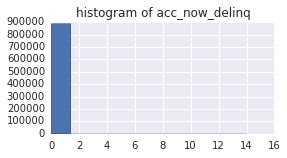



count    21372.000000
mean        60.831939
std         20.013254
min          0.000000
25%               NaN
50%               NaN
75%               NaN
max        151.400000
Name: all_util, dtype: float64


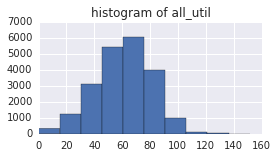



count    8.873750e+05
mean     7.502759e+04
std      6.469830e+04
min      0.000000e+00
25%               NaN
50%               NaN
75%               NaN
max      9.500000e+06
Name: annual_inc, dtype: float64


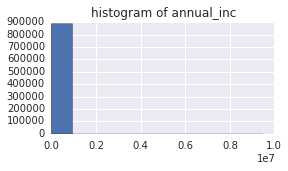



count       511.000000
mean     109981.011585
std       52730.379847
min       17950.000000
25%                NaN
50%                NaN
75%                NaN
max      500000.000000
Name: annual_inc_joint, dtype: float64


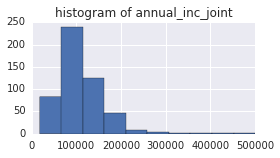



count    887379.000000
mean          4.880757
std          63.125281
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max        7002.190000
Name: collection_recovery_fee, dtype: float64


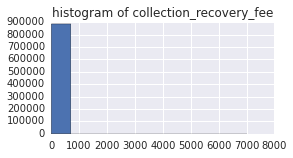



count    887234.000000
mean          0.014380
std           0.134191
min           0.000000
25%                NaN
50%                NaN
75%                NaN
max          20.000000
Name: collections_12_mths_ex_med, dtype: float64


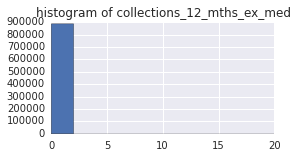



count    887350.000000
mean          0.314442
std           0.862244
min           0.000000
25%                NaN
50%                NaN
75%                NaN
max          39.000000
Name: delinq_2yrs, dtype: float64


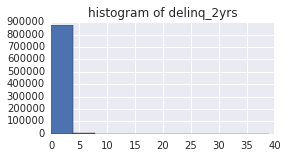



count    887379.000000
mean         18.157039
std          17.190626
min           0.000000
25%          11.910000
50%          17.650000
75%          23.950000
max        9999.000000
Name: dti, dtype: float64


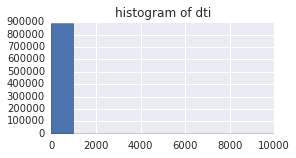



count    509.000000
mean      18.310118
std        7.169233
min        3.000000
25%             NaN
50%             NaN
75%             NaN
max       43.860000
Name: dti_joint, dtype: float64


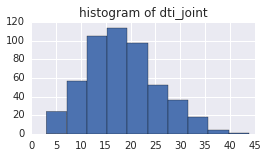



count    887379.000000
mean      14741.877625
std        8429.897657
min         500.000000
25%        8000.000000
50%       13000.000000
75%       20000.000000
max       35000.000000
Name: funded_amnt, dtype: float64


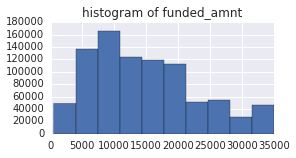

In [10]:
# first 10
for i, col in enumerate(num_vars[:10]):
    print df_loan[col].describe()
    df_loan[col].hist(figsize=(4,2))
    plt.title('histogram of ' + col)
    plt.show()
    print ''
    print ''

The distributions of some variables such as **total_pymnt**, **total_acc**, **mths_since_last_delinq** seem to be well shaped, but a couple of the first 10 including **acc_now_delinq**, **annual_inc**, **collection_recovery_fee** seem to have extreme outliers as their medians and 25% percentiles are close to 0 and most of the samples are attributed to only one bin.

Let's remove the the top and bottom 1% samples (the outliers) and re-plot the histograms.

In [336]:
# helper function to remove top/bottom n% outliers
def remove_outliers(df, col, n):
    df = df[~df[col].isnull()]
    df = df[ ( df[col] > np.percentile(df[col], n) ) &\
             ( df[col] < np.percentile(df[col], 100-n) ) ]
    return df

# helper function to plot the histogram
def plot_hist(df, col, no_outliers=True, describe=True, figsize=(4, 2), **kwargs):
    df = df[~df[col].isnull()]
    if no_outliers:
        df = remove_outliers(df, col, 1)
    if describe:
        print df[col].describe()
    if df[col].shape[0] == 0:
        print 'All records have been filtered. Plot not displayed'
    else:
        df[col].hist(figsize=figsize, **kwargs)
        plt.title('histogram of ' + col)
        plt.show()
    print ''
    print ''

count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: acc_now_delinq, dtype: float64
All records have been filtered. Plot not displayed


count    20943.000000
mean        60.875328
std         18.727695
min         11.000000
25%         48.000000
50%         61.900000
75%         74.900000
max        102.500000
Name: all_util, dtype: float64


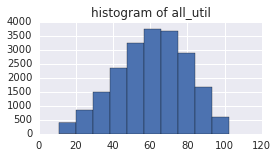



count    868198.000000
mean      72210.996036
std       36602.246656
min       19001.000000
25%       46000.000000
50%       64850.000000
75%       90000.000000
max      249999.960000
Name: annual_inc, dtype: float64


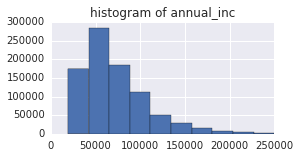



count       498.000000
mean     107356.780964
std       41473.607648
min       32760.000000
25%       77000.000000
50%      101544.500000
75%      131750.000000
max      260000.000000
Name: annual_inc_joint, dtype: float64


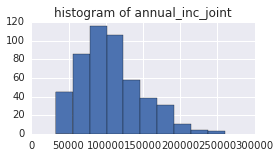



count    14633.000000
mean        15.246815
std         15.165815
min          0.036000
25%          4.470000
50%          9.892000
75%         21.318900
max         80.179200
Name: collection_recovery_fee, dtype: float64


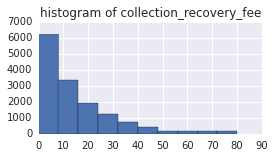



count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: collections_12_mths_ex_med, dtype: float64
All records have been filtered. Plot not displayed


count    158752.000000
mean          1.362232
std           0.617990
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max           3.000000
Name: delinq_2yrs, dtype: float64


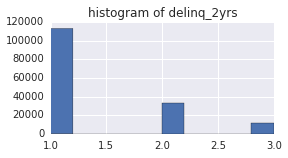



count    869543.000000
mean         18.095122
std           7.939457
min           1.990000
25%          12.040000
50%          17.660000
75%          23.800000
max          37.470000
Name: dti, dtype: float64


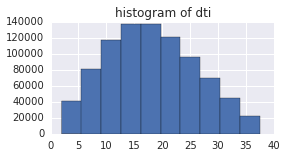



count    497.000000
mean      18.241469
std        6.680930
min        4.550000
25%       13.280000
50%       17.610000
75%       22.620000
max       34.810000
Name: dti_joint, dtype: float64


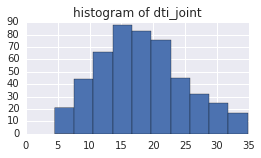



count    841913.000000
mean      14017.075309
std        7399.013954
min        1825.000000
25%        8000.000000
50%       12300.000000
75%       20000.000000
max       34975.000000
Name: funded_amnt, dtype: float64


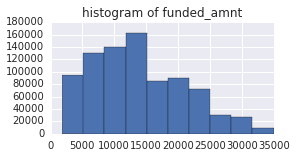

In [337]:
# iterate through the first 10 again
for col in num_vars[:10]:
    plot_hist(df_loan, col, True)

Well, now the distribution looks much better after getting rid of the extreme outliers. 

By looking at the histograms, we can see some patterns: 
1. Discrete distribution: **delinq_2yrs**, which contains only 3 unique elements. This makes sense as delinquency seems to be a rare event, intuitively. 
2. Left/right-skewed normal distribution: **all_util**, **annual_inc**, **annual_inc_joint**, **dti**, **dti_joint**.
3. Exponential decreasing distribution: **collection_recovery_fee**
4. Unusual distribution: **funded_amnt**, median at 12300 but a steep drop after it. 
5. No data: **acc_now_delinq**, **collections_12_mths_ex_med**. Reasonably makes sense because of their rareness. Need a bit deep investigation.

In [338]:
# Close look at the actual values for Case # 5 concluded above.
print 'acc_now_delinq'
print df_loan['acc_now_delinq'].value_counts()
print ''
print ''
print 'collections_12_mths_ex_med'
print df_loan['collections_12_mths_ex_med'].value_counts()
#np.log(df_loan['collections_12_mths_ex_med'].value_counts()).plot(kind='bar')

acc_now_delinq
0.0     883236
1.0       3866
2.0        208
3.0         28
4.0          7
5.0          3
14.0         1
6.0          1
Name: acc_now_delinq, dtype: int64


collections_12_mths_ex_med
0.0     875553
1.0      10824
2.0        732
3.0         88
4.0         23
5.0          7
6.0          2
20.0         1
16.0         1
14.0         1
10.0         1
7.0          1
Name: collections_12_mths_ex_med, dtype: int64


The above two still seem to follow an exponential decreasing pattern. Let's plot them on log scale and see what happens.

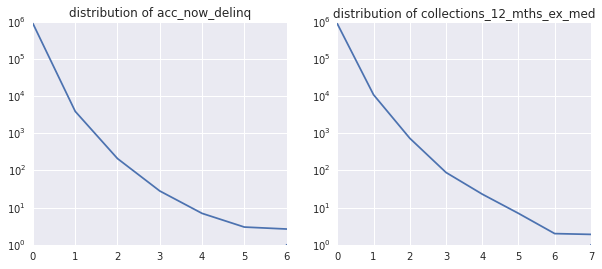

In [339]:
# Close look at the actual values for Case # 5 concluded above.
plt.figure(figsize=(10, 4))

key = 'acc_now_delinq'
plt.subplot(121)
df_loan[key].value_counts().plot(logy=True)
plt.title('distribution of ' + key)

plt.subplot(122)
key = 'collections_12_mths_ex_med'
df_loan[key].value_counts().plot(logy=True)
plt.title('distribution of ' + key)

plt.show()

The trend is clearly reflected. I wonder these two may affect the following analysis. Will they be useful indicators of a prediction target? Let's leave it for now. 

We can now plot the rest of the variables, still, filtering out the top/bottom 1%.

count    848702.000000
mean      14140.727333
std        7608.113481
min        1600.001368
25%        8000.000000
50%       12475.000000
75%       19975.000000
max       34997.352447
Name: funded_amnt_inv, dtype: float64


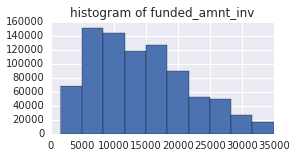



count    18241.000000
mean        71.670117
std         21.255364
min          5.300000
25%         59.100000
50%         75.000000
75%         87.400000
max        117.400000
Name: il_util, dtype: float64


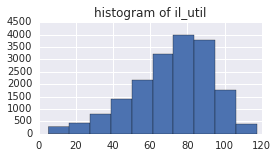



count    9601.000000
mean        1.828143
std         1.089076
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         5.000000
Name: inq_fi, dtype: float64


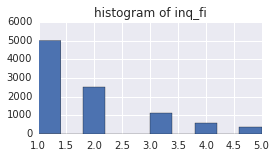



count    19784.000000
mean         2.254852
std          2.130659
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         11.000000
Name: inq_last_12m, dtype: float64


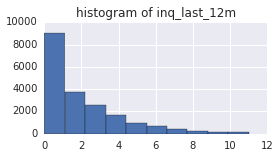



count    373009.000000
mean          1.452839
std           0.669550
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max           3.000000
Name: inq_last_6mths, dtype: float64


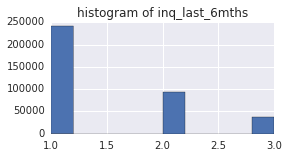



count    869553.000000
mean        432.520203
std         229.556887
min          60.660000
25%         262.880000
50%         382.550000
75%         566.560000
max        1184.730000
Name: installment, dtype: float64


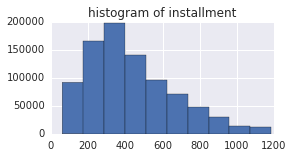



count    868705.000000
mean         13.204394
std           4.155623
min           5.420000
25%           9.990000
50%          12.990000
75%          15.990000
max          24.890000
Name: int_rate, dtype: float64


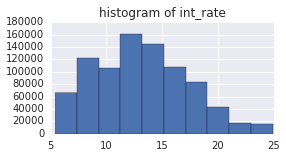



count    860832.000000
mean       1931.623504
std        3998.557697
min           0.010000
25%         289.017500
50%         467.430000
75%         822.682500
max       24281.640000
Name: last_pymnt_amnt, dtype: float64


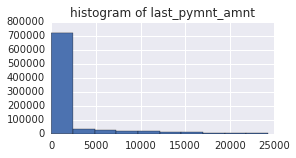



count    841795.000000
mean      14027.446469
std        7402.976840
min        1825.000000
25%        8000.000000
50%       12325.000000
75%       20000.000000
max       34975.000000
Name: loan_amnt, dtype: float64


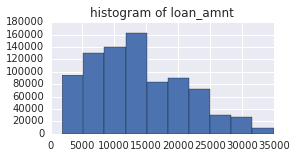



count    20750.000000
mean      5746.485301
std       4513.992489
min          2.000000
25%       2492.250000
50%       4527.000000
75%       7706.750000
max      24418.000000
Name: max_bal_bc, dtype: float64


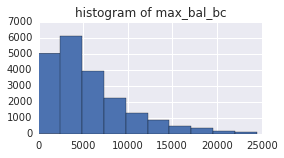



count    421523.000000
mean         33.710839
std          21.012661
min           2.000000
25%          16.000000
50%          31.000000
75%          49.000000
max          79.000000
Name: mths_since_last_delinq, dtype: float64


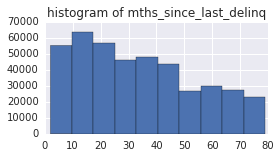



count    216414.000000
mean         43.955562
std          20.640259
min           5.000000
25%          27.000000
50%          44.000000
75%          61.000000
max          94.000000
Name: mths_since_last_major_derog, dtype: float64


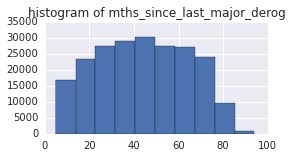



count    133204.000000
mean         69.980901
std          26.821035
min           3.000000
25%          51.000000
50%          70.000000
75%          91.000000
max         117.000000
Name: mths_since_last_record, dtype: float64


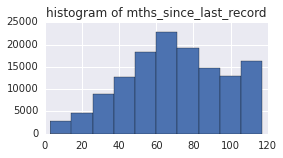



count    20028.000000
mean        19.954314
std         23.047888
min          2.000000
25%          6.000000
50%         12.000000
75%         23.000000
max        133.000000
Name: mths_since_rcnt_il, dtype: float64


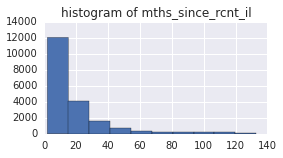



count    864040.000000
mean         11.423556
std           4.732027
min           4.000000
25%           8.000000
50%          11.000000
75%          14.000000
max          27.000000
Name: open_acc, dtype: float64


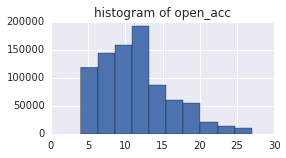



count    12725.000000
mean         1.681729
std          0.862388
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max          4.000000
Name: open_acc_6m, dtype: float64


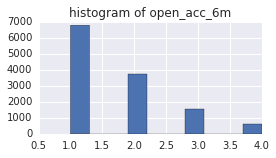



count    10167.000000
mean         1.416937
std          0.621410
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max          3.000000
Name: open_il_12m, dtype: float64


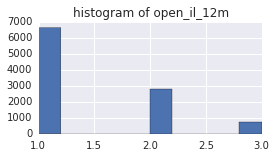



count    15516.000000
mean         2.102088
std          1.247267
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          6.000000
Name: open_il_24m, dtype: float64


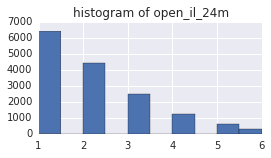



count    18831.000000
mean         3.092082
std          2.523352
min          1.000000
25%          1.000000
50%          2.000000
75%          4.000000
max         15.000000
Name: open_il_6m, dtype: float64


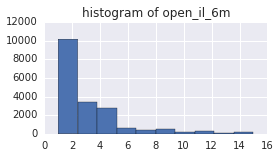



count    14081.000000
mean         1.979405
std          1.174602
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          6.000000
Name: open_rv_12m, dtype: float64


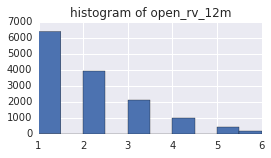



count    18285.000000
mean         3.301504
std          2.185987
min          1.000000
25%          2.000000
50%          3.000000
75%          4.000000
max         11.000000
Name: open_rv_24m, dtype: float64


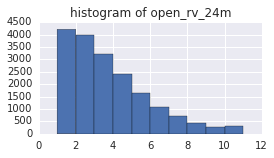



count    622687.000000
mean      11492.355190
std        7418.373707
min           0.010000
25%        5490.120000
50%       10057.050000
75%       16184.365000
max       32589.970000
Name: out_prncp, dtype: float64


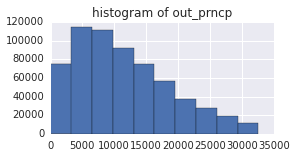



count    622697.000000
mean      11488.148406
std        7416.137513
min           0.010000
25%        5488.770000
50%       10051.860000
75%       16180.750000
max       32585.020000
Name: out_prncp_inv, dtype: float64


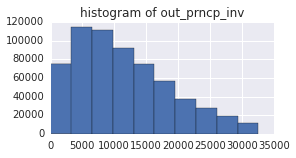



count    113266.0
mean          1.0
std           0.0
min           1.0
25%           1.0
50%           1.0
75%           1.0
max           1.0
Name: pub_rec, dtype: float64


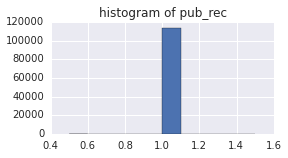



count    15803.000000
mean       681.408266
std        489.320445
min          0.250000
25%        255.475000
50%        622.100000
75%       1060.455000
max       1706.170000
Name: recoveries, dtype: float64


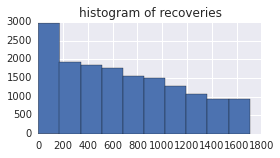



count    869620.000000
mean      15590.508559
std       13105.184319
min         310.000000
25%        6542.000000
50%       11875.000000
75%       20566.000000
max       93410.000000
Name: revol_bal, dtype: float64


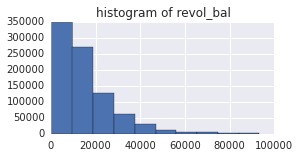



count    869002.000000
mean         55.151621
std          22.950289
min           2.300000
25%          38.100000
50%          56.000000
75%          73.200000
max          98.400000
Name: revol_util, dtype: float64


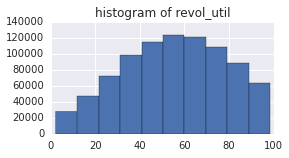



count    107985.000000
mean        650.661083
std         845.110906
min           2.000000
25%         123.000000
50%         305.000000
75%         789.000000
max        4605.000000
Name: tot_coll_amt, dtype: float64


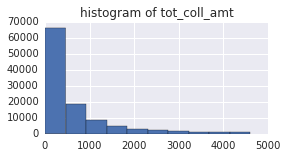



count    800758.000000
mean     133220.490554
std      130879.235970
min        3658.000000
25%       30394.000000
50%       80559.000000
75%      205228.750000
max      658992.000000
Name: tot_cur_bal, dtype: float64


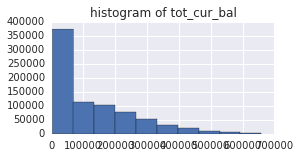



count    862654.000000
mean         25.144633
std          10.818525
min           7.000000
25%          17.000000
50%          24.000000
75%          32.000000
max          59.000000
Name: total_acc, dtype: float64


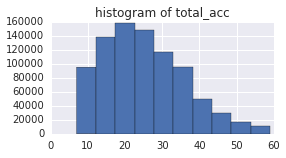



count     18899.000000
mean      38149.086671
std       34230.120270
min           7.000000
25%       14454.500000
50%       28091.000000
75%       50362.000000
max      204244.000000
Name: total_bal_il, dtype: float64


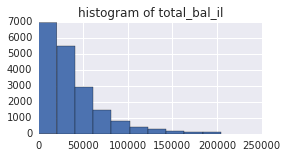



count    9660.000000
mean        3.009731
std         2.433229
min         1.000000
25%         1.000000
50%         2.000000
75%         4.000000
max        12.000000
Name: total_cu_tl, dtype: float64


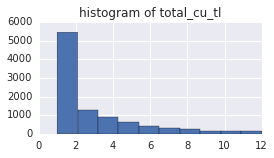



count    860746.000000
mean       7371.853874
std        7150.341166
min           0.180000
25%        2024.257500
50%        4978.405000
75%       10542.320000
max       36594.610000
Name: total_pymnt, dtype: float64


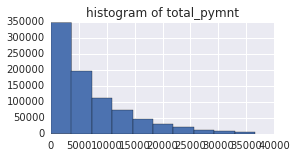



count    860468.000000
mean       7336.440105
std        7125.860005
min           0.180000
25%        2011.937500
50%        4943.925000
75%       10490.117500
max       36530.890000
Name: total_pymnt_inv, dtype: float64


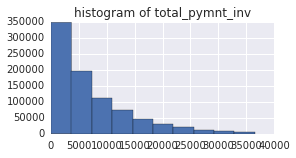



count    860291.000000
mean       1675.919574
std        1757.793936
min           0.010000
25%         468.335000
50%        1090.350000
75%        2221.150000
max       10275.100000
Name: total_rec_int, dtype: float64


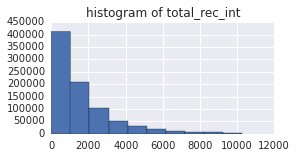



count    1353.000000
mean       14.484513
std         2.416074
min         0.010000
25%        14.951897
50%        14.974997
75%        14.987984
max        15.000000
Name: total_rec_late_fee, dtype: float64


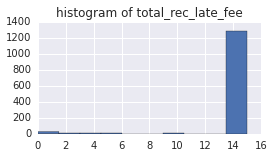



count    860357.000000
mean       5585.808499
std        6015.568614
min           0.180000
25%        1279.790000
50%        3280.390000
75%        7931.220000
max       30000.000000
Name: total_rec_prncp, dtype: float64


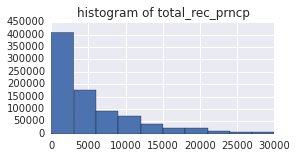



count    800241.000000
mean      30350.563242
std       23292.814859
min        3025.000000
25%       14100.000000
50%       23700.000000
75%       39300.000000
max      151570.000000
Name: total_rev_hi_lim, dtype: float64


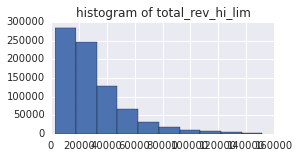

In [340]:
for col in num_vars[10:]:
    plot_hist(df_loan, col, True)

Nothing really surprising here as most of the variables can fall into the 5 categories of distributions described previously. Yet apparently **pub_rec** seems to be a boolean variable as it only contains 2 elements, and **total_rec_late_fee** (though very small sample size, ~1.3k) is mostly close to 14.99. 

### 3.2 Categorical Variables

In [341]:
# helper function to plot categorical variables
def plot_cat_var(df, col):
    n = 20
    _df = DataFrame(df[col].value_counts()).rename(columns={col: 'count'})
    _df['pct'] = _df['count'].astype(float) / _df['count'].sum()
    _df['cum_pct'] = _df['pct'].cumsum()
    print 'variable: ' + col
    print _df[:n] # top n
    _df[:n]['count'].plot(kind='bar', title='histogram of ' + col, figsize=(8, 4))
#     _df['pct'].plot(kind='bar', title='histogram of ' + col, figsize=(4, 2))
    plt.show()
    print ''
    print ''

variable: addr_state
     count       pct   cum_pct
CA  129517  0.145955  0.145955
NY   74086  0.083489  0.229443
TX   71138  0.080166  0.309610
FL   60935  0.068669  0.378278
IL   35476  0.039978  0.418256
NJ   33256  0.037477  0.455733
PA   31393  0.035377  0.491110
OH   29631  0.033392  0.524502
GA   29085  0.032776  0.557278
VA   26255  0.029587  0.586865
NC   24720  0.027857  0.614723
MI   22985  0.025902  0.640625
MD   21031  0.023700  0.664325
MA   20593  0.023207  0.687531
AZ   20412  0.023003  0.710534
WA   19434  0.021900  0.732435
CO   18807  0.021194  0.753628
MN   15957  0.017982  0.771611
MO   14207  0.016010  0.787621
IN   13789  0.015539  0.803160


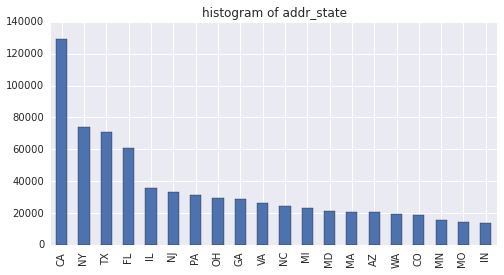



variable: application_type
             count       pct   cum_pct
INDIVIDUAL  886868  0.999424  0.999424
JOINT          511  0.000576  1.000000


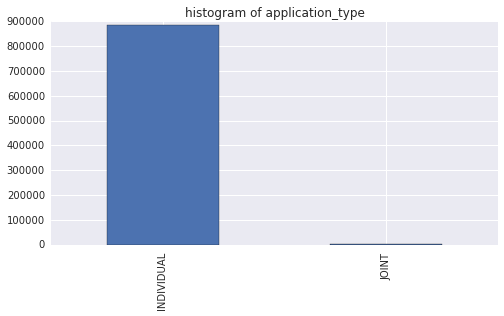



variable: desc
                                                    count       pct   cum_pct
                                                      246  0.001952  0.001952
Debt Consolidation                                     13  0.000103  0.002055
  Borrower added on 03/17/14 > Debt consolidati...     11  0.000087  0.002142
  Borrower added on 03/10/14 > Debt consolidati...     10  0.000079  0.002222
  Borrower added on 02/19/14 > Debt consolidati...      9  0.000071  0.002293
Camping Membership                                      8  0.000063  0.002357
  Borrower added on 01/29/14 > Debt consolidati...      8  0.000063  0.002420
  Borrower added on 01/22/14 > Debt consolidati...      7  0.000056  0.002476
  Borrower added on 01/15/14 > Debt consolidati...      7  0.000056  0.002531
  Borrower added on 03/18/14 > Debt consolidati...      6  0.000048  0.002579
  Borrower added on 02/06/14 > Debt consolidati...      6  0.000048  0.002626
  Borrower added on 02/26/14 > Debt Consolidati

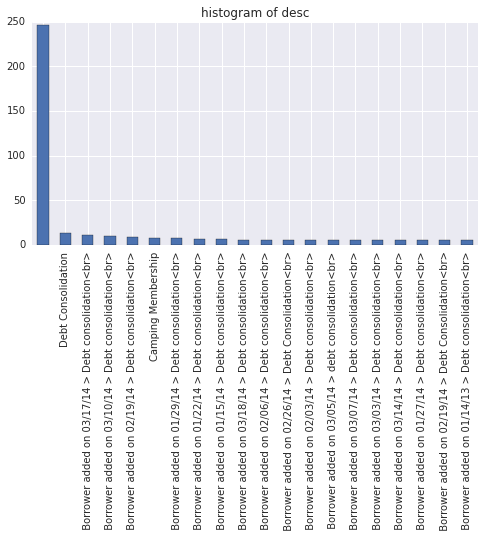



variable: emp_length
            count       pct   cum_pct
10+ years  291569  0.328573  0.328573
2 years     78870  0.088880  0.417453
< 1 year    70605  0.079566  0.497019
3 years     70026  0.078913  0.575932
1 year      57095  0.064341  0.640273
5 years     55704  0.062774  0.703047
4 years     52529  0.059196  0.762243
n/a         44825  0.050514  0.812756
7 years     44594  0.050254  0.863010
8 years     43955  0.049534  0.912544
6 years     42950  0.048401  0.960945
9 years     34657  0.039055  1.000000


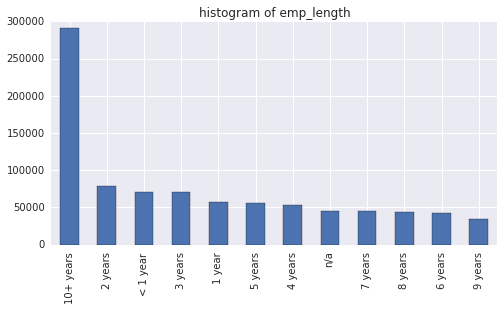



variable: emp_title
                  count       pct   cum_pct
Teacher           13469  0.016113  0.016113
Manager           11240  0.013446  0.029559
Registered Nurse   5525  0.006609  0.036168
Owner              5376  0.006431  0.042600
RN                 5355  0.006406  0.049006
Supervisor         4983  0.005961  0.054967
Sales              4212  0.005039  0.060006
Project Manager    3988  0.004771  0.064776
Driver             3569  0.004270  0.069046
Office Manager     3510  0.004199  0.073245
General Manager    3178  0.003802  0.077047
Director           3156  0.003775  0.080822
manager            3138  0.003754  0.084576
teacher            2925  0.003499  0.088075
owner              2849  0.003408  0.091483
Engineer           2671  0.003195  0.094679
President          2598  0.003108  0.097787
driver             2429  0.002906  0.100692
Vice President     2351  0.002812  0.103505
Attorney           2136  0.002555  0.106060


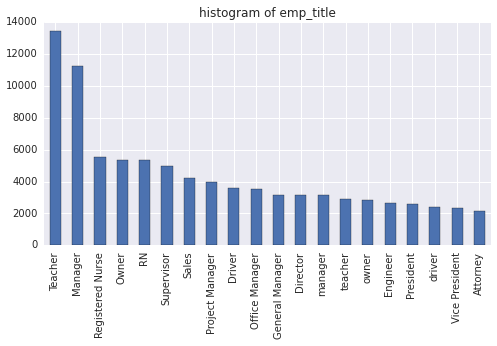



variable: grade
    count       pct   cum_pct
B  254535  0.286839  0.286839
C  245860  0.277063  0.563902
A  148202  0.167011  0.730913
D  139542  0.157252  0.888165
E   70705  0.079678  0.967844
F   23046  0.025971  0.993814
G    5489  0.006186  1.000000


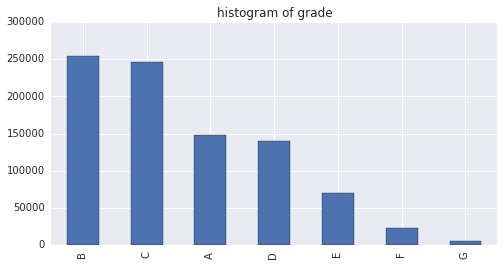



variable: home_ownership
           count       pct   cum_pct
MORTGAGE  443557  0.499851  0.499851
RENT      356117  0.401313  0.901164
OWN        87470  0.098571  0.999735
OTHER        182  0.000205  0.999940
NONE          50  0.000056  0.999997
ANY            3  0.000003  1.000000


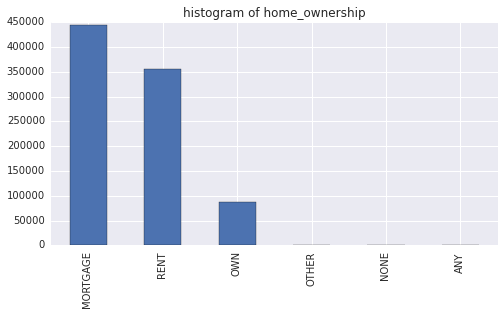



variable: initial_list_status
    count       pct   cum_pct
f  456848  0.514829  0.514829
w  430531  0.485171  1.000000


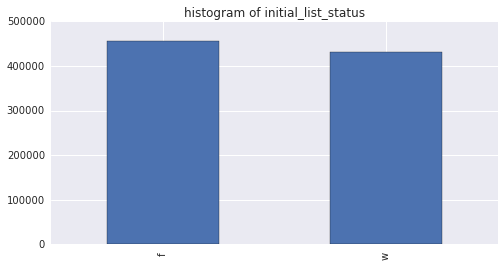



variable: loan_status
                                                     count       pct   cum_pct
Current                                             601779  0.678153  0.678153
Fully Paid                                          207723  0.234086  0.912239
Charged Off                                          45248  0.050991  0.963230
Late (31-120 days)                                   11591  0.013062  0.976292
Issued                                                8460  0.009534  0.985826
In Grace Period                                       6253  0.007047  0.992872
Late (16-30 days)                                     2357  0.002656  0.995528
Does not meet the credit policy. Status:Fully Paid    1988  0.002240  0.997769
Default                                               1219  0.001374  0.999142
Does not meet the credit policy. Status:Charged...     761  0.000858  1.000000


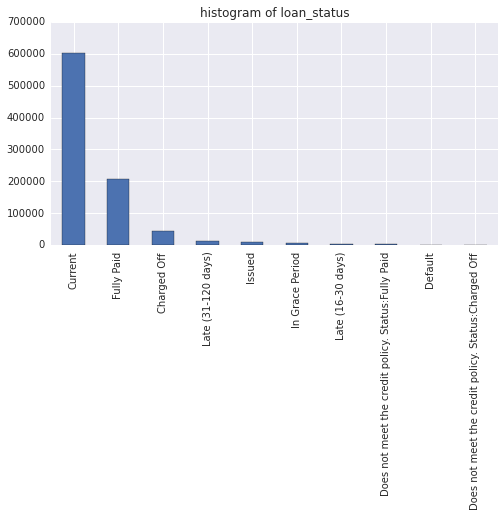



variable: purpose
                     count       pct   cum_pct
debt_consolidation  524215  0.590745  0.590745
credit_card         206182  0.232349  0.823095
home_improvement     51829  0.058407  0.881502
other                42894  0.048338  0.929839
major_purchase       17277  0.019470  0.949309
small_business       10377  0.011694  0.961003
car                   8863  0.009988  0.970991
medical               8540  0.009624  0.980615
moving                5414  0.006101  0.986716
vacation              4736  0.005337  0.992053
house                 3707  0.004177  0.996230
wedding               2347  0.002645  0.998875
renewable_energy       575  0.000648  0.999523
educational            423  0.000477  1.000000


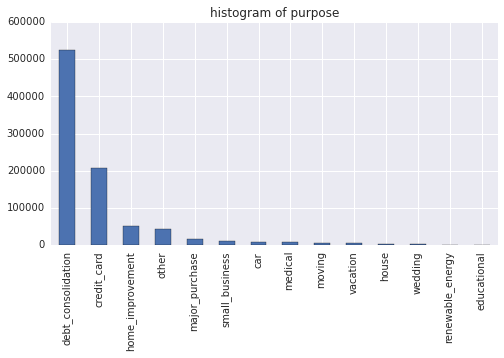



variable: pymnt_plan
    count       pct   cum_pct
n  887369  0.999989  0.999989
y      10  0.000011  1.000000


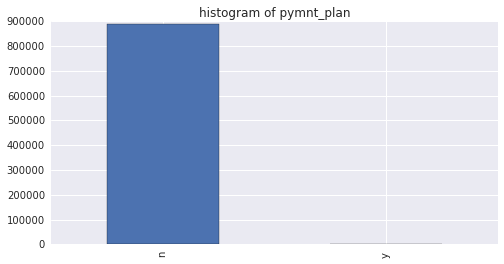



variable: sub_grade
    count       pct   cum_pct
B3  56323  0.063471  0.063471
B4  55626  0.062686  0.126157
C1  53387  0.060163  0.186319
C2  52236  0.058865  0.245185
C3  50161  0.056527  0.301712
C4  48857  0.055058  0.356770
B5  48833  0.055031  0.411800
B2  48781  0.054972  0.466772
B1  44972  0.050680  0.517452
A5  44816  0.050504  0.567956
C5  41219  0.046450  0.614406
D1  36238  0.040837  0.655243
A4  34531  0.038913  0.694157
D2  29803  0.033585  0.727742
D3  26554  0.029924  0.757666
D4  25558  0.028802  0.786468
A3  23457  0.026434  0.812902
A1  22913  0.025821  0.838723
A2  22485  0.025339  0.864061
D5  21389  0.024104  0.888165


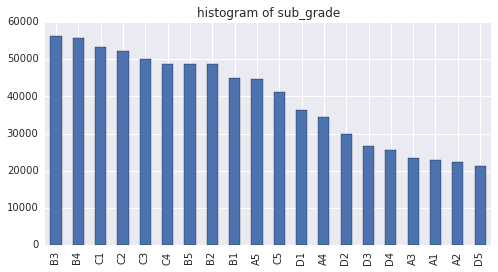



variable: term
             count       pct   cum_pct
 36 months  621125  0.699955  0.699955
 60 months  266254  0.300045  1.000000


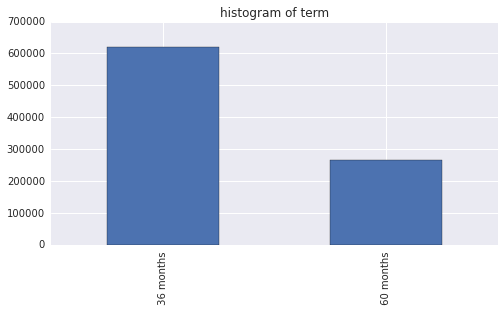



variable: title
                            count       pct   cum_pct
Debt consolidation         414001  0.466623  0.466623
Credit card refinancing    164331  0.185218  0.651841
Home improvement            40112  0.045210  0.697052
Other                       31892  0.035946  0.732998
Debt Consolidation          15760  0.017763  0.750761
Major purchase              12051  0.013583  0.764344
Business                     6728  0.007583  0.771927
Medical expenses             6674  0.007522  0.779449
Car financing                5565  0.006272  0.785721
Consolidation                5381  0.006065  0.791786
debt consolidation           4834  0.005448  0.797235
Moving and relocation        3921  0.004419  0.801654
Vacation                     3805  0.004289  0.805943
Debt Consolidation Loan      3804  0.004288  0.810230
Home buying                  2365  0.002666  0.812896
Credit Card Consolidation    2359  0.002659  0.815555
consolidation                2174  0.002450  0.818005
Personal L

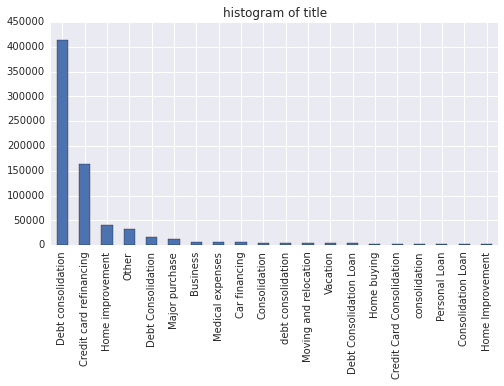



variable: verification_status
                  count       pct   cum_pct
Source Verified  329558  0.371384  0.371384
Verified         291071  0.328012  0.699396
Not Verified     266750  0.300604  1.000000


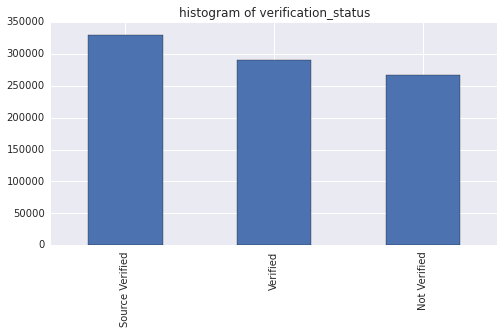



variable: verification_status_joint
                 count       pct   cum_pct
Not Verified       283  0.553816  0.553816
Verified           167  0.326810  0.880626
Source Verified     61  0.119374  1.000000


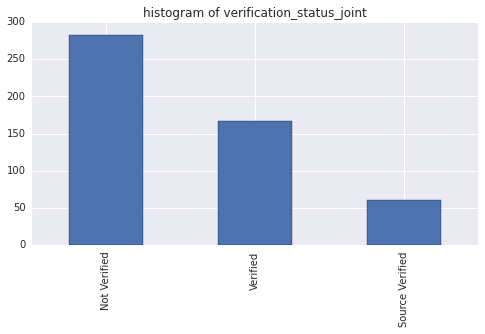



variable: zip_code
       count       pct   cum_pct
945xx   9770  0.011010  0.011010
750xx   9417  0.010612  0.021622
112xx   9272  0.010449  0.032071
606xx   8641  0.009738  0.041809
300xx   8126  0.009157  0.050966
100xx   7609  0.008575  0.059541
070xx   7431  0.008374  0.067915
331xx   7416  0.008357  0.076272
900xx   7287  0.008212  0.084484
770xx   6938  0.007819  0.092302
891xx   6441  0.007258  0.099561
917xx   6357  0.007164  0.106724
330xx   6283  0.007080  0.113805
117xx   6129  0.006907  0.120712
104xx   6008  0.006771  0.127482
921xx   5661  0.006379  0.133862
852xx   5442  0.006133  0.139994
926xx   5415  0.006102  0.146097
913xx   5160  0.005815  0.151911
925xx   4907  0.005530  0.157441


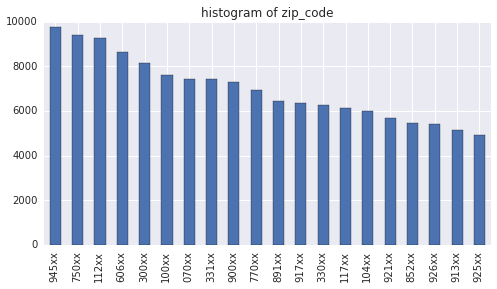

In [342]:
# iterate through each categorical variables
for col in cat_vars:
    plot_cat_var(df_loan, col)

### 3.3 Date Variables

Let's plot the time series by each date variable.

In [343]:
# helper function to plot categorical variables
def plot_date_var(df, col):
    _df = DataFrame(df[col].value_counts()).rename(columns={col:'count'})
    print 'variable: ' + col
#     print _df
    _df['count'].plot(title='line chart of ' + col, figsize=(8, 4))
    plt.show()
    print ''
    print ''

variable: issue_d


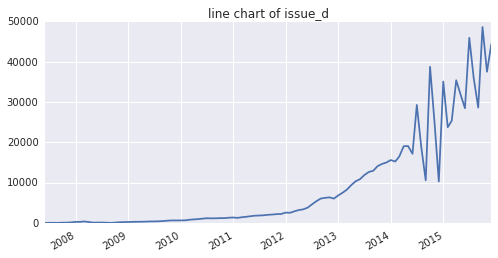



variable: last_pymnt_d


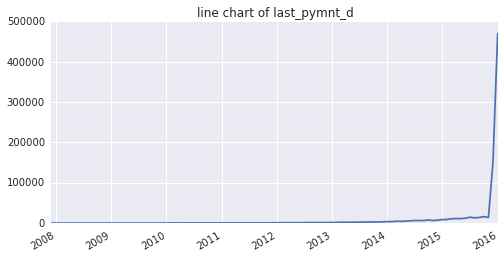



variable: next_pymnt_d


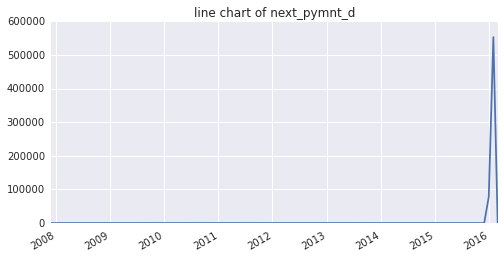



variable: last_credit_pull_d


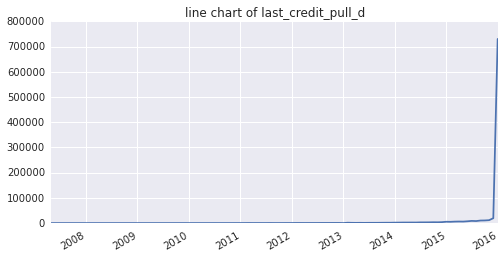



variable: earliest_cr_line


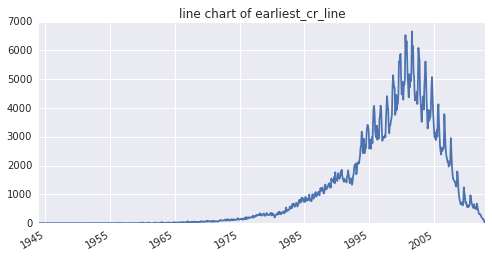

In [344]:
# iterate through each date variable
for col in date_vars:
    plot_date_var(df_loan, col)

As the first line chart (**issue_d**) shows, the number of loans increases steadily since 2007 and throughout the next 9 years. However, the trend has been quite volatile the middle of 2014. 

The time series chart for other 3 really doesn't make so much sense simply by visuliasing it by its date scale, as its status is dynamic depending on how recent it is. 

## Section 4. Bivariate Analysis

After performing the univariate analysis, we have been able to gain a fundamental understanding of the dataset. Now it is time to investigate how each variable correlates with each other.

Yet, it is nice to look at all the combinations of each variable. However, we have 48 numeric variables and 17 categorical variables, and checking each combination of two out of the dataset will be quite expensive effort. C^2_48 = 1128 combinations! 

Therefore, we have to do some preprocessing of the dataset. 

### Section 4.0 Correlation Matrix

I wonder how the variables correlate with each other. Is there any relationship between two variables? How one variable affects another? 

We start by plotting a correlation matrix for numeric variables.

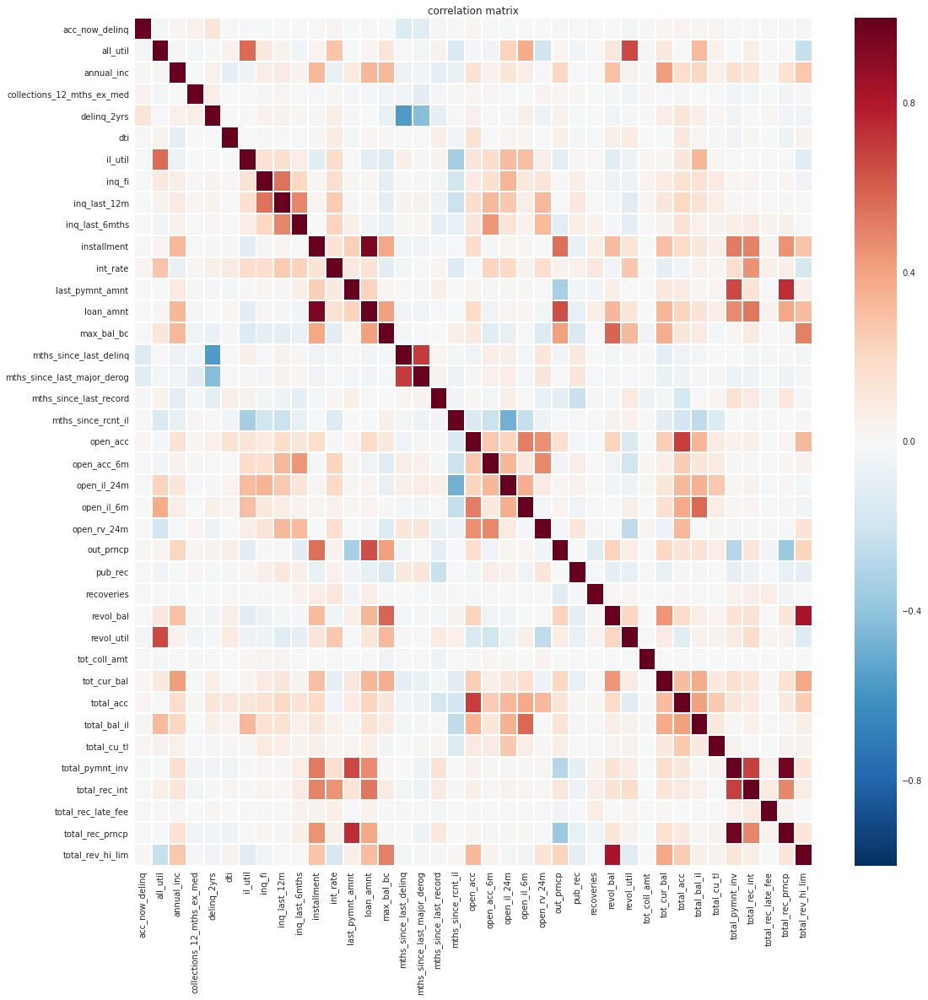

In [345]:
# sample size
n = 100000

# ignore the joint account related variables as there are too many missing values
_vars = list(set(num_vars).difference(set(['annual_inc_joint', 'dti_joint'])))

# get the correlation matrix from the variables
# df_corr = df_loan.sample(n).ix[:, sorted(_vars)].corr()
df_corr = df_loan.ix[:, sorted(_vars)].corr()

# filter out the variables by removing redundent variables
vars_red = df_corr[(df_corr.abs() > 0.7) & (df_corr != 1.0)].dropna(how='all').index.tolist() # redundent variables
vars_red2 = [
    'revol_bal',
    'total_rev_hi_lim',
    'recoveries',
    'open_il_24m',
    'installment',
    'open_rv_24m',
    'last_pymnt_amnt',
    'loan_amnt',
    'total_pymnt_inv',
    'total_rec_prncp',
    'out_prncp']  # vars_red2 are manually selected by performing analysis in following section
vars_no_red = list(set(_vars).difference(vars_red)) + vars_red2  # non-redundent variables

_vars2 = sorted(vars_no_red)
df_corr2 = df_corr.ix[_vars2, _vars2]

# plot the heatmap of correlation matrix
plt.figure(figsize=(18, 18))
plt.title('correlation matrix')
sns.heatmap(df_corr2.fillna(0), 
#             annot=True,
            cmap='RdBu_r', vmin=-1., vmax=1.)
sns.plt.show()

### Section 4.0.1 Principle Component Analysis of Correlation Matrix

Looking at the whole correlation matrix will be quite overwhelming. Therefore we apply PCA on it in order to remove redundent variables that are highly correlated with each other. 

Below analysis follows [the tutorial about feature selection from on R-bloggers](http://www.r-bloggers.com/introduction-to-feature-selection-for-bioinformaticians-using-r-correlation-matrix-filters-pca-backward-selection/).

,x,y,radius,label
13,0.157826,-0.310676,0.348467,revol_bal
17,0.066713,-0.348795,0.355117,total_rev_hi_lim
12,-0.943810,-0.384957,1.019298,recoveries
0,-0.951120,-0.404086,1.033399,collection_recovery_fee
7,-1.000501,-0.542041,1.137897,open_il_24m
6,-1.086684,-0.524694,1.206725,open_il_12m
3,1.216949,0.272166,1.247012,installment
9,-1.138982,-0.531623,1.256942,open_rv_24m
4,-0.571854,1.162987,1.295977,last_pymnt_amnt
8,-1.192770,-0.517393,1.300152,open_rv_12m


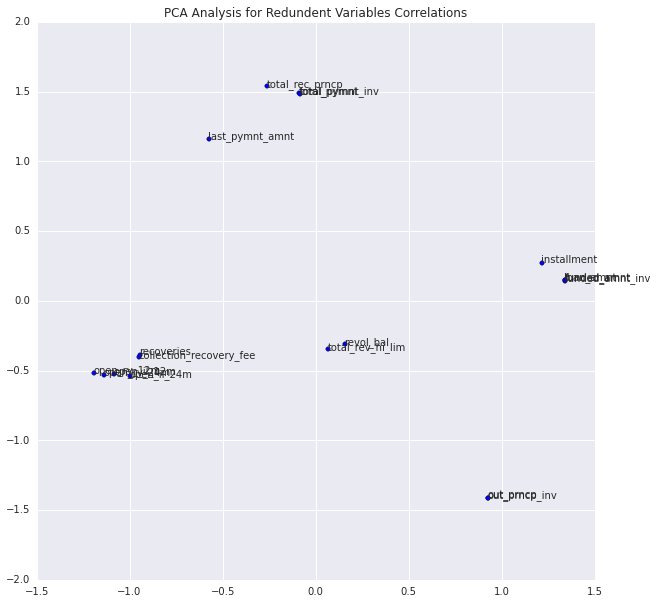

In [434]:
def pca_analysis(df_corr, vars, title=None):
    # apply PCA to find out the redundent variables
    from sklearn.decomposition import PCA
    pca = PCA(n_components=2)
    _df = DataFrame(pca.fit_transform(df_corr.fillna(0).ix[vars, vars])).rename(columns={0: 'x', 1: 'y'})
    _df['radius'] = (_df.x**2 + _df.y**2)**0.5
    _df['label'] = vars
    display_html(HTML(_df.sort_values('radius').to_html()))
    plt.figure(figsize=(10, 10))
    plt.scatter(_df.x, _df.y, alpha=1, marker='o')
    if title is not None:
        plt.title(title)
    for _x, _y, _l in zip(_df.x, _df.y, _df.label):
        plt.annotate(_l, (_x, _y))
    plt.show()

pca_analysis(df_corr=df_corr, vars=vars_red, title='PCA Analysis for Redundent Variables Correlations')

By looking at the visualization from PCA results above, we can conclude the redundent variables can be categorised into following groups:
- revol_bal
- total_rev_hi_lim
- recoveries, collection_recovery_fee
- open_il_24m, open_il_12m
- installment
- open_rv_24m, open_rv_12m
- last_pymnt_amnt
- loan_amnt, funded_amnt_inv, funded_amnt
- total_pymnt_inv, total_pymnt
- total_rec_prncp
- out_prncp, out_prncp_inv

Then we choose one from each group which contribute to variable *vars_red2* (redundent variables).

,x,y,radius,label
4,-0.191350,-0.105303,0.218411,delinq_2yrs
33,-0.264931,0.092615,0.280653,total_cu_tl
5,-0.260141,-0.261321,0.368730,dti
1,-0.372842,-0.051467,0.376377,all_util
0,-0.212248,-0.358426,0.416556,acc_now_delinq
11,-0.376392,-0.241478,0.447194,int_rate
36,-0.178982,-0.459614,0.493233,total_rec_late_fee
26,-0.204429,-0.452465,0.496504,recoveries
29,-0.320476,-0.412164,0.522096,tot_coll_amt
3,-0.340667,-0.406450,0.530335,collections_12_mths_ex_med


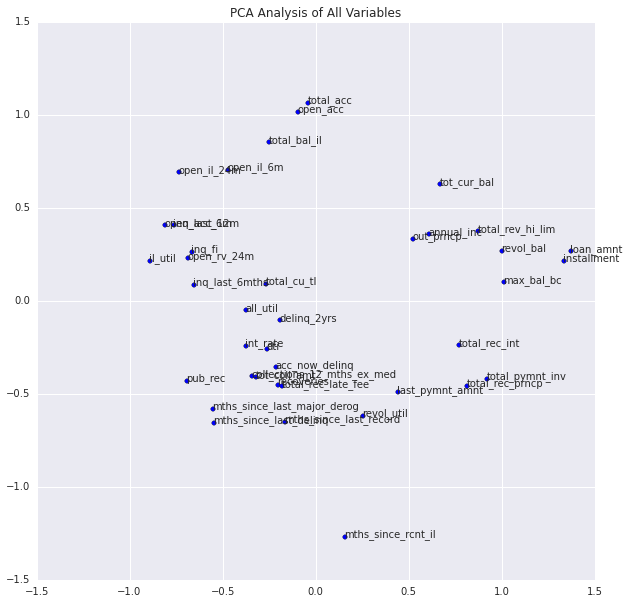

In [436]:
# same analysis for all numeric variables
pca_analysis(df_corr=df_corr, vars=num_vars2, title='PCA Analysis of All Variables')

In [347]:
# re-assign numeric variables after removing the redundent
num_vars2 = sorted(vars_no_red)

In [348]:
print "Number of numeric variables before/after removing redundent"
print "Before: {}".format(len(num_vars))
print "After: {}".format(len(num_vars2))

Number of numeric variables before/after removing redundent
Before: 48
After: 39


Now I am able to determine the target variables I will be looking at in depth.

In [349]:
# target variables
target_vars = [
    'int_rate',
    'dti',
    'loan_amnt',
    'installment',
    'annual_inc',
    'out_prncp',
    'open_acc',
    'last_pymnt_amnt',
]

### Section 4.1 Interest Rate

Let's start by investigating the interest rate (**int_rate**). Previously, the basic univariate analysis indicates

I wonder how the histogram looks like when we increase the number of bins.

In [372]:
# helper function to plot both histogram and kde plot
def plot_hist_kde(df, col, no_outliers=True, sample=None, figsize=(8, 4), bins=None, **kwargs):
    if no_outliers:
        df = remove_outliers(df, col, 1)
    if sample is not None:
        df = df.sample(sample)

    # histogram
    fig, ax1 = plt.subplots(figsize=figsize)
    ax1.hist(df[col].dropna().tolist(), bins=bins)  
    ax1.set_ylabel('count')
    
    # kde plot
    ax2 = ax1.twinx()
    sns.kdeplot(df[col], ax=ax2, color='g')
    ax2.set_ylabel('kernel density', color='g')
    for t2 in ax2.get_yticklabels():
        t2.set_color('g')
    
    plt.show()

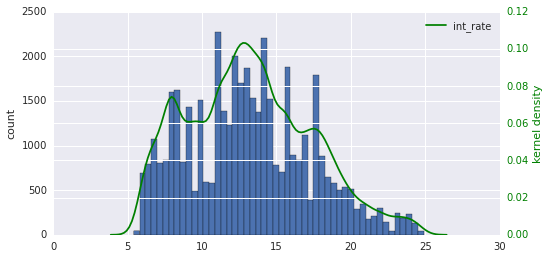

In [351]:
plot_hist_kde(df_loan, 'int_rate', True, sample=df_loan.shape[0] / 20, figsize=(8, 4), bins=50)

Interest rate seems to be a multi-modal distribution peaking around 7.5, 12.5 and 17.5. If we look closely, it appears there are three more hidden peaks around 11, 16 and 24 as well. This implies it could be shaped by 6 individual gaussian disributions with different params. Let's find out by plotting the joint plots with other numeric variables and boxplots with other categorical variables.

First let's make some helper functions for the plottings below.

In [352]:
######################
# numeric variables  #
######################

# helper function to plot bivariate kde/scatter/hex plot between two variables
def plot_scatter(df, x_col, y_col, sample=None, sample_frac=None, no_outliers=True, kind='kde', **kwargs):
    if no_outliers:
        df = remove_outliers(df, x_col, n=1)
        df = remove_outliers(df, y_col, n=1)
    if df.shape[0] == 0:
        return
    if sample is not None:
        df = df.sample(min(sample, df.shape[0]))
    if sample_frac is not None:
        df = df.sample(frac=sample_frac)
    print "{} vs {}".format(y_col, x_col)
    plt.figure(figsize=(4, 4))
    sns.jointplot(data=df, x=x_col, y=y_col, kind=kind)
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.show()
    print ''
    print ''

# helper function to plot bivariate kde/scatter/hex plot between target variable and other variables
def plot_bivar_joint_plots(df, target_var, other_vars, sample=None, sample_frac=50, kind='kde', **kwargs):
    if sample is None:
        # take 1/50 of total dataset as sample. 
        # For performance consideration, do not take too large sample size if joint plot kind is set to 'kde'
        sample = df.shape[0] / 50
    print """
    
    ################### {} ##################
    
    """.format(target_var)
    for col in other_vars:
        if col == target_var:
            continue

        plot_scatter(df, target_var, col, sample=sample, sample_frac=sample_frac, kind=kind, **kwargs)  

        
##########################
# categorical variables  #
##########################

def plot_box(df, col, cat, sample=None, describe=True, no_outliers=True, **kwargs):
    print "{} by {}".format(col, cat)
    if no_outliers:
        df = remove_outliers(df, col, 1)
    if sample is not None:
        df = df.sample(sample)
    if df[cat].cat.categories.shape[0] > 50:
        print "Cardinality too large to plot. Cardinality {}. Not displayed.".format(df[cat].cat.categories.shape[0])
    elif df.shape[0] == 0:
        print "No data. Not displayed."
    else:    
        if describe:
            html = df.groupby(cat, as_index=1)[col].describe().reset_index()\
                .pivot_table(index=cat, columns='level_1', values=col).to_html()
            display_html(html, raw=True)
        df.boxplot(column=[col], by=[cat], **kwargs)
        plt.show()
    print ''
    print ''

def plot_bivar_box_plots(df, target_var, other_vars, sample=None, describe=True, **kwargs):
    for var in other_vars:
        plot_box(df_loan, target_var, var, sample=None, vert=0, describe=describe, **kwargs)
        

#################
# all together  #
#################
def plot_bivar_all(df, target_var, num_vars, cat_vars, sample=None, sample_frac=None, describe=True, joint_kind='kde', **kwargs):
    plot_bivar_joint_plots(df, target_var, other_vars=num_vars, sample=sample, sample_frac=None, kind=joint_kind, **kwargs)
    plot_bivar_box_plots(df, target_var, other_vars=cat_vars, sample=sample, describe=describe, **kwargs)


    
    ################### int_rate ##################
    
    
all_util vs int_rate


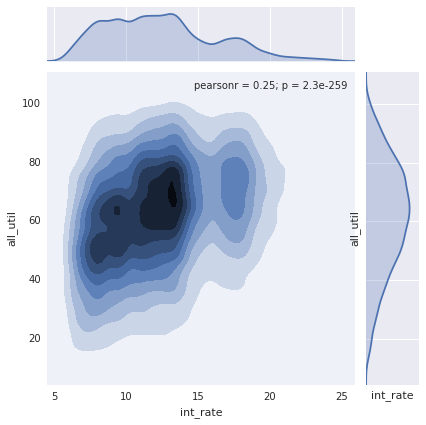



annual_inc vs int_rate


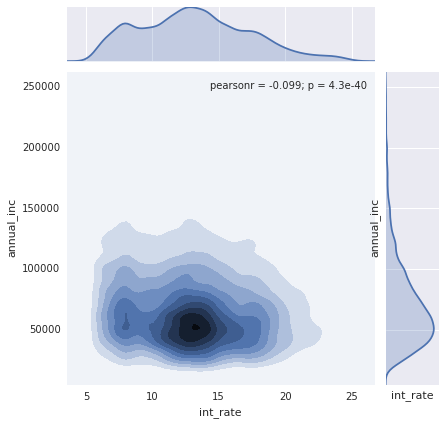



delinq_2yrs vs int_rate


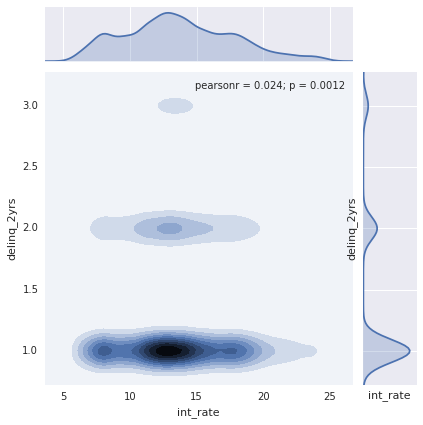



dti vs int_rate


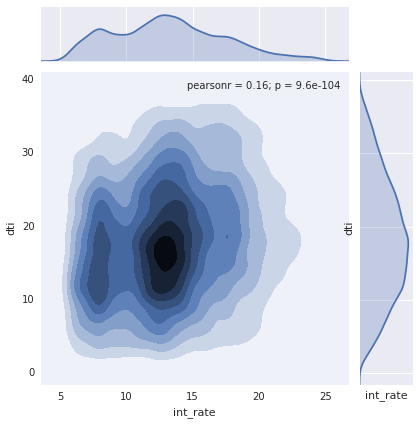



il_util vs int_rate


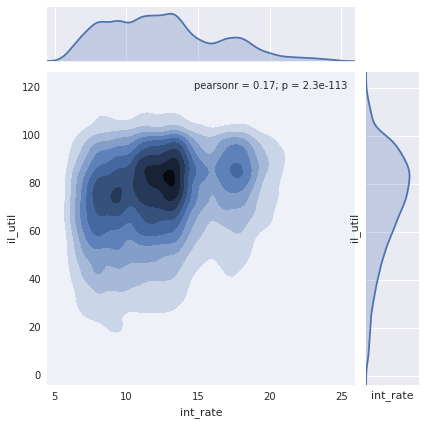



inq_fi vs int_rate


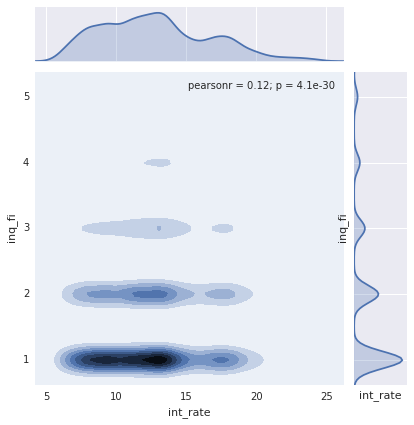



inq_last_12m vs int_rate


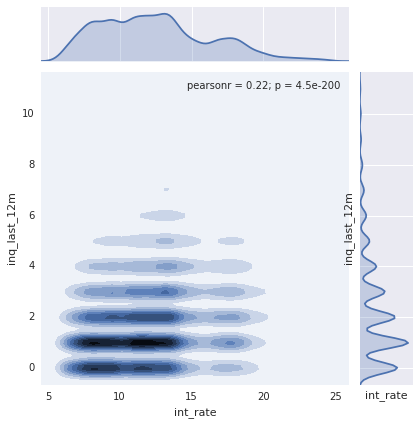



inq_last_6mths vs int_rate


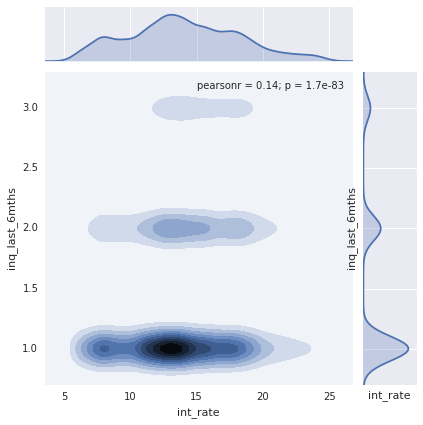



installment vs int_rate


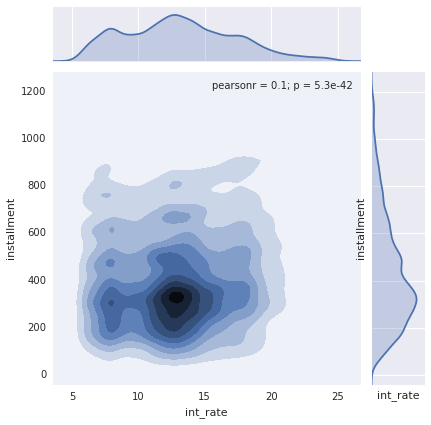



last_pymnt_amnt vs int_rate


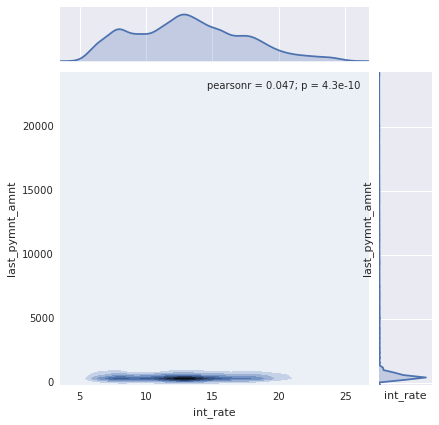



loan_amnt vs int_rate


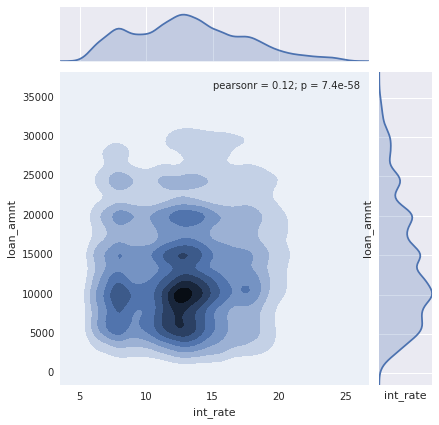



max_bal_bc vs int_rate


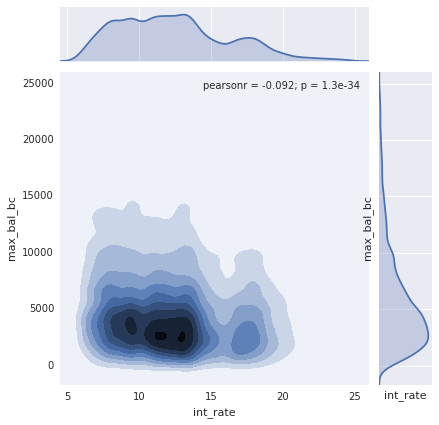



mths_since_last_delinq vs int_rate


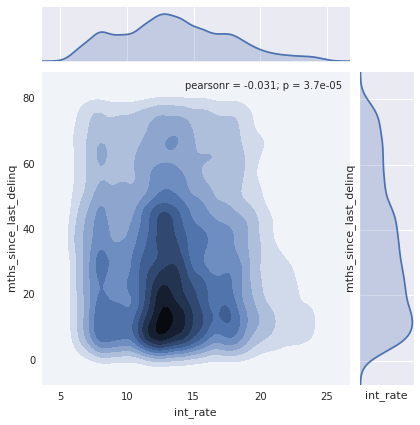



mths_since_last_major_derog vs int_rate


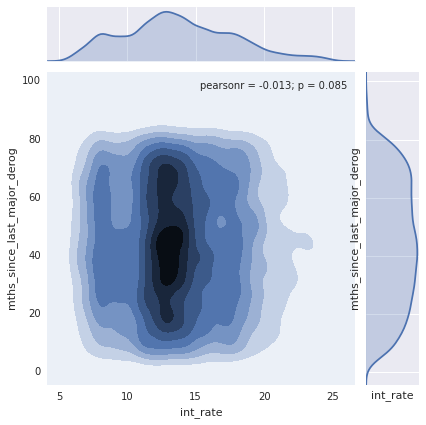



mths_since_last_record vs int_rate


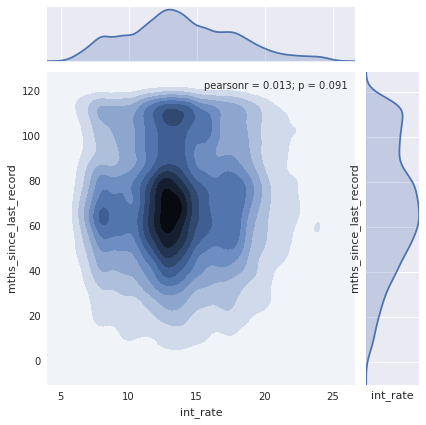



mths_since_rcnt_il vs int_rate


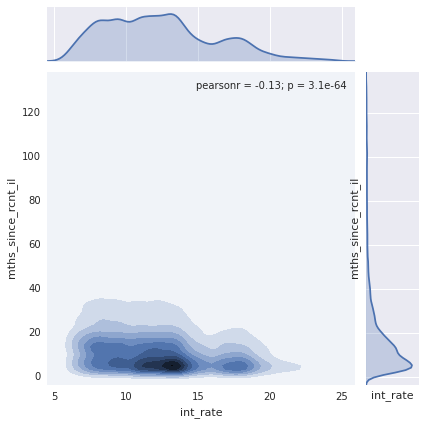



open_acc vs int_rate


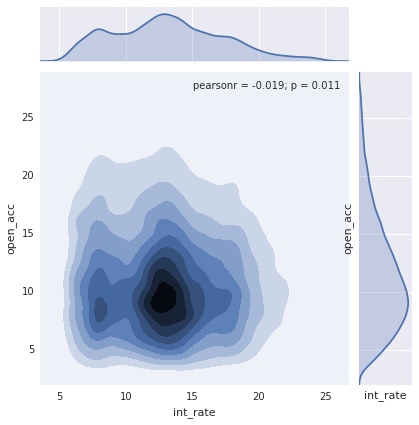



open_acc_6m vs int_rate


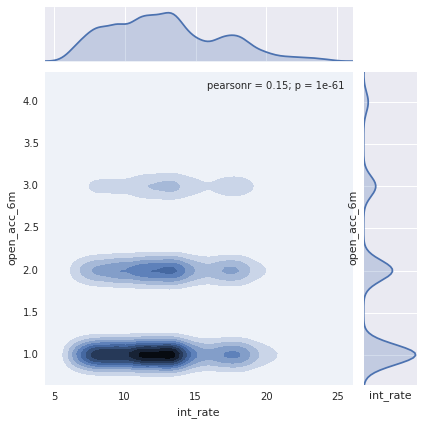



open_il_24m vs int_rate


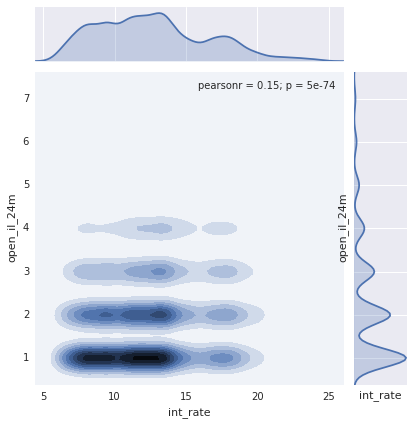



open_il_6m vs int_rate


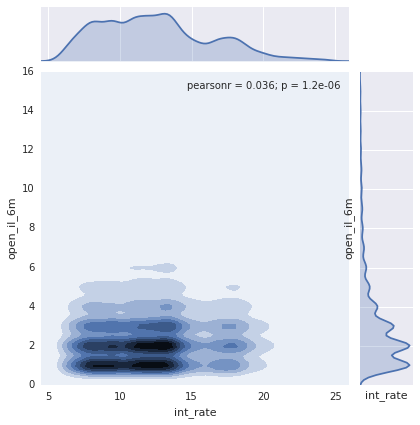



open_rv_24m vs int_rate


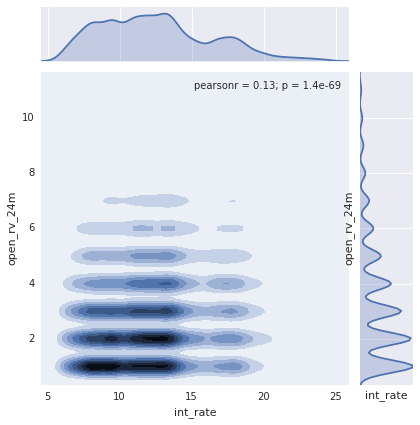



out_prncp vs int_rate


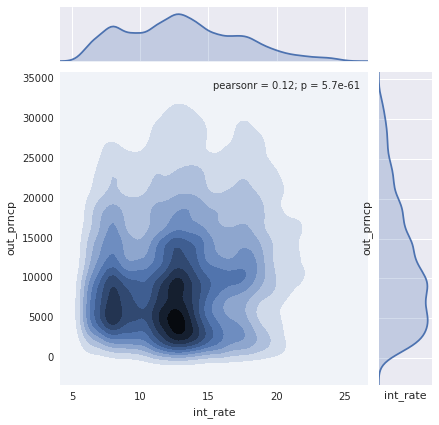



pub_rec vs int_rate


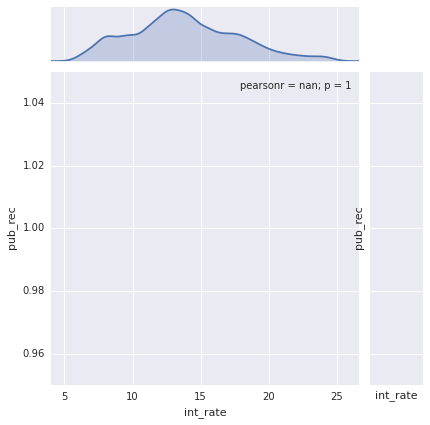



recoveries vs int_rate


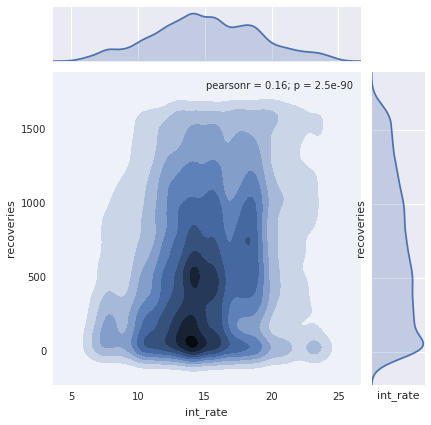



revol_bal vs int_rate


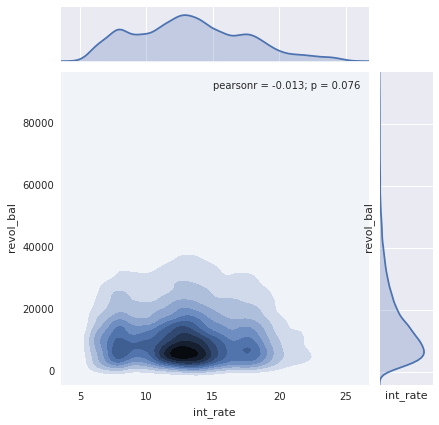



revol_util vs int_rate


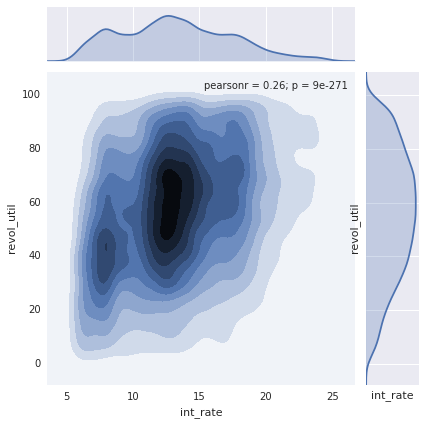



tot_coll_amt vs int_rate


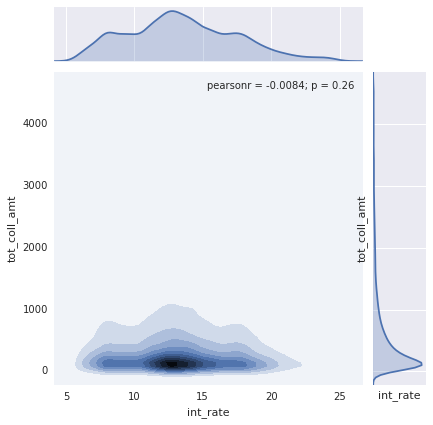



tot_cur_bal vs int_rate


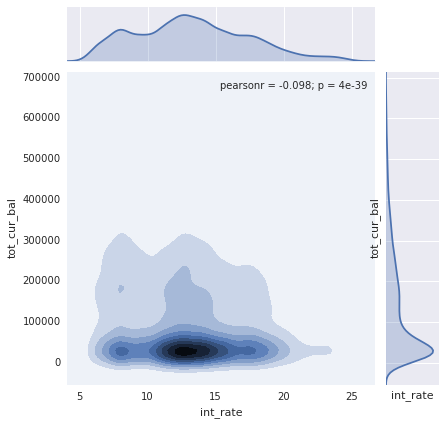



total_acc vs int_rate


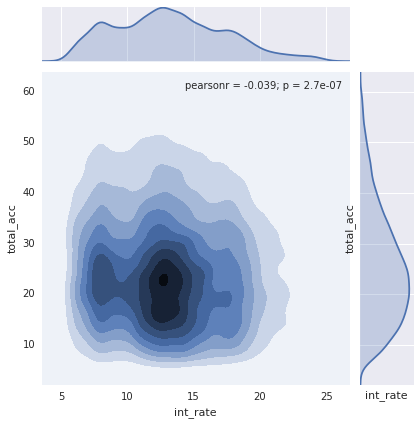



total_bal_il vs int_rate


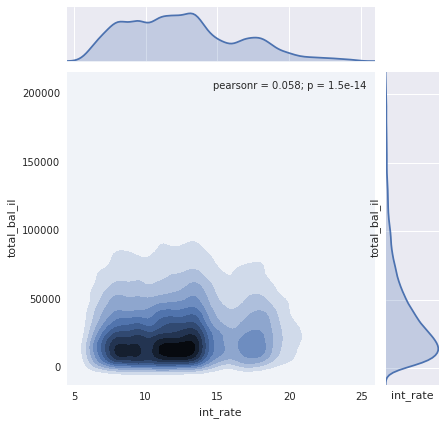



total_cu_tl vs int_rate


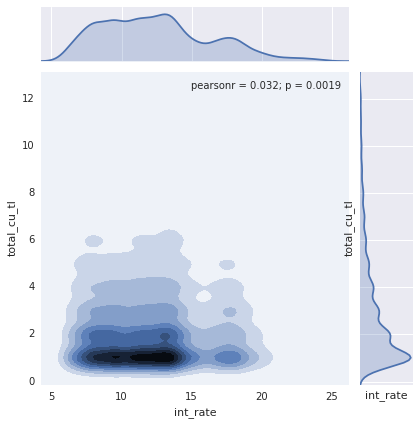



total_pymnt_inv vs int_rate


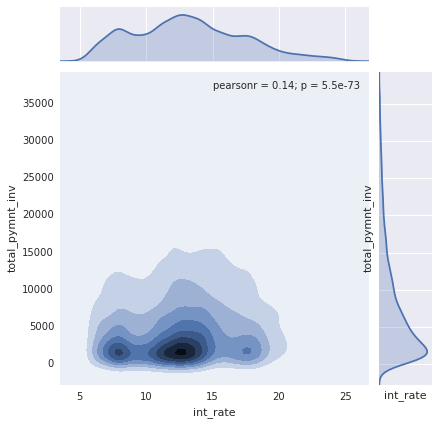



total_rec_int vs int_rate


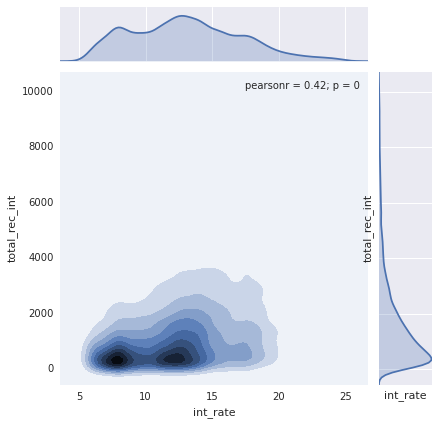



total_rec_late_fee vs int_rate


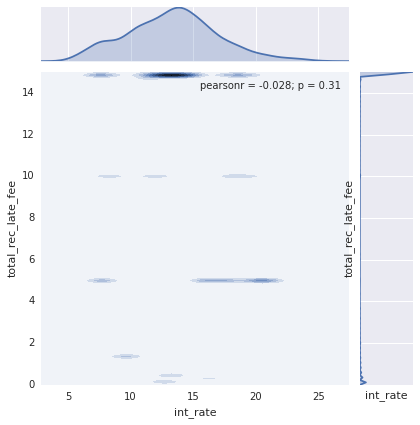



total_rec_prncp vs int_rate


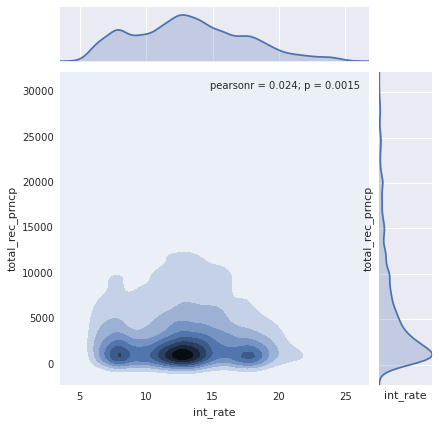



total_rev_hi_lim vs int_rate


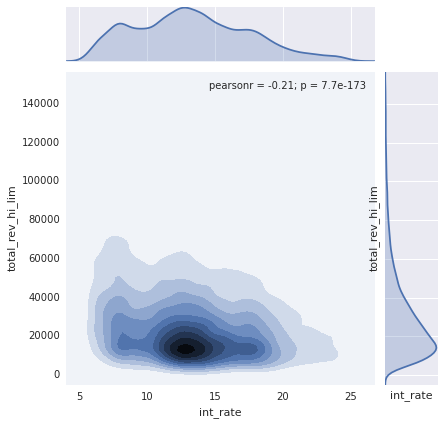



int_rate by addr_state
Cardinality too large to plot. Cardinality 51. Not displayed.


int_rate by application_type


level_1,25%,50%,75%,count,max,mean,min,std
application_type,,,,,,,,
INDIVIDUAL,9.99,12.99,15.99,868210.0,24.89,13.203485,5.42,4.155639
JOINT,11.99,14.48,17.86,495.0,23.99,14.798707,6.89,3.811045


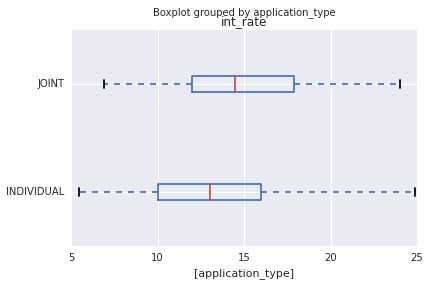



int_rate by desc
Cardinality too large to plot. Cardinality 124470. Not displayed.


int_rate by emp_length


level_1,25%,50%,75%,count,max,mean,min,std
emp_length,,,,,,,,
1 year,9.99,12.99,15.80,55972.0,24.89,13.145117,5.42,4.100481
10+ years,9.99,12.99,15.99,284950.0,24.89,13.218521,5.42,4.188545
2 years,9.99,12.99,15.80,77256.0,24.89,13.140248,5.42,4.127776
3 years,9.99,12.99,15.80,68594.0,24.89,13.125918,5.42,4.123802
4 years,9.99,12.99,15.95,51545.0,24.89,13.173123,5.42,4.138039
5 years,9.99,12.99,15.99,54670.0,24.89,13.225994,5.42,4.188870
6 years,10.15,13.11,16.24,42111.0,24.89,13.337923,5.42,4.179885
7 years,10.15,13.11,16.29,43727.0,24.89,13.382938,5.42,4.190299
8 years,9.99,12.99,15.99,42960.0,24.89,13.221432,5.42,4.159873


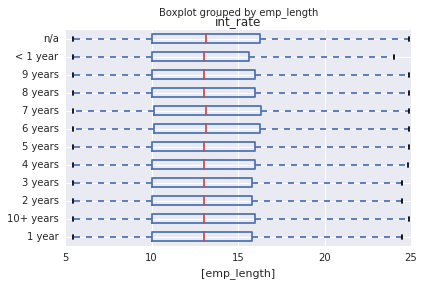



int_rate by emp_title
Cardinality too large to plot. Cardinality 299272. Not displayed.


int_rate by grade


level_1,25%,50%,75%,count,max,mean,min,std
grade,,,,,,,,
A,6.62,7.49,7.89,138551.0,9.63,7.377283,5.42,0.861494
B,9.76,10.99,11.83,254535.0,14.09,10.829618,6.00,1.443258
C,12.99,13.99,14.65,245860.0,17.27,13.980098,6.00,1.228535
D,16.29,16.99,17.86,139542.0,20.31,17.175814,6.00,1.242879
E,18.55,19.99,20.99,70705.0,23.40,19.897322,6.00,1.500429
F,22.99,23.43,23.99,18450.0,24.89,23.160645,6.00,1.422209
G,20.53,24.01,24.70,1062.0,24.89,22.625301,16.59,2.469232


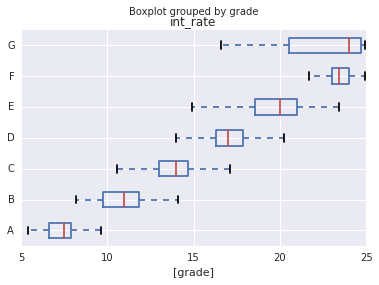



int_rate by home_ownership


level_1,25%,50%,75%,count,max,mean,min,std
home_ownership,,,,,,,,
ANY,13.075,14.48,15.515,3.0,16.55,14.233333,11.67,2.449333
MORTGAGE,9.670,12.69,15.610,433349.0,24.89,12.965321,5.42,4.202310
NONE,10.160,14.33,18.310,50.0,24.89,14.474200,7.43,4.856246
OTHER,11.480,13.19,15.310,182.0,23.63,13.462143,7.40,3.223840
OWN,9.990,12.99,16.200,85316.0,24.89,13.220233,5.42,4.170037
RENT,10.650,13.33,16.290,349805.0,24.89,13.496378,5.42,4.074692


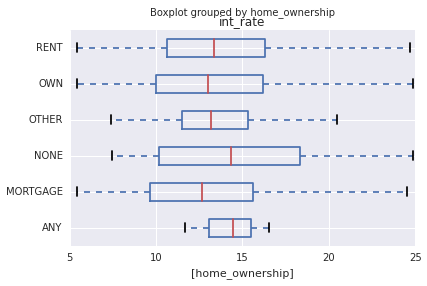



int_rate by initial_list_status


level_1,25%,50%,75%,count,max,mean,min,std
initial_list_status,,,,,,,,
f,10.64,13.33,16.55,449900.0,24.89,13.628967,5.42,4.185541
w,9.17,12.59,15.59,418805.0,24.89,12.748298,5.93,4.074248


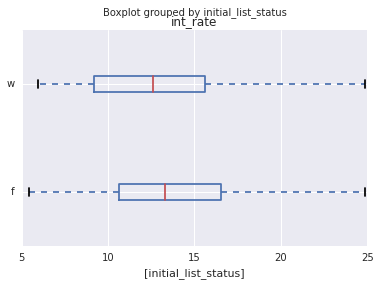



int_rate by loan_status


level_1,25%,50%,75%,count,max,mean,min,std
loan_status,,,,,,,,
Charged Off,12.9900,15.61,18.75,44225.0,24.89,15.794516,5.42,4.096167
Current,9.7600,12.69,15.61,586912.0,24.89,12.938614,5.93,4.084104
Default,12.9900,15.80,18.54,1183.0,24.89,15.847895,6.24,3.924428
Does not meet the credit policy. Status:Charged Off,12.8700,14.50,16.32,761.0,21.64,14.597148,7.43,2.664766
Does not meet the credit policy. Status:Fully Paid,12.3975,13.98,15.68,1988.0,21.64,13.978642,6.00,2.732150
Fully Paid,10.1500,13.11,15.80,206056.0,24.89,13.190335,5.42,4.145832
In Grace Period,12.2900,14.65,17.86,6071.0,24.89,15.078509,6.00,4.092374
Issued,9.1700,11.99,14.85,8061.0,24.24,12.590310,6.24,3.956099
Late (16-30 days),12.6900,15.31,18.25,2278.0,24.89,15.403433,6.03,4.056507


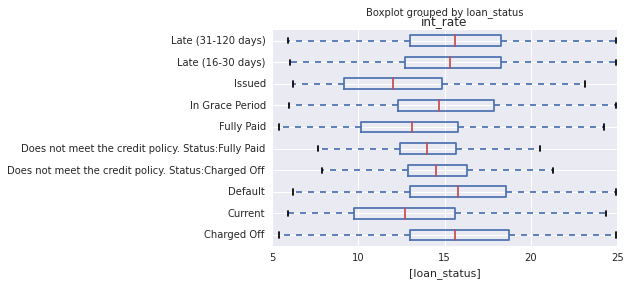



int_rate by purpose


level_1,25%,50%,75%,count,max,mean,min,std
purpose,,,,,,,,
car,8.1900,11.83,14.64,8714.0,24.50,11.971717,5.42,4.052857
credit_card,8.6700,11.67,14.30,201255.0,24.89,11.884484,5.42,3.807141
debt_consolidation,10.6400,13.33,16.29,514651.0,24.89,13.530799,5.42,4.103778
educational,10.2250,12.21,13.79,423.0,21.27,12.120142,6.00,2.731780
home_improvement,9.6700,12.69,15.65,50425.0,24.89,12.997113,5.42,4.256792
house,12.1200,15.59,18.49,3457.0,24.89,15.289806,5.42,4.578094
major_purchase,9.1700,12.49,15.61,16874.0,24.89,12.631397,5.42,4.262178
medical,11.5300,13.99,17.57,8365.0,24.89,14.384826,5.42,4.207363
moving,12.6900,15.59,18.25,5278.0,24.89,15.483742,5.42,4.137263


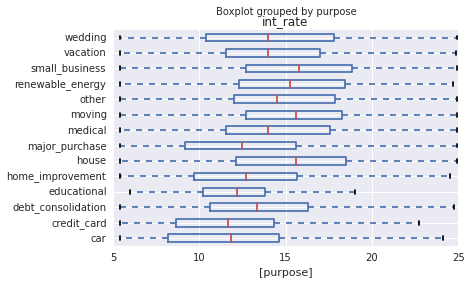



int_rate by pymnt_plan


level_1,25%,50%,75%,count,max,mean,min,std
pymnt_plan,,,,,,,,
n,9.990,12.990,15.990,868695.0,24.89,13.204348,5.42,4.155597
y,14.655,16.395,20.135,10.0,24.50,17.252000,9.62,4.649482


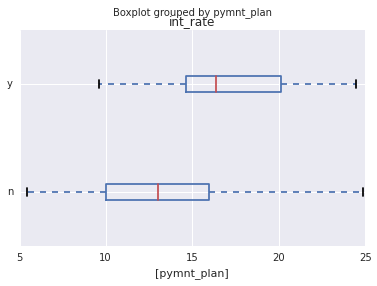



int_rate by sub_grade


level_1,25%,50%,75%,count,max,mean,min,std
sub_grade,,,,,,,,
A1,6.030,6.03,6.03,13262.0,7.37,5.997298,5.42,0.154550
A2,6.240,6.49,6.62,22485.0,7.68,6.425859,5.79,0.221711
A3,6.890,6.99,7.62,23457.0,8.00,7.141020,6.17,0.362312
A4,7.260,7.49,7.90,34531.0,9.32,7.529181,6.00,0.395069
A5,7.890,8.19,8.90,44816.0,9.63,8.269620,6.00,0.461306
B1,8.180,8.67,9.67,44972.0,11.14,8.948791,6.00,0.773227
B2,9.170,10.15,10.99,48781.0,11.48,9.996643,6.00,0.820475
B3,9.990,10.99,11.99,56323.0,12.12,10.900792,6.00,0.907566
B4,10.990,11.44,12.49,55626.0,13.11,11.744866,6.00,0.867609


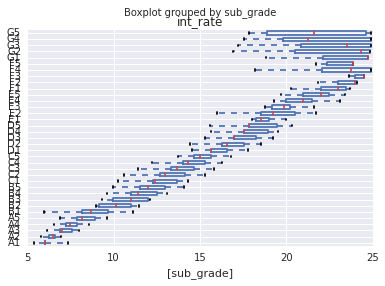



int_rate by term


level_1,25%,50%,75%,count,max,mean,min,std
term,,,,,,,,
36 months,9.17,12.12,14.48,610265.0,24.89,12.097560,5.42,3.744831
60 months,12.99,15.61,18.49,258440.0,24.89,15.818007,5.79,3.899876


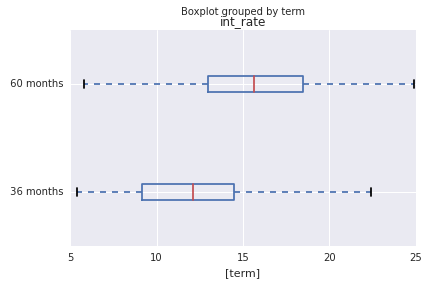



int_rate by title
Cardinality too large to plot. Cardinality 63145. Not displayed.


int_rate by verification_status


level_1,25%,50%,75%,count,max,mean,min,std
verification_status,,,,,,,,
Not Verified,8.90,11.99,14.31,260506.0,24.83,11.898759,5.42,3.729717
Source Verified,9.99,12.99,15.99,323277.0,24.89,13.209210,5.42,4.112750
Verified,11.53,14.09,17.57,284922.0,24.89,14.392681,5.42,4.215624


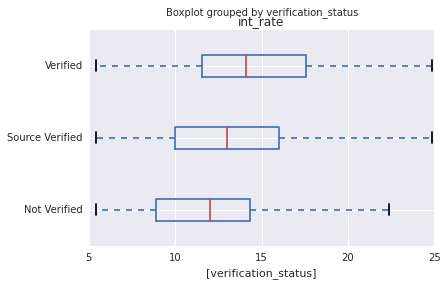



int_rate by verification_status_joint


level_1,25%,50%,75%,count,max,mean,min,std
verification_status_joint,,,,,,,,
Not Verified,11.220,13.18,16.55,276.0,23.99,13.644130,6.89,3.601244
Source Verified,14.075,16.55,18.20,58.0,22.99,16.242759,9.17,3.144979
Verified,13.330,16.99,18.99,161.0,23.99,16.257764,6.89,3.719065


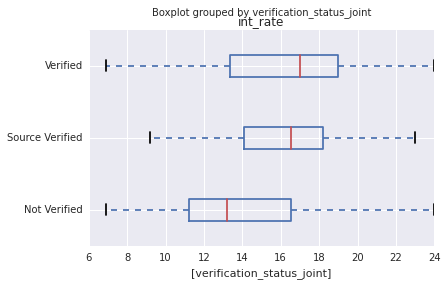



int_rate by zip_code
Cardinality too large to plot. Cardinality 935. Not displayed.




In [353]:
plot_bivar_all(df_loan, target_var='int_rate', num_vars=num_vars2, cat_vars=cat_vars)

Conclusions drawn from above:
 - Weak correlation with other numeric variables. Except for **total_rec_int** (corr: 0.42), which by definition is the total received interest to date. This makes sense as received interest should be larger if a loan is charged with larger interest rate. But the correlation is below 0.5, which could be due to its volatility overtime. At this point of time, I interested to know what will happen when a new feature is engineered: months to date, short for **mths_to_date**.
 - **int_rate** is highly correlated with **grade** and **sub_grade**. The higher the grade (close to A), the lower the interest rate. Each main grade is divided into 5 subgrades. It might be a good idea to encode **grade** and **subgrade** into numeric variables and checkout their correlation with **int_rate**. 
 - **int_rate** is lower for short-term loans (36 months). This makes sense as longer loans means more uncertainties, therefore higher risks.
 - **emp_length** (employment length) seems not correlated with interest rate, as the median value doesn't change with employment length.
 - Surprisingly, loans with verified income (indicated by **verification_status**: whether income is verified) seems to have higher interest rate. Is is because for those whose income can be verified are more likely to take loans with high risk (or larger amount of loan, hypothesized)?

The finding of the relation between (sub)grade and interest rate could explain the multi-modal distribution question we found out previously. Let's plot the kde plot by grade.

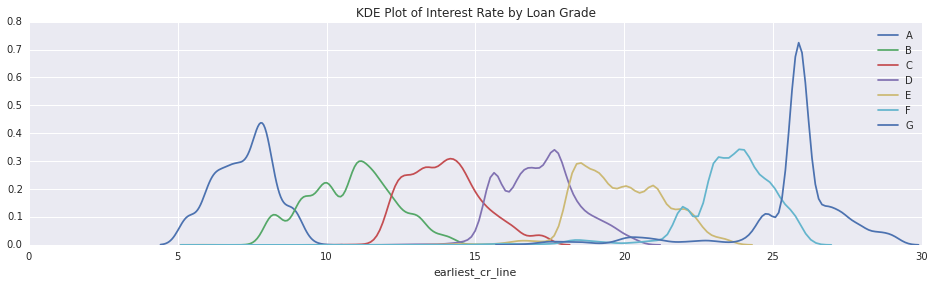

In [354]:
# KDE Plot of Interest Rate by Loan Grade
target_var = 'int_rate'
cat_var = 'grade'
plt.figure(figsize=(16, 4))
for key in df_loan[cat_var].cat.categories.tolist():
    sns.kdeplot(df_loan[df_loan[cat_var] == key][target_var], bw=0.3, label=key)
# plt.hist(df_loan[target_var], bins=75, normed=True)
plt.xlabel(target_var)
plt.title('KDE Plot of Interest Rate by Loan Grade')
plt.show()

In [355]:
col = 'int_rate'
cat = 'grade'

# debugging
df = df_loan
display_html(df.groupby(cat, as_index=1)[col].describe().reset_index().pivot_table(index=cat, columns='level_1', values=col).to_html(), raw=True)

level_1,25%,50%,75%,count,max,mean,min,std
grade,,,,,,,,
A,6.49,7.26,7.89,148202.0,9.63,7.243312,5.32,0.975455
B,9.76,10.99,11.83,254535.0,14.09,10.829618,6.00,1.443258
C,12.99,13.99,14.65,245860.0,17.27,13.980098,6.00,1.228535
D,16.29,16.99,17.86,139542.0,20.31,17.175814,6.00,1.242879
E,18.55,19.99,20.99,70705.0,23.40,19.897322,6.00,1.500429
F,22.99,23.76,24.50,23046.0,26.06,23.582787,6.00,1.535471
G,25.80,25.83,26.06,5489.0,28.99,25.626706,16.59,1.975726


In [356]:
cat = ['grade', 'sub_grade']
display_html(df.groupby(cat, as_index=1)[col].describe().reset_index()\
             .pivot_table(index=cat, columns='level_2', values=col).dropna().to_html(), raw=True)

level_2 
 25% 
 50% 
 75% 
 count 
 max 
 mean 
 min 
 std 
 
 
 grade 
 sub_grade 
 
 
 
 
 
 
 
 
 
 
 
 
 A 
 A1 
 5.32 
 5.93 
 6.03 
 22913.0 
 7.37 
 5.712019 
 5.32 
 0.354491 
 
 
 A2 
 6.24 
 6.49 
 6.62 
 22485.0 
 7.68 
 6.425859 
 5.79 
 0.221711 
 
 
 A3 
 6.89 
 6.99 
 7.62 
 23457.0 
 8.00 
 7.141020 
 6.17 
 0.362312 
 
 
 A4 
 7.26 
 7.49 
 7.90 
 34531.0 
 9.32 
 7.529181 
 6.00 
 0.395069 
 
 
 A5 
 7.89 
 8.19 
 8.90 
 44816.0 
 9.63 
 8.269620 
 6.00 
 0.461306 
 
 
 B 
 B1 
 8.18 
 8.67 
 9.67 
 44972.0 
 11.14 
 8.948791 
 6.00 
 0.773227 
 
 
 B2 
 9.17 
 10.15 
 10.99 
 48781.0 
 11.48 
 9.996643 
 6.00 
 0.820475 
 
 
 B3 
 9.99 
 10.99 
 11.99 
 56323.0 
 12.12 
 10.900792 
 6.00 
 0.907566 
 
 
 B4 
 10.99 
 11.44 
 12.49 
 55626.0 
 13.11 
 11.744866 
 6.00 
 0.867609 
 
 
 B5 
 11.53 
 11.99 
 12.99 
 48833.0 
 14.09 
 12.269169 
 6.00 
 0.918435 
 
 
 C 
 C1 
 12.29 
 12.39 
 13.65 
 53387.0 
 14.33 
 12.892132 
 6.00 
 0.807624 
 
 
 C2 
 12.69 
 12.99 
 14.16 
 52236.0 
 15.31 
 13.423570 
 6.00 
 0.933605 
 
 
 C3 
 13.33 
 13.66 
 14.64 
 50161.0 
 15.80 
 14.015994 
 6.00 
 0.902185 
 
 
 C4 
 13.99 
 14.31 
 15.31 
 48857.0 
 16.29 
 14.598235 
 6.00 
 0.888894 
 
 
 C5 
 14.65 
 14.99 
 15.61 
 41219.0 
 17.27 
 15.318153 
 6.00 
 0.977602 
 
 
 D 
 D1 
 15.61 
 15.61 
 16.59 
 36238.0 
 17.77 
 16.079183 
 6.00 
 0.904702 
 
 
 D2 
 16.29 
 16.55 
 17.57 
 29803.0 
 18.55 
 16.847393 
 6.00 
 0.927531 
 
 
 D3 
 16.99 
 16.99 
 18.25 
 26554.0 
 19.20 
 17.340907 
 6.00 
 0.912255 
 
 
 D4 
 17.57 
 17.57 
 18.92 
 25558.0 
 19.52 
 17.903247 
 6.00 
 0.912639 
 
 
 D5 
 17.86 
 17.86 
 19.47 
 21389.0 
 20.31 
 18.417205 
 6.00 
 1.034038 
 
 
 E 
 E1 
 18.25 
 18.54 
 18.99 
 18268.0 
 21.00 
 18.827670 
 6.00 
 1.048169 
 
 
 E2 
 18.55 
 19.24 
 20.49 
 17004.0 
 21.70 
 19.373988 
 6.00 
 1.174140 
 
 
 E3 
 19.19 
 19.89 
 20.20 
 14134.0 
 22.40 
 19.968242 
 6.00 
 1.220920 
 
 
 E4 
 19.99 
 20.99 
 21.48 
 11724.0 
 23.10 
 20.780979 
 6.00 
 1.208839 
 
 
 E5 
 20.99 
 21.99 
 22.45 
 9575.0 
 23.40 
 21.680797 
 6.00 
 1.130094 
 
 
 F 
 F1 
 21.99 
 22.99 
 23.43 
 7218.0 
 23.70 
 22.606218 
 15.01 
 1.181906 
 
 
 F2 
 22.99 
 23.99 
 24.08 
 5392.0 
 24.08 
 23.316743 
 15.33 
 1.255001 
 
 
 F3 
 23.99 
 24.50 
 24.50 
 4433.0 
 24.50 
 23.970559 
 15.65 
 1.202553 
 
 
 F4 
 24.89 
 24.99 
 24.99 
 3409.0 
 25.09 
 24.489493 
 6.00 
 1.390790 
 
 
 F5 
 25.28 
 25.57 
 25.78 
 2594.0 
 26.06 
 24.998909 
 6.00 
 1.622041 
 
 
 G 
 G1 
 25.80 
 25.80 
 25.80 
 1871.0 
 26.99 
 25.457691 
 16.59 
 1.672880 
 
 
 G2 
 25.83 
 25.83 
 27.31 
 1398.0 
 27.49 
 25.675672 
 16.91 
 1.769291 
 
 
 G3 
 25.89 
 25.89 
 25.89 
 981.0 
 27.99 
 25.842977 
 17.22 
 1.880423 
 
 
 G4 
 25.99 
 25.99 
 25.99 
 663.0 
 28.49 
 25.622428 
 17.54 
 2.513197 
 
 
 G5 
 26.06 
 26.06 
 26.06 
 576.0 
 28.99 
 25.693455 
 17.86 
 2.658581

Now let's encode **sub_grade** and look at its correlation with **int_rate**.

sub_grade_enc vs int_rate


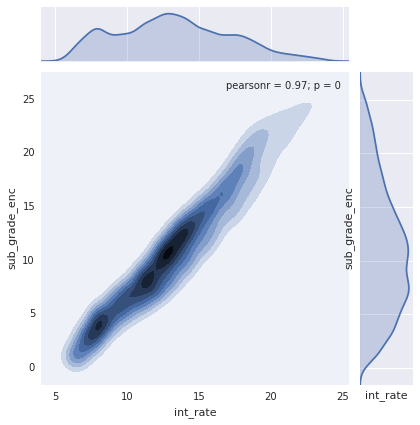

In [357]:
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()

# encoded sub_grade
df['sub_grade_enc'] = enc.fit_transform(df['sub_grade'])

plot_scatter(df_loan, 'int_rate', 'sub_grade_enc', sample=df_loan.shape[0] / 50)

We get 0.97 of Pearson Correlation which indicates a strong correlation between **sub_grade** and **int_rate**. We can also get 0.94 R-squares when applying a linear model of the two variables. 

In [471]:
# Engineering new variables
today = df_loan['issue_d'].max()
df_loan['mths_to_date'] = ((today - df_loan['issue_d']).dt.days / 30).astype(int)

### Section 4.2 Debt-to-Income Ratio

Let's investigate **dti**. Again we plot the histogram, kdeplot, jointplots and boxplots.

In [423]:
df_loan[['dti']].describe().T

,count,mean,std,min,25%,50%,75%,max
dti,887379.0,18.157039,17.190626,0.0,11.91,17.65,23.95,9999.0


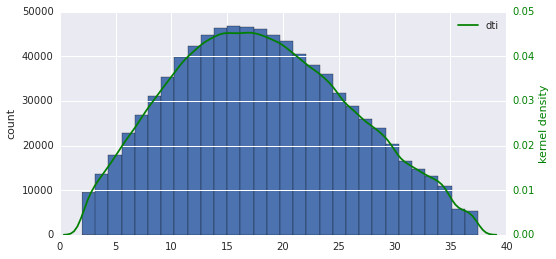

In [380]:
plot_hist_kde(df_loan, col='dti', no_outliers=True, bins=30)

It seems **dti** follows bell-shape, slightly left-skewed. This implies its distribution is hardly separable and not influenced by other variables. Can we assume debt-to-income ratio is stable across other variables?


    
    ################### dti ##################
    
    
all_util vs dti


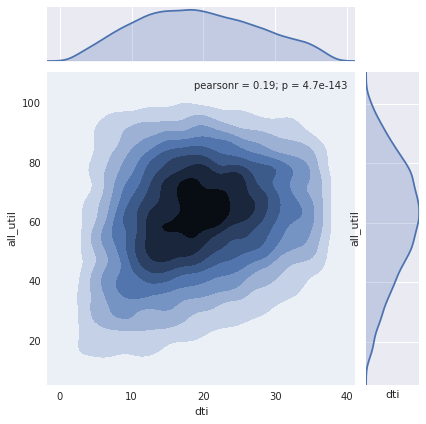



annual_inc vs dti


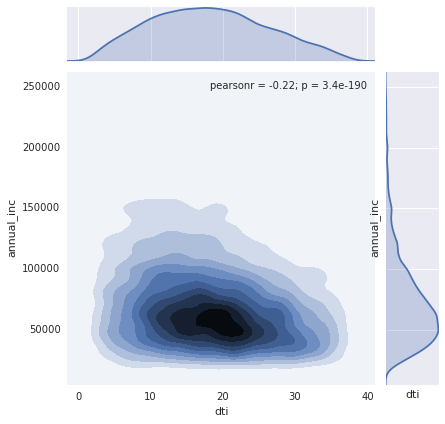



delinq_2yrs vs dti


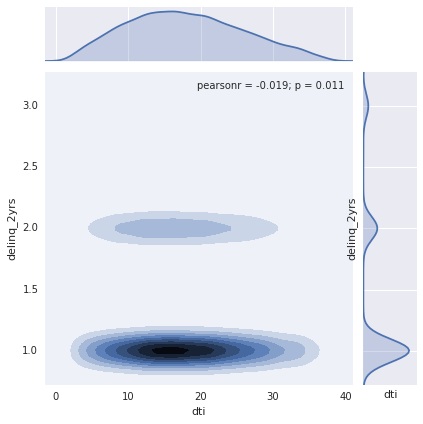



il_util vs dti


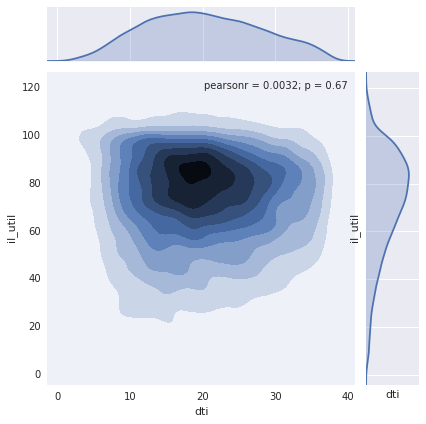



inq_fi vs dti


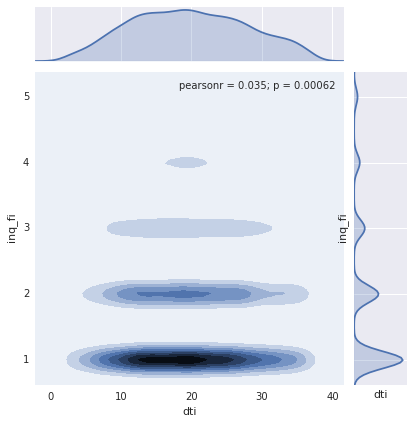



inq_last_12m vs dti


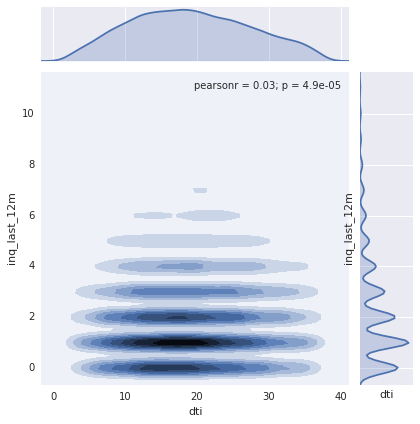



inq_last_6mths vs dti


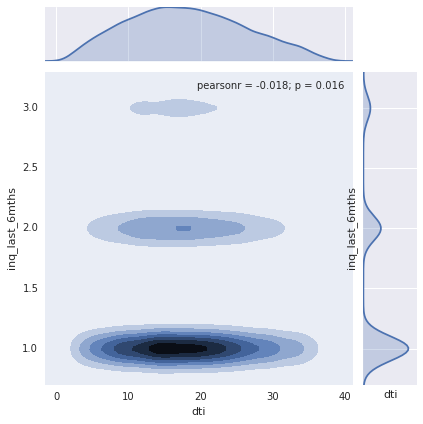



installment vs dti


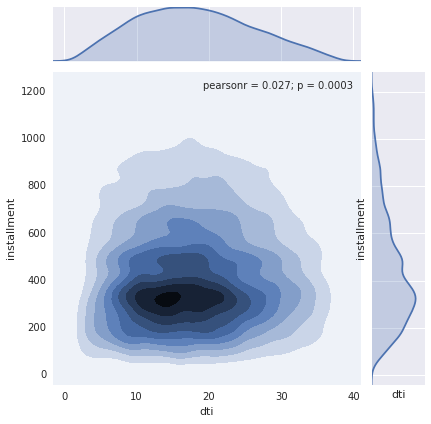



int_rate vs dti


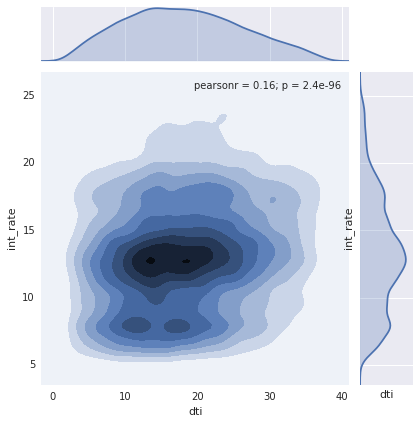



last_pymnt_amnt vs dti


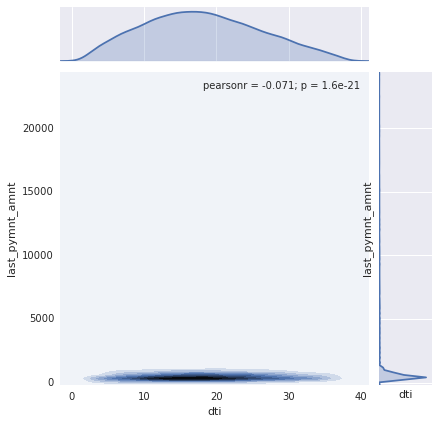



loan_amnt vs dti


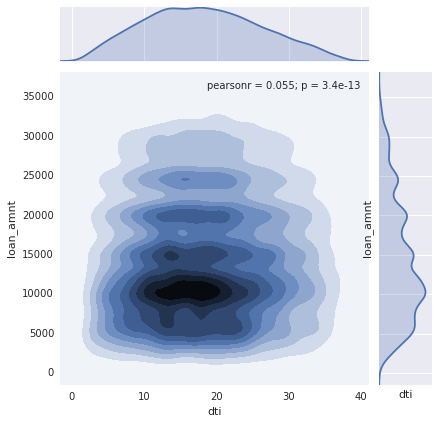



max_bal_bc vs dti


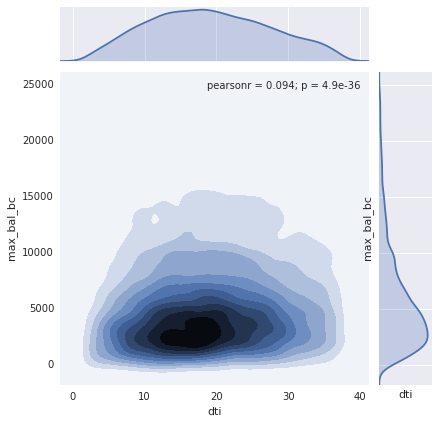



mths_since_last_delinq vs dti


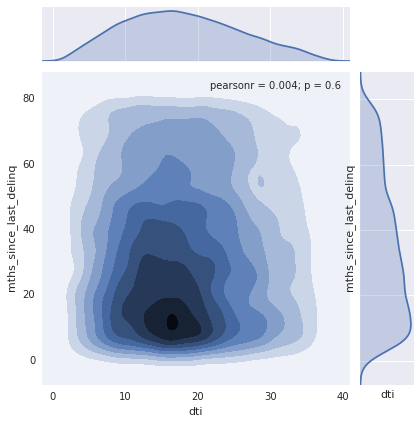



mths_since_last_major_derog vs dti


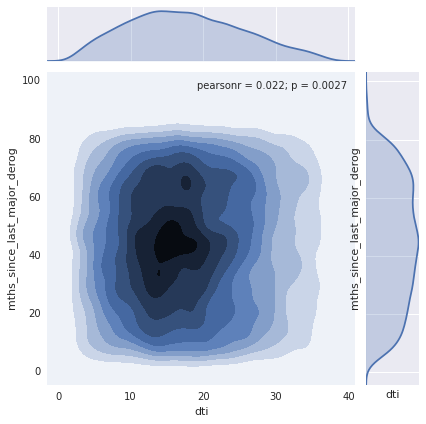



mths_since_last_record vs dti


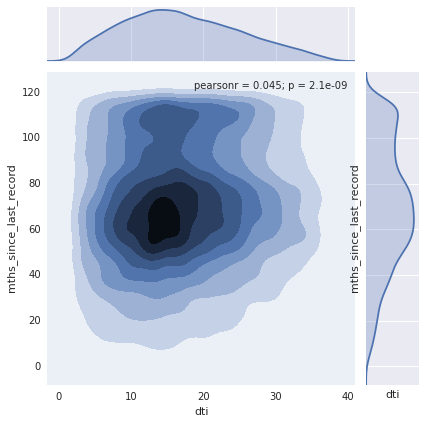



mths_since_rcnt_il vs dti


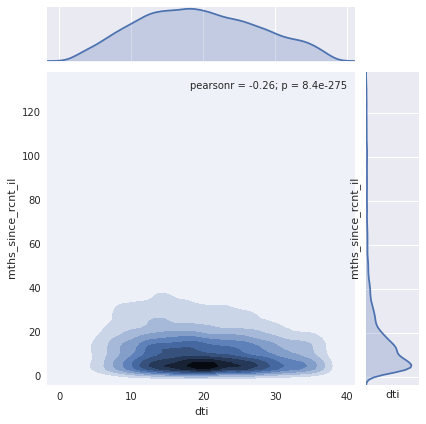



open_acc vs dti


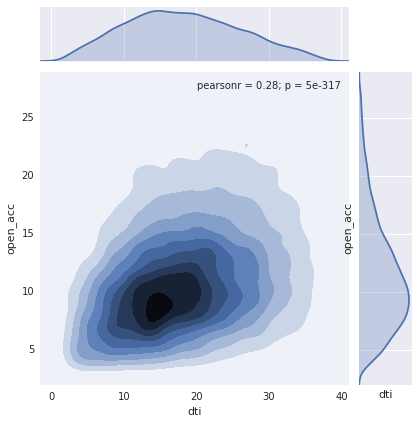



open_acc_6m vs dti


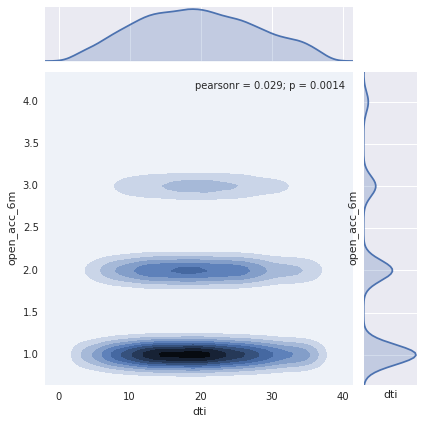



open_il_24m vs dti


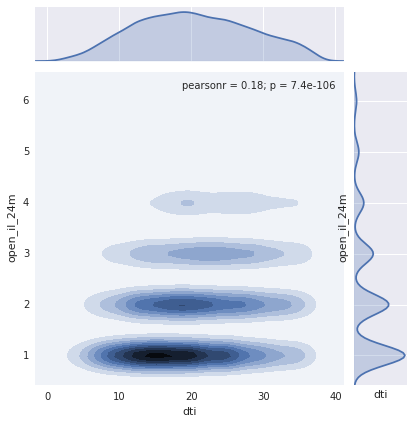



open_il_6m vs dti


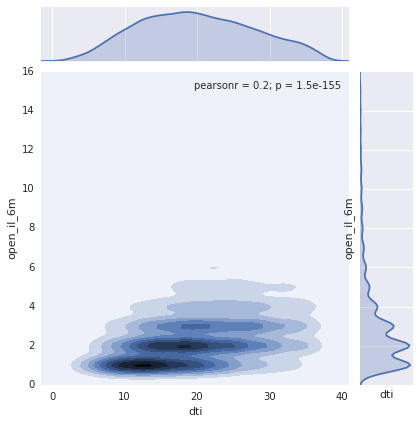



open_rv_24m vs dti


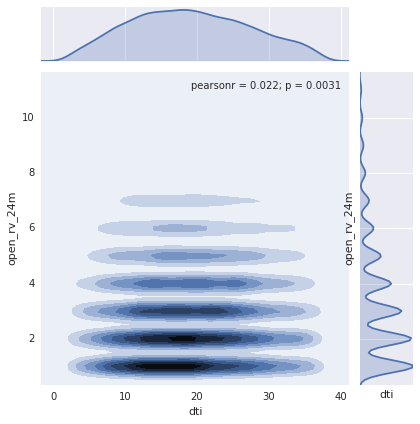



out_prncp vs dti


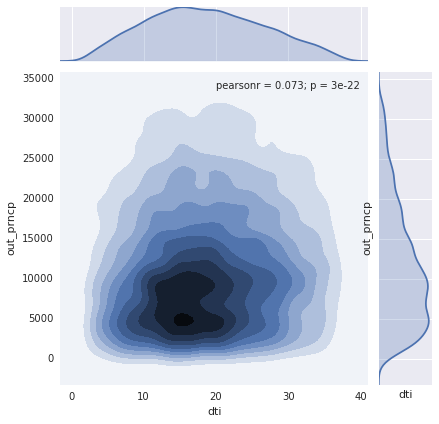



pub_rec vs dti


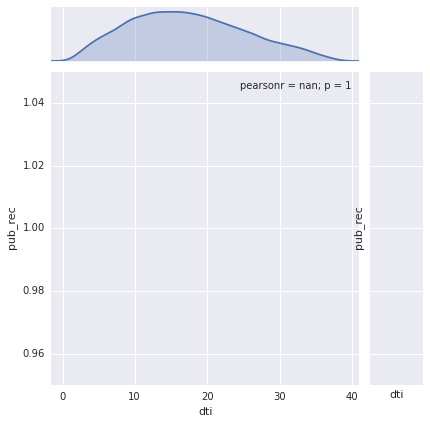



recoveries vs dti


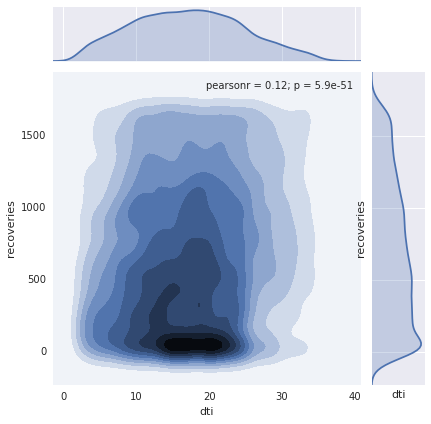



revol_bal vs dti


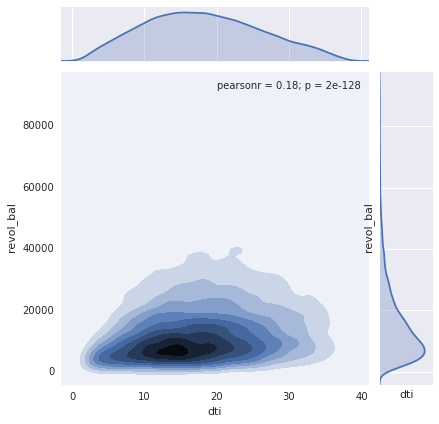



revol_util vs dti


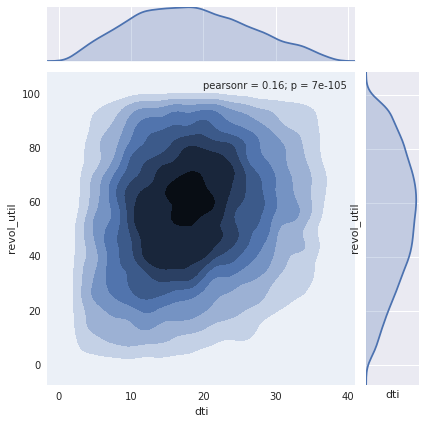



tot_coll_amt vs dti


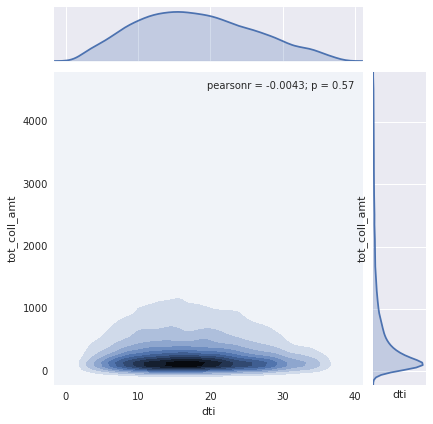



tot_cur_bal vs dti


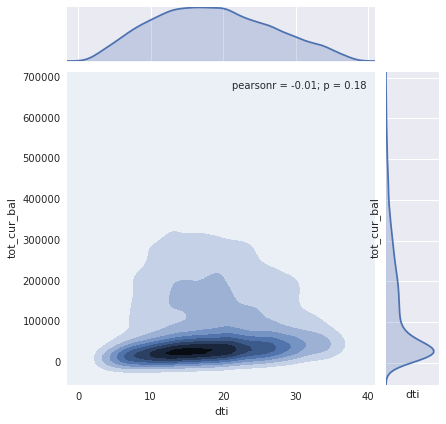



total_acc vs dti


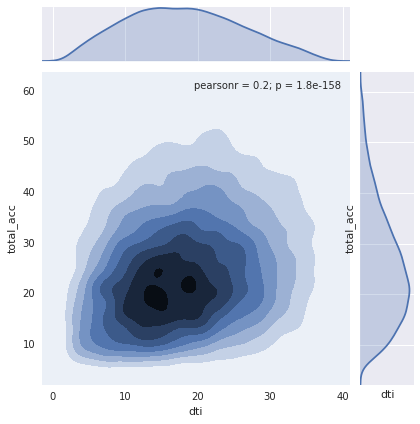



total_bal_il vs dti


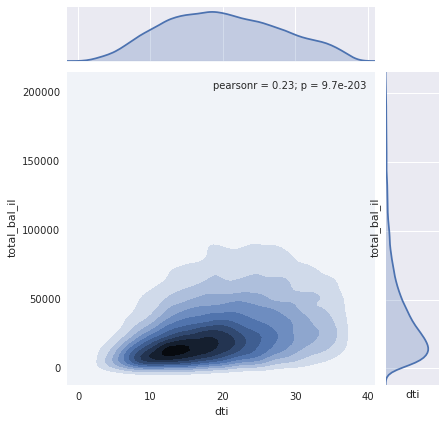



total_cu_tl vs dti


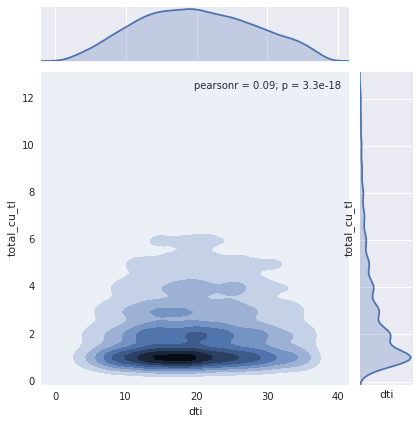



total_pymnt_inv vs dti


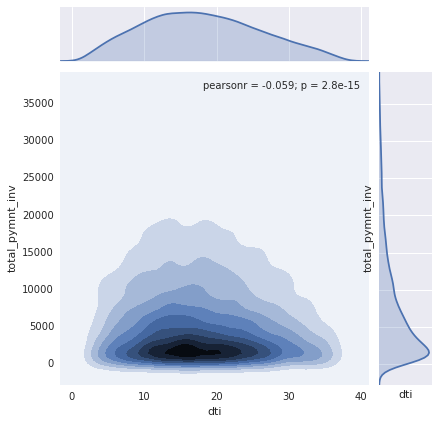



total_rec_int vs dti


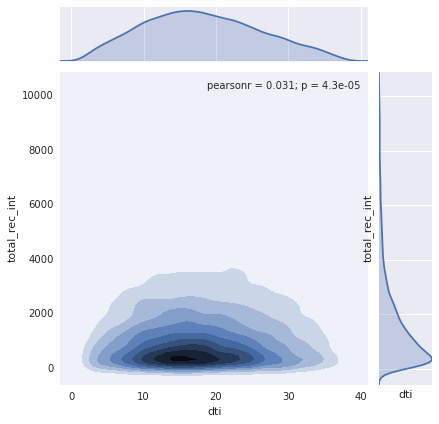



total_rec_late_fee vs dti


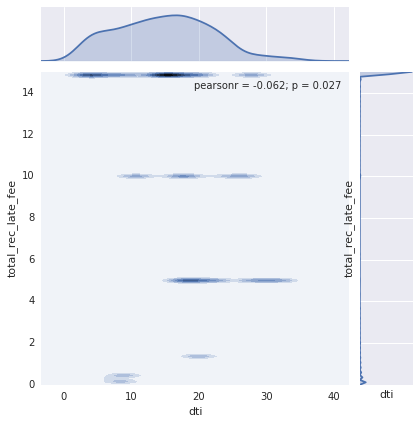



total_rec_prncp vs dti


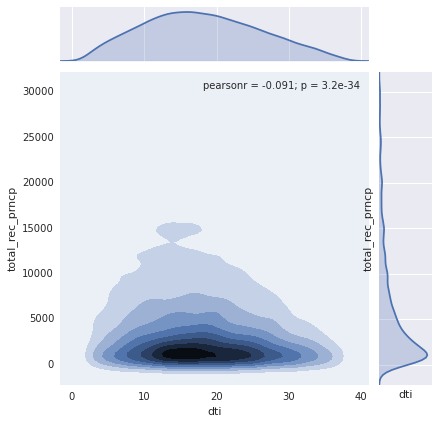



total_rev_hi_lim vs dti


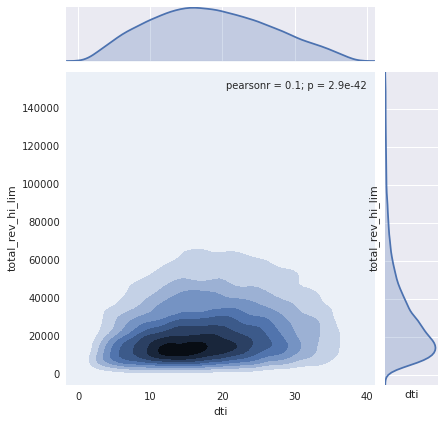



dti by addr_state
Cardinality too large to plot. Cardinality 51. Not displayed.


dti by application_type


level_1,25%,50%,75%,count,max,mean,min,std
application_type,,,,,,,,
INDIVIDUAL,12.03,17.65,23.80,869138.0,37.47,18.093181,1.99,7.938903
JOINT,16.00,22.36,28.76,405.0,37.30,22.260642,2.08,8.044041


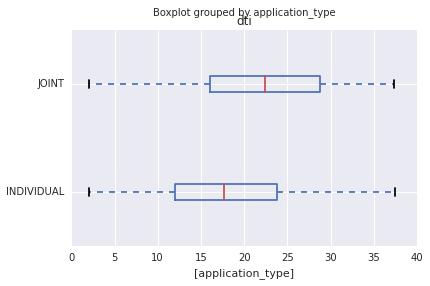



dti by desc
Cardinality too large to plot. Cardinality 124470. Not displayed.


dti by emp_length


level_1,25%,50%,75%,count,max,mean,min,std
emp_length,,,,,,,,
1 year,11.630,17.21,23.24,55967.0,37.47,17.671470,1.99,7.908055
10+ years,12.350,17.98,24.12,286071.0,37.47,18.387004,1.99,7.935353
2 years,11.670,17.19,23.28,77238.0,37.47,17.686453,1.99,7.859583
3 years,11.760,17.26,23.29,68670.0,37.47,17.735295,1.99,7.863576
4 years,11.820,17.39,23.48,51425.0,37.47,17.854241,1.99,7.900282
5 years,11.890,17.44,23.40,54610.0,37.47,17.857101,1.99,7.852710
6 years,12.030,17.53,23.55,42177.0,37.47,17.938214,1.99,7.812371
7 years,12.120,17.65,23.72,43749.0,37.47,18.089452,1.99,7.857874
8 years,12.280,17.81,23.91,43095.0,37.46,18.256093,1.99,7.915122


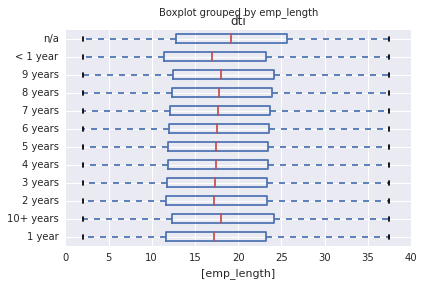



dti by emp_title
Cardinality too large to plot. Cardinality 299272. Not displayed.


dti by grade


level_1,25%,50%,75%,count,max,mean,min,std
grade,,,,,,,,
A,10.2900,15.240,20.84,145464.0,37.47,15.801133,1.99,7.197317
B,11.5600,16.920,22.81,250871.0,37.47,17.366286,1.99,7.620505
C,12.6325,18.310,24.42,241298.0,37.47,18.661626,1.99,7.958210
D,13.2800,19.320,25.84,135698.0,37.47,19.608126,1.99,8.307191
E,13.8400,19.870,26.23,68407.0,37.47,20.032344,1.99,8.274966
F,13.7600,19.625,25.63,22450.0,37.47,19.712413,1.99,8.016341
G,13.2950,19.280,24.88,5355.0,37.44,19.159696,1.99,7.806910


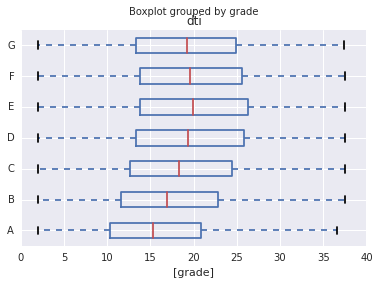



dti by home_ownership


level_1,25%,50%,75%,count,max,mean,min,std
home_ownership,,,,,,,,
ANY,22.915,28.12,31.085,3.0,34.05,26.626667,17.71,8.271725
MORTGAGE,12.120,17.58,23.580,435628.0,37.47,18.025746,1.99,7.788644
NONE,11.580,16.82,24.715,47.0,34.61,18.244681,3.01,8.698769
OTHER,9.740,14.27,20.010,173.0,34.25,15.068786,2.31,7.165685
OWN,12.410,18.52,25.020,85148.0,37.47,18.850289,1.99,8.305916
RENT,11.840,17.55,23.790,348544.0,37.47,17.998755,1.99,8.024366


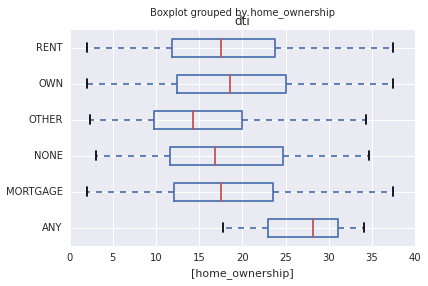



dti by initial_list_status


level_1,25%,50%,75%,count,max,mean,min,std
initial_list_status,,,,,,,,
f,11.74,17.33,23.37,447308.0,37.47,17.758545,1.99,7.871183
w,12.35,18.00,24.26,422235.0,37.47,18.451685,1.99,7.995719


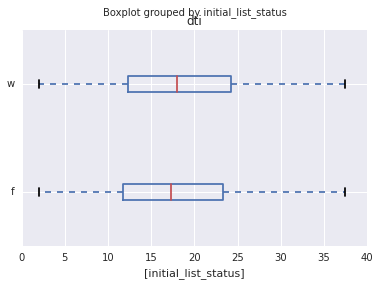



dti by loan_status


level_1,25%,50%,75%,count,max,mean,min,std
loan_status,,,,,,,,
Charged Off,12.7700,18.420,24.090,44502.0,37.39,18.521912,1.99,7.649675
Current,12.4600,18.180,24.480,589870.0,37.47,18.606487,1.99,8.041535
Default,14.1500,19.710,25.680,1193.0,37.46,19.846781,2.17,7.825469
Does not meet the credit policy. Status:Charged Off,10.0100,15.440,20.250,721.0,29.96,15.095021,1.99,6.614252
Does not meet the credit policy. Status:Fully Paid,9.6200,15.280,20.300,1869.0,29.95,14.951696,2.02,6.805135
Fully Paid,10.7200,15.910,21.560,203431.0,37.47,16.373829,1.99,7.414843
In Grace Period,13.2800,19.080,25.350,6123.0,37.44,19.351372,2.04,8.077270
Issued,12.7500,18.720,25.370,8204.0,37.45,19.159233,2.00,8.279052
Late (16-30 days),12.9450,18.825,24.995,2300.0,37.44,19.068652,2.00,8.070492


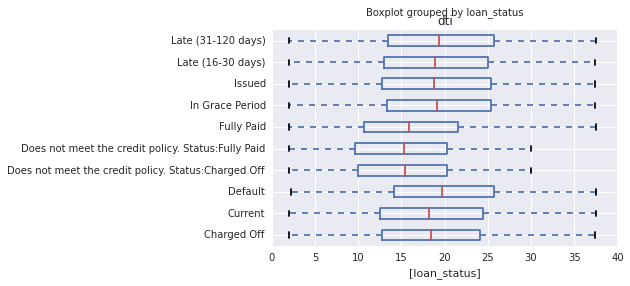



dti by purpose


level_1,25%,50%,75%,count,max,mean,min,std
purpose,,,,,,,,
car,8.5000,14.000,20.4000,8378.0,37.47,14.938075,1.99,8.035532
credit_card,12.2100,17.710,23.7800,203522.0,37.47,18.186966,1.99,7.802116
debt_consolidation,12.6900,18.250,24.3000,515785.0,37.47,18.641627,1.99,7.845206
educational,6.8050,11.810,16.9050,387.0,29.74,12.236848,2.18,6.304692
home_improvement,9.5700,15.020,21.4100,49769.0,37.47,15.869813,1.99,8.041368
house,8.5700,14.190,20.6600,3501.0,37.40,14.981411,1.99,7.994341
major_purchase,8.7725,14.190,20.7800,16266.0,37.45,15.209157,1.99,8.091778
medical,11.0900,16.920,23.2800,8211.0,37.46,17.409960,1.99,8.221216
moving,10.1200,15.850,22.2500,5217.0,37.38,16.468929,1.99,8.175487


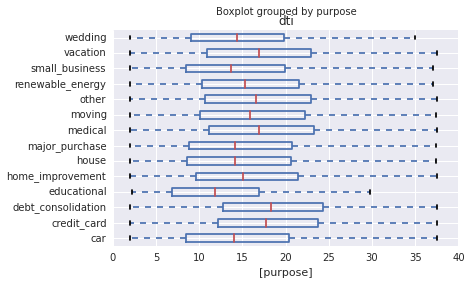



dti by pymnt_plan


level_1,25%,50%,75%,count,max,mean,min,std
pymnt_plan,,,,,,,,
n,12.0400,17.660,23.8000,869533.0,37.47,18.095118,1.99,7.939462
y,12.1125,16.855,24.5575,10.0,30.41,18.424000,7.95,7.871473


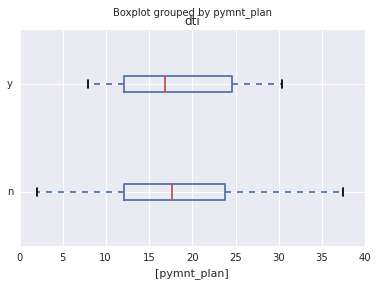



dti by sub_grade


level_1,25%,50%,75%,count,max,mean,min,std
sub_grade,,,,,,,,
A1,9.3600,13.960,19.2525,22396.0,34.95,14.558132,1.99,6.704220
A2,10.0200,14.910,20.4600,22026.0,34.99,15.459171,1.99,7.083850
A3,10.2200,15.340,21.1700,23049.0,37.15,15.925666,1.99,7.373452
A4,10.4400,15.380,21.0000,33909.0,37.40,15.963101,1.99,7.224822
A5,10.8400,15.920,21.5400,44084.0,37.47,16.413777,1.99,7.294115
B1,11.1400,16.340,22.1100,44372.0,37.45,16.834834,1.99,7.457385
B2,11.2000,16.510,22.3600,48089.0,37.47,16.981864,1.99,7.546717
B3,11.6200,16.820,22.7400,55509.0,37.46,17.331398,1.99,7.567156
B4,11.8800,17.260,23.0700,54862.0,37.46,17.645457,1.99,7.600337


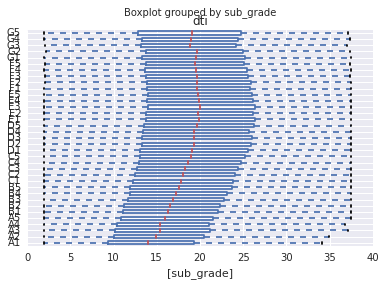



dti by term


level_1,25%,50%,75%,count,max,mean,min,std
term,,,,,,,,
36 months,11.49,17.06,23.20,608784.0,37.47,17.556964,1.99,7.896352
60 months,13.40,19.02,25.06,260759.0,37.47,19.351538,1.99,7.897729


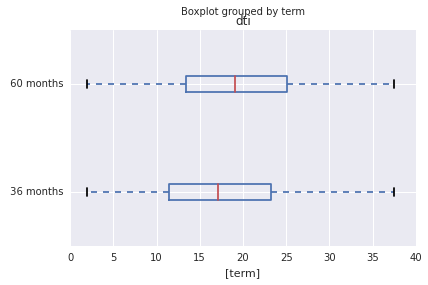



dti by title
Cardinality too large to plot. Cardinality 63145. Not displayed.


dti by verification_status


level_1,25%,50%,75%,count,max,mean,min,std
verification_status,,,,,,,,
Not Verified,11.44,16.74,22.55,261926.0,37.47,17.213215,1.99,7.607244
Source Verified,11.96,17.24,23.37,323477.0,37.47,17.889461,1.99,7.835990
Verified,12.86,19.11,25.32,284140.0,37.47,19.142215,1.99,8.233659


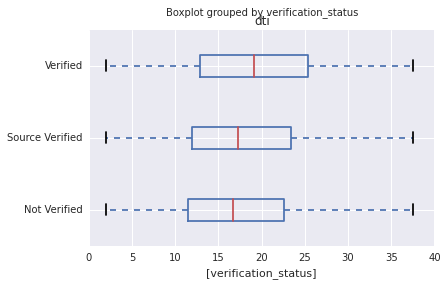



dti by verification_status_joint


level_1,25%,50%,75%,count,max,mean,min,std
verification_status_joint,,,,,,,,
Not Verified,15.4125,20.195,26.6525,258.0,37.30,20.920736,3.74,7.758609
Source Verified,16.8450,24.960,30.0325,38.0,36.86,23.658947,7.96,7.626640
Verified,19.7600,26.180,31.4400,109.0,36.91,24.944679,2.08,8.162821


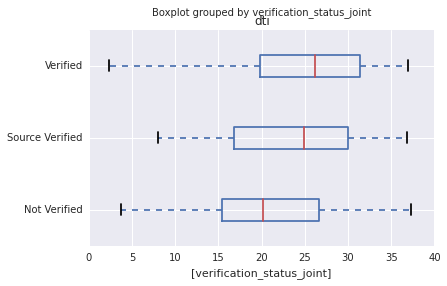



dti by zip_code
Cardinality too large to plot. Cardinality 935. Not displayed.




In [362]:
plot_bivar_all(df_loan, target_var='dti', num_vars=num_vars2, cat_vars=cat_vars)

We don't really get much strong correlation accross the 

Conclusions:
- **int_rate**, **all_util**, **open_acc**, **open_il_6/24m**, **total_acc**, **total_bal_il** seem to be positively correlated with **dti**, yet the correlation is weak.
- **emp_length** seems to have an positive correlation with **dti** as well, as its median values increases when **emp_length** becomes larger.

### Section 4.3 Loan Amount

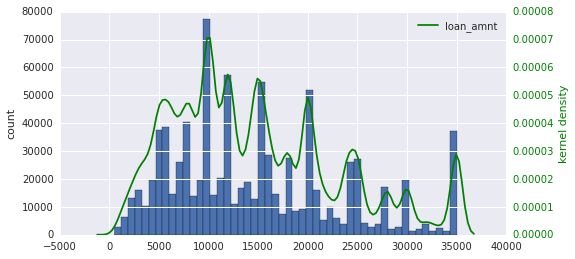

In [417]:
plot_hist_kde(df_loan, col='loan_amnt', no_outliers=False, bins=50)

The distribution has peaks aound some values around some excact numbers, including, 5k, 10k, 15k, 20k, 25k, 30k, 25k.

In [415]:
df_loan.loan_amnt.value_counts().head(10)

10000.0    61837
12000.0    50183
15000.0    47210
20000.0    46932
35000.0    36368
8000.0     27870
5000.0     27167
6000.0     26207
25000.0    24125
16000.0    23708
Name: loan_amnt, dtype: int64


    
    ################### loan_amnt ##################
    
    
all_util vs loan_amnt


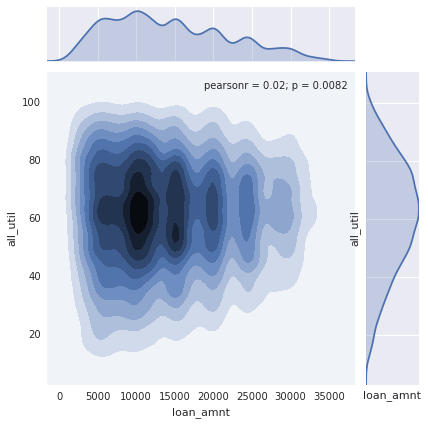



annual_inc vs loan_amnt


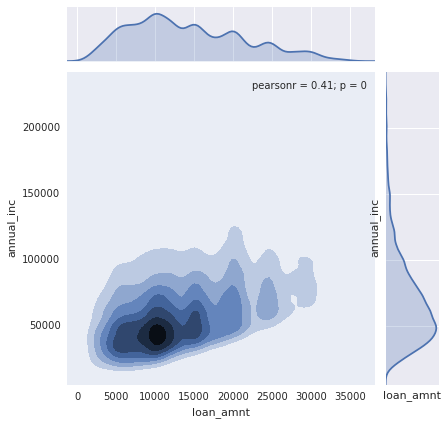



delinq_2yrs vs loan_amnt


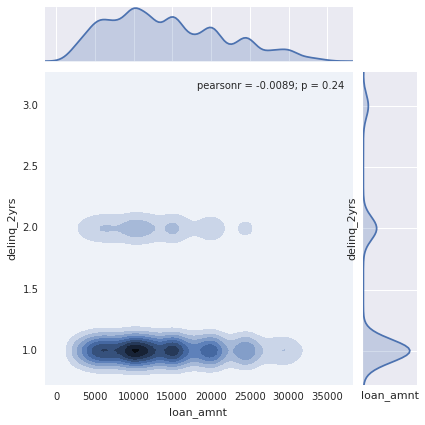



dti vs loan_amnt


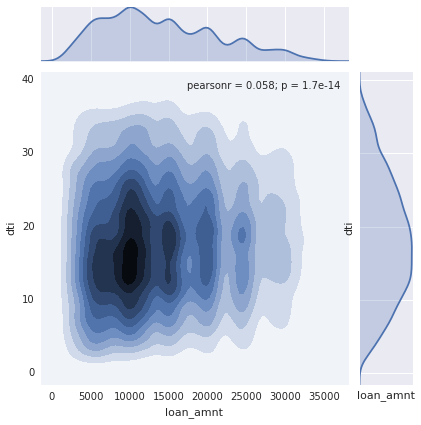



il_util vs loan_amnt


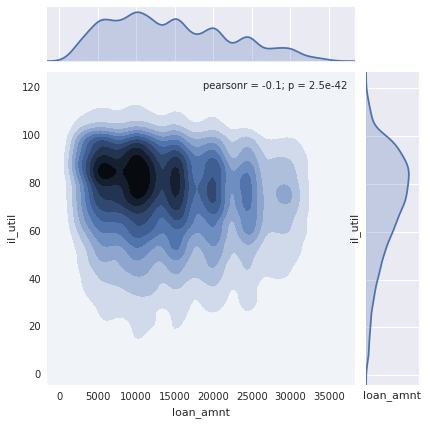



inq_fi vs loan_amnt


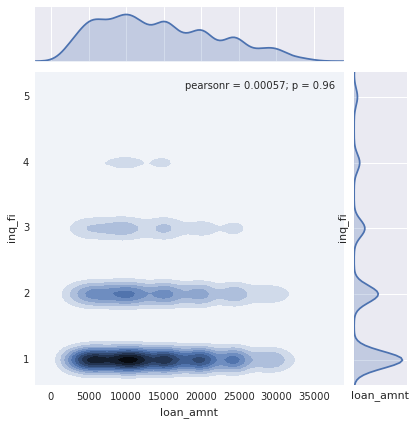



inq_last_12m vs loan_amnt


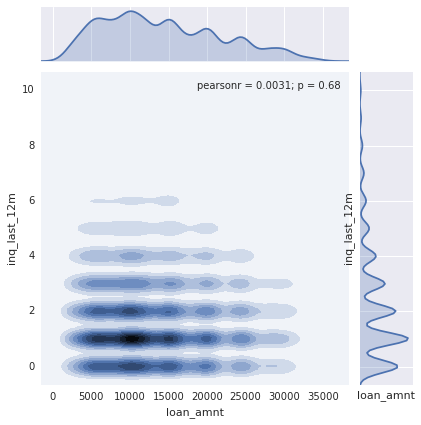



inq_last_6mths vs loan_amnt


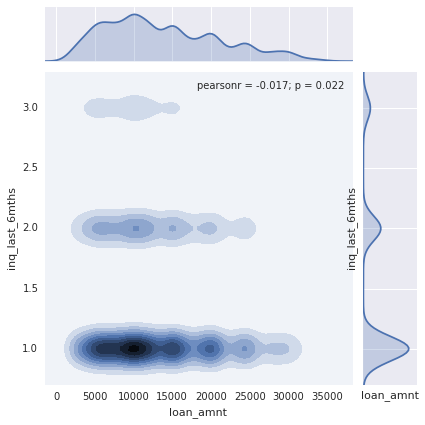



installment vs loan_amnt


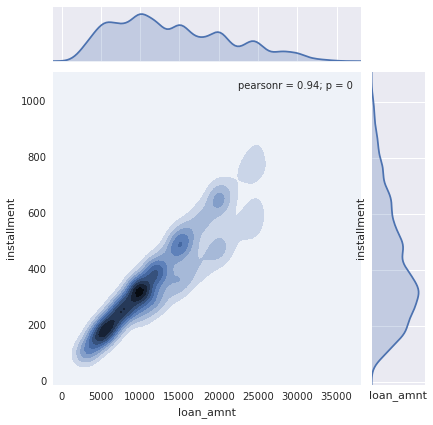



int_rate vs loan_amnt


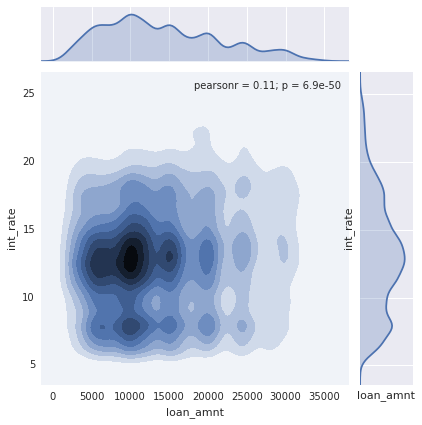



last_pymnt_amnt vs loan_amnt


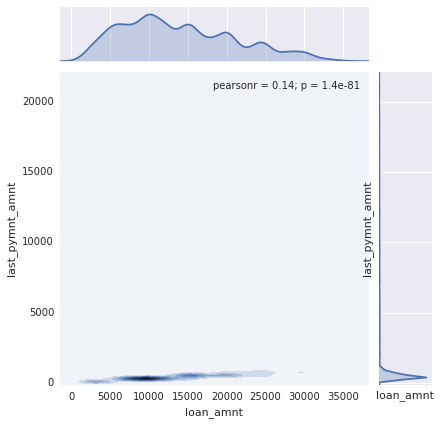



max_bal_bc vs loan_amnt


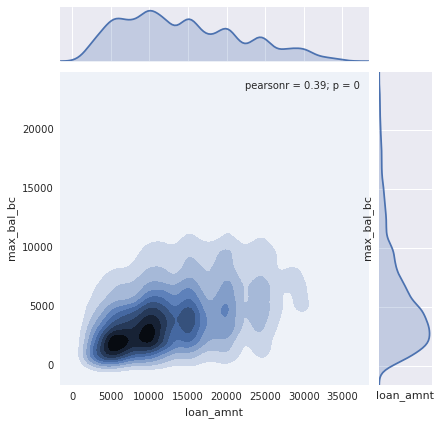



mths_since_last_delinq vs loan_amnt


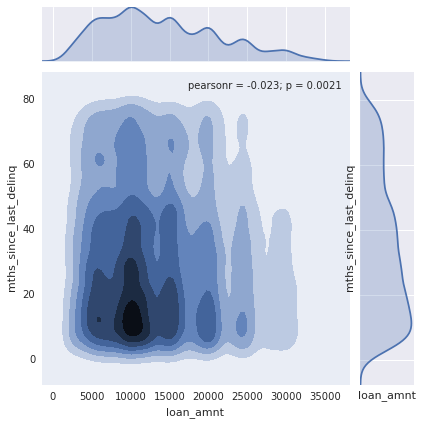



mths_since_last_major_derog vs loan_amnt


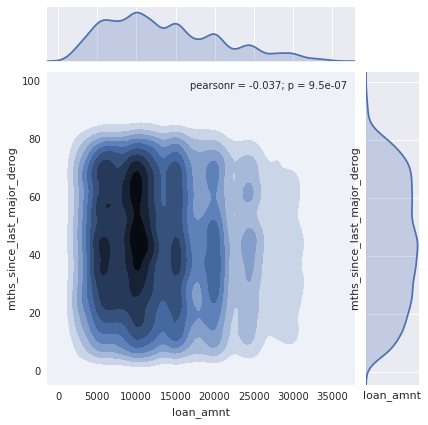



mths_since_last_record vs loan_amnt


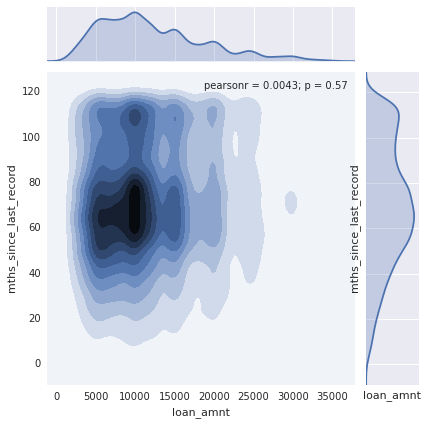



mths_since_rcnt_il vs loan_amnt


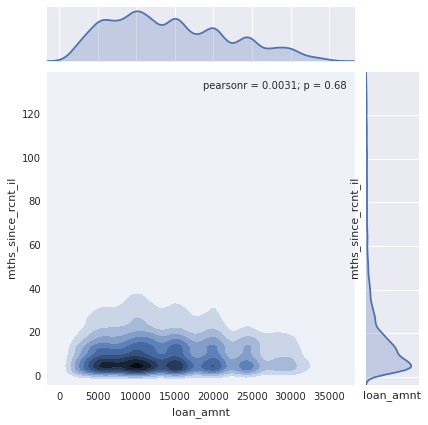



open_acc vs loan_amnt


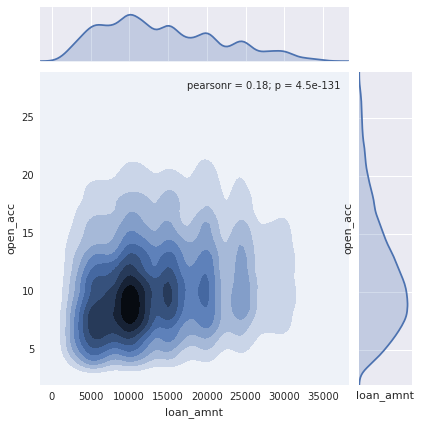



open_acc_6m vs loan_amnt


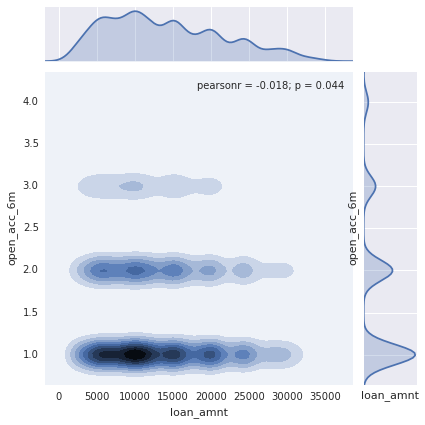



open_il_24m vs loan_amnt


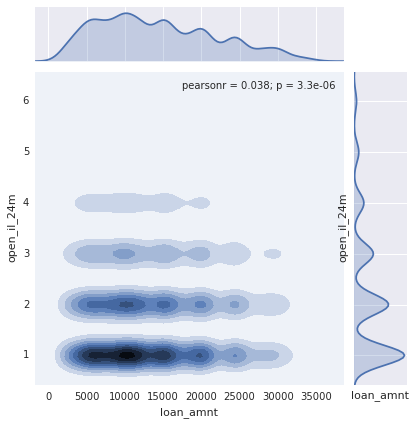



open_il_6m vs loan_amnt


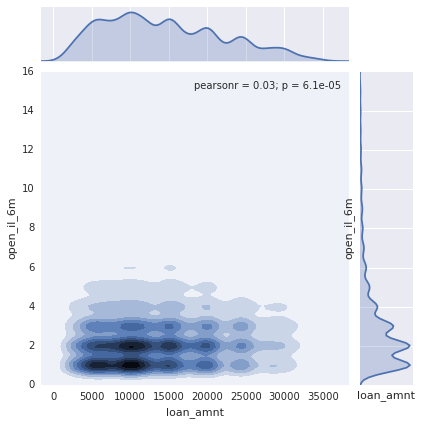



open_rv_24m vs loan_amnt


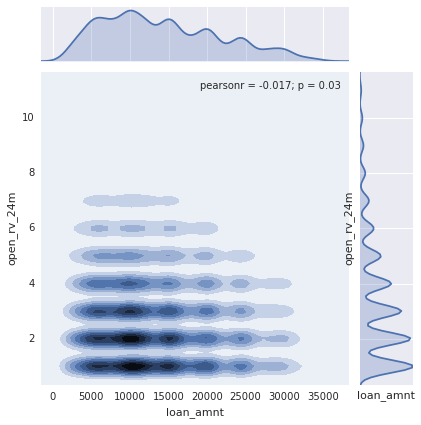



out_prncp vs loan_amnt


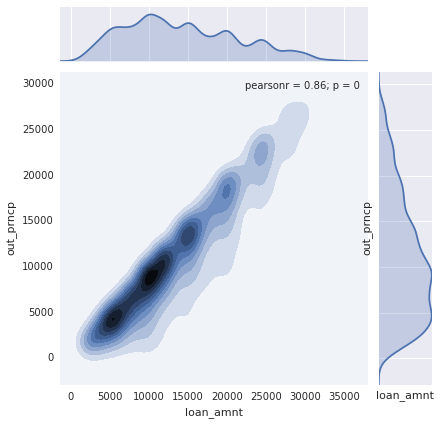



pub_rec vs loan_amnt


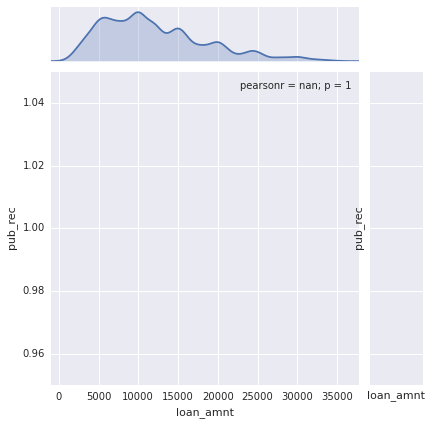



recoveries vs loan_amnt


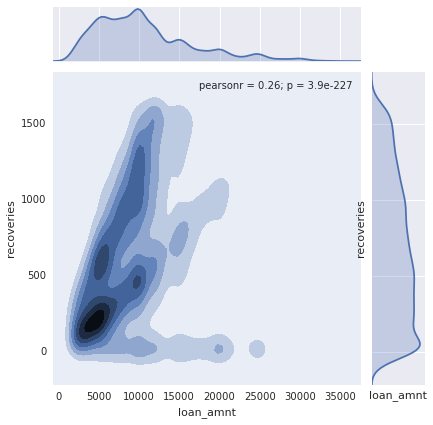



revol_bal vs loan_amnt


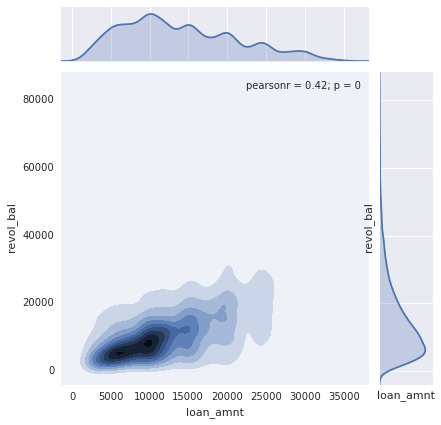



revol_util vs loan_amnt


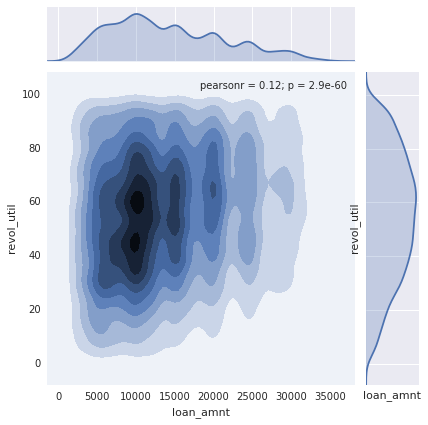



tot_coll_amt vs loan_amnt


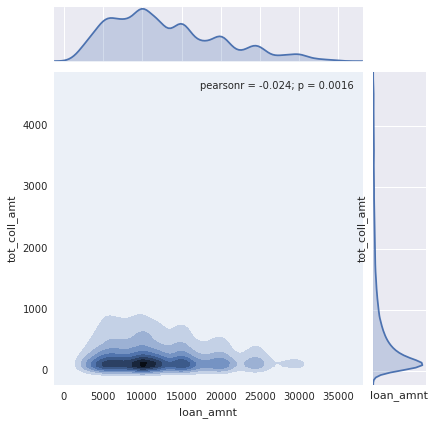



tot_cur_bal vs loan_amnt


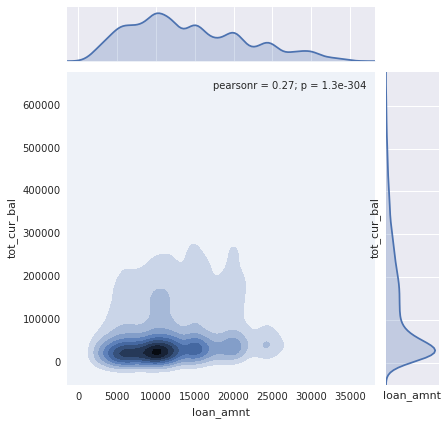



total_acc vs loan_amnt


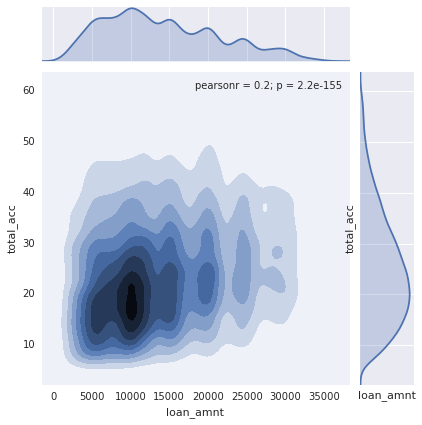



total_bal_il vs loan_amnt


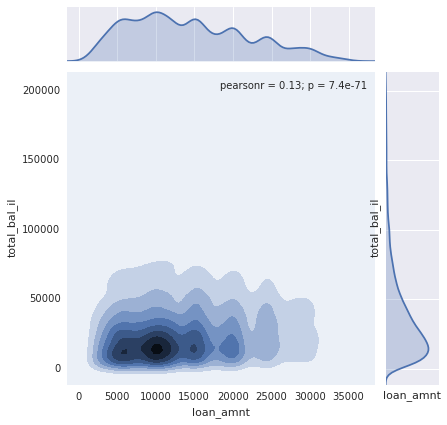



total_cu_tl vs loan_amnt


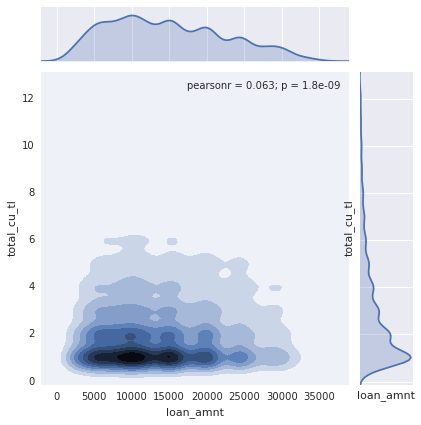



total_pymnt_inv vs loan_amnt


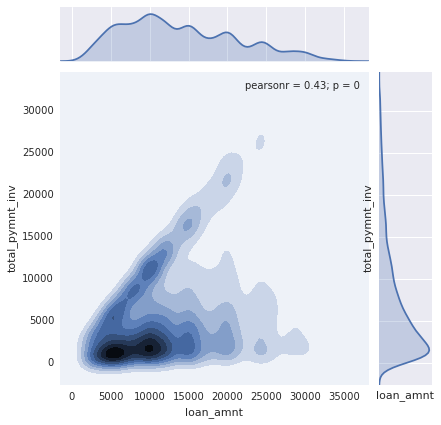



total_rec_int vs loan_amnt


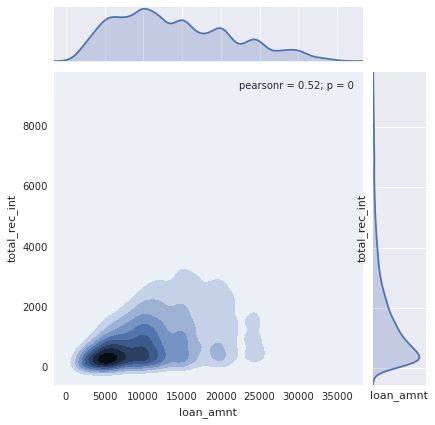



total_rec_late_fee vs loan_amnt


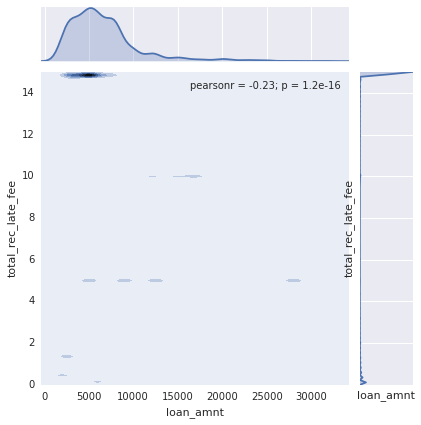



total_rec_prncp vs loan_amnt


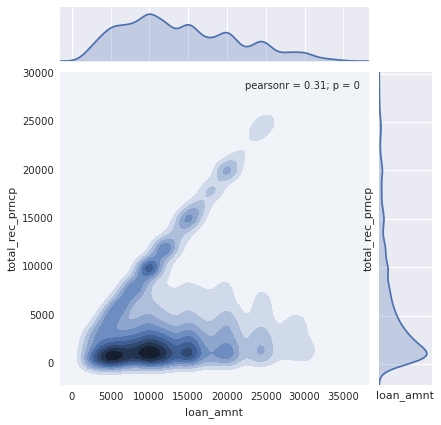



total_rev_hi_lim vs loan_amnt


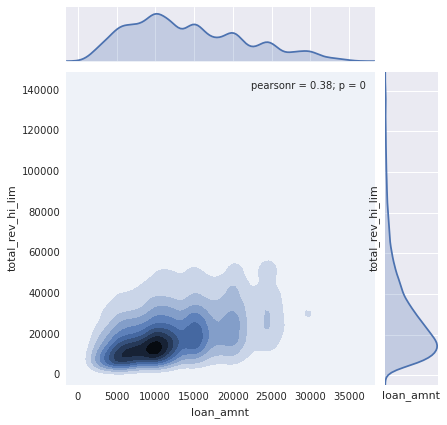



loan_amnt by addr_state
Cardinality too large to plot. Cardinality 51. Not displayed.


loan_amnt by application_type


level_1,25%,50%,75%,count,max,mean,min,std
application_type,,,,,,,,
INDIVIDUAL,8000.00,12300.0,20000.00,841345.0,34975.0,14025.630033,1825.0,7402.535827
JOINT,11531.25,17625.0,23468.75,450.0,34300.0,17423.555556,2000.0,7456.248827


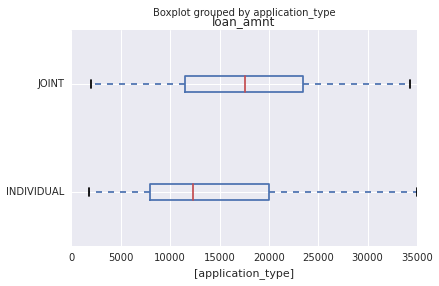



loan_amnt by desc
Cardinality too large to plot. Cardinality 124470. Not displayed.


loan_amnt by emp_length


level_1,25%,50%,75%,count,max,mean,min,std
emp_length,,,,,,,,
1 year,7500.0,12000.0,18000.00,54467.0,34975.0,13131.569115,1850.0,7157.448176
10+ years,9600.0,14900.0,20000.00,273617.0,34975.0,15165.421831,1825.0,7592.032278
2 years,8000.0,12000.0,18000.00,75238.0,34975.0,13389.865826,1825.0,7222.545994
3 years,8000.0,12000.0,18000.00,66781.0,34975.0,13494.948039,1825.0,7196.455771
4 years,8000.0,12000.0,18393.75,50030.0,34975.0,13609.315411,1825.0,7226.527590
5 years,8000.0,12000.0,18725.00,53186.0,34975.0,13707.375531,1875.0,7239.546660
6 years,8000.0,12000.0,19200.00,41026.0,34975.0,13923.570419,1825.0,7275.671857
7 years,8400.0,12800.0,19675.00,42498.0,34975.0,14100.045885,1825.0,7276.150476
8 years,8400.0,13000.0,20000.00,41761.0,34975.0,14233.215799,1825.0,7322.393375


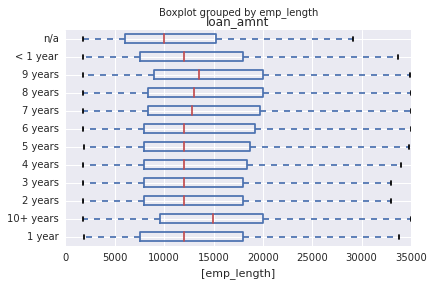



loan_amnt by emp_title
Cardinality too large to plot. Cardinality 299272. Not displayed.


loan_amnt by grade


level_1,25%,50%,75%,count,max,mean,min,std
grade,,,,,,,,
A,8000.0,12000.0,20000.0,145359.0,34975.0,13849.215047,1825.0,7111.783748
B,8000.0,12000.0,18000.0,245766.0,34975.0,13186.832800,1825.0,6976.845925
C,8000.0,12000.0,19000.0,231685.0,34975.0,13665.555280,1825.0,7369.058292
D,8400.0,13400.0,20000.0,129380.0,34975.0,14437.819021,1825.0,7703.989001
E,10625.0,15950.0,22075.0,63980.0,34975.0,16547.685605,1825.0,7815.909300
F,12000.0,17600.0,24000.0,20682.0,34975.0,17754.338314,1825.0,7942.760655
G,12862.5,18900.0,25000.0,4943.0,34975.0,19070.554319,1850.0,7740.626280


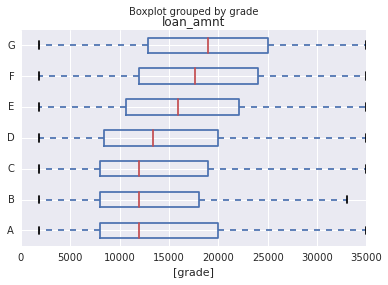



loan_amnt by home_ownership


level_1,25%,50%,75%,count,max,mean,min,std
home_ownership,,,,,,,,
ANY,14500.00,24000.0,29150.0,3.0,34300.0,21100.000000,5000.0,14863.714206
MORTGAGE,9900.00,15000.0,20050.0,415173.0,34975.0,15356.353857,1825.0,7599.073775
NONE,8531.25,10875.0,15000.0,48.0,30000.0,12582.812500,2800.0,6675.082987
OTHER,6000.00,10000.0,15000.0,175.0,34475.0,11007.714286,2000.0,6202.703033
OWN,8000.00,12000.0,18675.0,83223.0,34975.0,13561.239982,1825.0,7331.906730
RENT,7200.00,11100.0,16450.0,343173.0,34975.0,12534.465415,1825.0,6861.840242


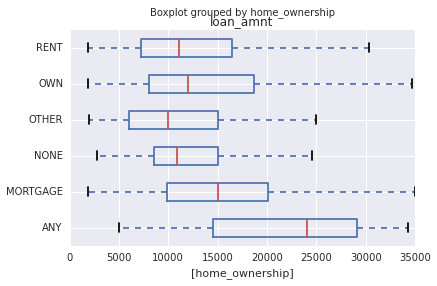



loan_amnt by initial_list_status


level_1,25%,50%,75%,count,max,mean,min,std
initial_list_status,,,,,,,,
f,7750.0,12000.0,18200.0,433738.0,34975.0,13396.518117,1825.0,7348.658804
w,9000.0,14000.0,20000.0,408057.0,34975.0,14698.082192,1825.0,7401.556007


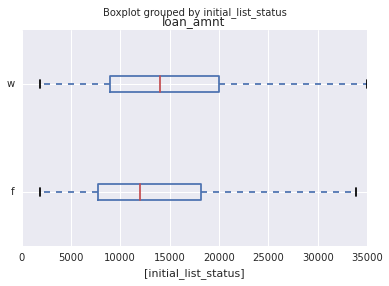



loan_amnt by loan_status


level_1,25%,50%,75%,count,max,mean,min,std
loan_status,,,,,,,,
Charged Off,8000.0,12000.0,19200.00,43040.0,34975.0,13874.283806,1850.0,7403.217333
Current,8500.0,13200.0,20000.00,569677.0,34975.0,14442.792802,1825.0,7447.908997
Default,9262.5,13000.0,19418.75,1150.0,34875.0,14386.000000,2000.0,7166.756103
Does not meet the credit policy. Status:Charged Off,5000.0,8000.0,13100.00,727.0,25000.0,9913.686382,1925.0,6291.758303
Does not meet the credit policy. Status:Fully Paid,4800.0,7500.0,12112.50,1883.0,25000.0,9274.575146,1825.0,6061.028667
Fully Paid,7200.0,11625.0,17600.00,198379.0,34975.0,12846.627037,1825.0,7118.170696
In Grace Period,9325.0,14025.0,20000.00,5875.0,34625.0,14938.140426,1925.0,7521.982192
Issued,8000.0,13000.0,20000.00,7924.0,34925.0,14356.985109,1825.0,7709.116346
Late (16-30 days),8837.5,13950.0,20000.00,2211.0,34550.0,14668.374039,2000.0,7614.741313


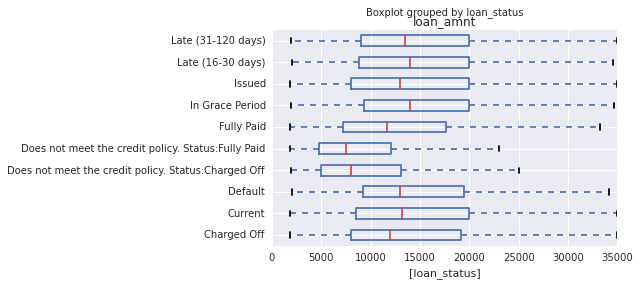



loan_amnt by purpose


level_1,25%,50%,75%,count,max,mean,min,std
purpose,,,,,,,,
car,5000.00,7000.0,11500.00,8583.0,34800.0,8875.256321,1825.0,5734.942282
credit_card,9000.00,13000.0,20000.00,196293.0,34975.0,14507.379657,1825.0,7272.761729
debt_consolidation,9000.00,13875.0,20000.00,499300.0,34975.0,14631.673142,1825.0,7297.874580
educational,3675.00,5937.5,10000.00,372.0,25000.0,7338.776882,1925.0,5015.786069
home_improvement,7000.00,12000.0,19318.75,48558.0,34975.0,13373.180012,1825.0,7660.205323
house,7775.00,12000.0,19475.00,3465.0,34875.0,13716.738817,1850.0,7555.110678
major_purchase,5000.00,9500.0,15000.00,16068.0,34800.0,11083.851444,1825.0,7385.823396
medical,4800.00,7500.0,12000.00,7951.0,34875.0,9188.708967,1825.0,6206.924207
moving,4000.00,6000.0,10000.00,4996.0,34625.0,8077.236789,1850.0,5693.388385


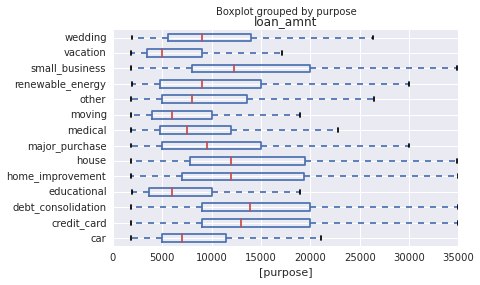



loan_amnt by pymnt_plan


level_1,25%,50%,75%,count,max,mean,min,std
pymnt_plan,,,,,,,,
n,8000.0,12325.0,20000.0,841786.0,34975.0,14027.374535,1825.0,7402.947465
y,18000.0,24000.0,25000.0,9.0,30000.0,20755.555556,5000.0,7516.178153


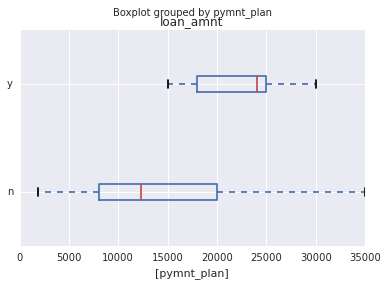



loan_amnt by sub_grade


level_1,25%,50%,75%,count,max,mean,min,std
sub_grade,,,,,,,,
A1,8400.00,12000.0,19000.00,22825.0,29975.0,13766.814896,1850.0,6605.777083
A2,8000.00,12000.0,19200.00,22310.0,34800.0,13542.101076,1900.0,6960.738673
A3,8000.00,12000.0,20000.00,23174.0,34925.0,13898.362389,1875.0,7419.316960
A4,8000.00,12000.0,20000.00,33602.0,34975.0,13823.458425,1825.0,7229.586768
A5,8000.00,12000.0,20000.00,43448.0,34975.0,14043.908235,1825.0,7179.009846
B1,8000.00,12000.0,17600.00,43756.0,34900.0,13192.547879,1850.0,6768.557489
B2,8000.00,12000.0,18000.00,47293.0,34975.0,13249.164253,1850.0,6946.226285
B3,8000.00,12000.0,18000.00,53963.0,34950.0,13313.469414,1825.0,7009.038893
B4,8000.00,12000.0,18000.00,53674.0,34975.0,13425.597123,1850.0,7106.694629


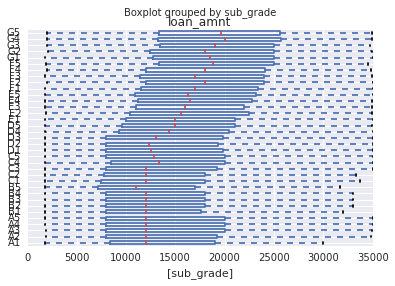



loan_amnt by term


level_1,25%,50%,75%,count,max,mean,min,std
term,,,,,,,,
36 months,6875.0,10000.0,16000.0,595903.0,34975.0,12040.759025,1825.0,6875.983925
60 months,14000.0,18000.0,24000.0,245892.0,34975.0,18842.052100,1900.0,6347.816946


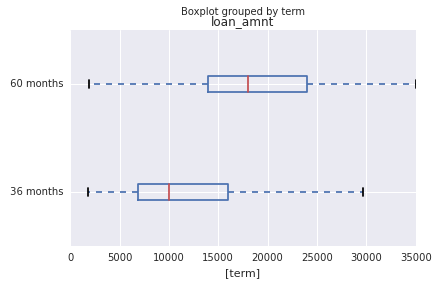



loan_amnt by title
Cardinality too large to plot. Cardinality 63145. Not displayed.


loan_amnt by verification_status


level_1,25%,50%,75%,count,max,mean,min,std
verification_status,,,,,,,,
Not Verified,6650.0,10000.0,15000.0,261370.0,34900.0,11297.674752,1825.0,5882.985967
Source Verified,9325.0,14000.0,20000.0,315667.0,34975.0,14873.867953,1825.0,7300.069994
Verified,9475.0,15000.0,21000.0,264758.0,34975.0,15713.110746,1825.0,8092.749188


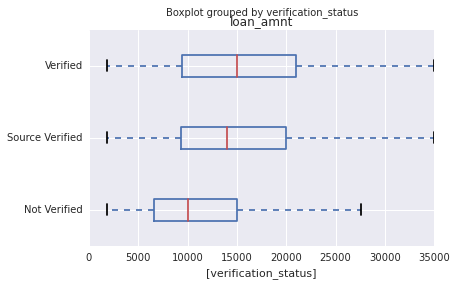



loan_amnt by verification_status_joint


level_1,25%,50%,75%,count,max,mean,min,std
verification_status_joint,,,,,,,,
Not Verified,10000.0,15537.5,21106.25,256.0,34200.0,16341.503906,2000.0,7470.116188
Source Verified,15000.0,19500.0,23950.00,54.0,33000.0,18995.833333,4000.0,7311.656741
Verified,13687.5,19925.0,24081.25,140.0,34300.0,18795.714286,2400.0,7198.399192


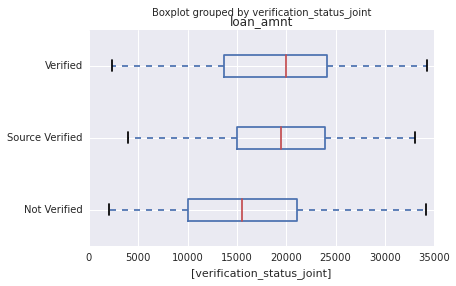



loan_amnt by zip_code
Cardinality too large to plot. Cardinality 935. Not displayed.




In [444]:
plot_bivar_all(df_loan, 'loan_amnt', num_vars2, cat_vars, sample=df_loan.shape[0] / 50)

In [455]:
# mask = df_loan[df_loan.loan_status != False]
df_loan.ix[:, ['loan_status', 'loan_amnt', 'out_prncp', 'total_rec_prncp', 'recoveries', 'collection_recovery_fee']].head(100)

,loan_status,loan_amnt,out_prncp,total_rec_prncp,recoveries,collection_recovery_fee
0,Fully Paid,5000.0,0.00,5000.00,0.00,0.0000
1,Charged Off,2500.0,0.00,456.46,117.08,1.1100
2,Fully Paid,2400.0,0.00,2400.00,0.00,0.0000
3,Fully Paid,10000.0,0.00,10000.00,0.00,0.0000
4,Current,3000.0,766.90,2233.10,0.00,0.0000
5,Fully Paid,5000.0,0.00,5000.00,0.00,0.0000
6,Current,7000.0,1889.15,5110.85,0.00,0.0000
7,Fully Paid,3000.0,0.00,3000.00,0.00,0.0000
8,Charged Off,5600.0,0.00,162.02,189.06,2.0900
9,Charged Off,5375.0,0.00,673.48,269.29,2.5200


In [497]:
df_corr2.ix[['loan_amnt']].T.rename(columns={'loan_amnt': 'corr'}).sort('corr', ascending=0)[:10]

/Library/Python/2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,corr
loan_amnt,1.000000
installment,0.944977
out_prncp,0.646897
total_rec_int,0.533916
total_pymnt_inv,0.475655
max_bal_bc,0.412165
total_rec_prncp,0.390473
revol_bal,0.333580
annual_inc,0.332698
tot_cur_bal,0.328782


We could draw conclusions from above analysis.
- **loan_amnt** is strongly correlated with **installment** (corr: 0.94), **out_prncp** (corr: 0.65), **total_rec_int** (corr: 0.53).
- It seems there are two linear relation consisting the joint distribution between **loan_amnt** and **total_pymnt_inv**. The same applies to the one between **loan_amnt** and **total_rec_prncp**. 
- **loan_amnt** remains constant with **emp_length** <= 6 years, while positively correlated when **emp_length** > 6 years.
- **loan_amnt** remains constant with **grade** <= C, while positively correlated when **grade** > C.

### Section 4.4 Loan Status

We care about if a loan will be full paid back with no defaults. Let's see what the loan status looks like when comparing across other variables.

In [504]:
"""
Charged Off	8000.0	12000.0	19200.00	43040.0	34975.0	13874.283806	1850.0	7403.217333
Current	8500.0	13200.0	20000.00	569677.0	34975.0	14442.792802	1825.0	7447.908997
Default	9262.5	13000.0	19418.75	1150.0	34875.0	14386.000000	2000.0	7166.756103
Does not meet the credit policy. Status:Charged Off	5000.0	8000.0	13100.00	727.0	25000.0	9913.686382	1925.0	6291.758303
Does not meet the credit policy. Status:Fully Paid	4800.0	7500.0	12112.50	1883.0	25000.0	9274.575146	1825.0	6061.028667
Fully Paid	7200.0	11625.0	17600.00	198379.0	34975.0	12846.627037	1825.0	7118.170696
In Grace Period	9325.0	14025.0	20000.00	5875.0	34625.0	14938.140426	1925.0	7521.982192
Issued	8000.0	13000.0	20000.00	7924.0	34925.0	14356.985109	1825.0	7709.116346
Late (16-30 days)	8837.5	13950.0	20000.00	2211.0	34550.0	14668.374039	2000.0	7614.741313
Late (31-120 days)	9000.0	13500.0	20000.00	10929.0	34975.0	14611.030286	1900.0	7367.577507
"""

# pre-processing
def catogorise_loan_status(x):
    if x in ['Fully Paid', 'Does not meet the credit policy. Status:Fully Paid']:
        return 'Good'
    elif x in ['Charged Off', 'Default', 'Does not meet the credit policy. Status:Charged Off', 'Late (16-30 days)', 'Late (31-120 days)']:
        return 'Bad'
    else:
        return 'Pending'
df_loan['loan_outcome'] = df_loan['loan_status'].apply(catogorise_loan_status).astype('category')

In [501]:
df_loan['loan_outcome'].value_counts()

Pending    616492
Good       209711
Bad         61176
Name: loan_outcome, dtype: int64

acc_now_delinq by loan_outcome
No data. Not displayed.


all_util by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,47.475,62.3,74.225,140.0,96.0,59.705714,17.8,18.912935
Pending,48.000,61.9,74.900,20803.0,102.5,60.883200,11.0,18.726654


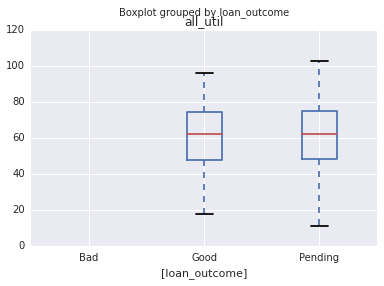



annual_inc by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,42000.0,58000.0,80000.0,59792.0,249470.00,65222.076544,19012.8,33294.417027
Good,46000.0,64000.0,89000.0,205445.0,249999.96,71721.136501,19008.0,35896.045504
Pending,46648.0,65000.0,90000.0,602961.0,249996.00,73070.953258,19001.0,37073.380361


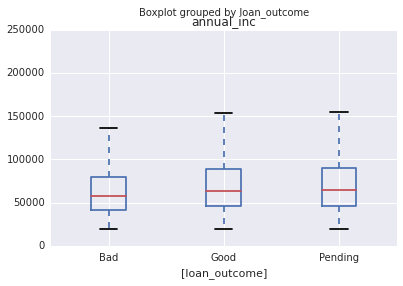



collections_12_mths_ex_med by loan_outcome
No data. Not displayed.


delinq_2yrs by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,1.0,1.0,2.0,10673.0,3.0,1.374122,1.0,0.625478
Good,1.0,1.0,2.0,31459.0,3.0,1.329445,1.0,0.592020
Pending,1.0,1.0,2.0,116620.0,3.0,1.369988,1.0,0.623843


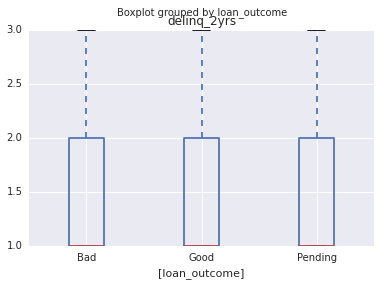



dti by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,12.88,18.61,24.38,60046.0,37.47,18.727616,1.99,7.759996
Good,10.71,15.91,21.55,205300.0,37.47,16.360882,1.99,7.410735
Pending,12.47,18.19,24.50,604197.0,37.47,18.621541,1.99,8.045749


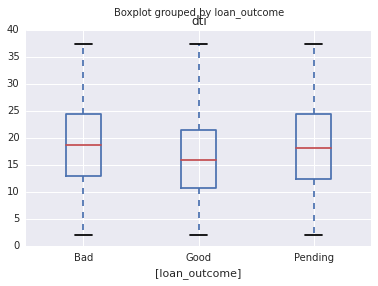



il_util by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,63.45,77.05,88.15,124.0,114.6,73.804032,7.8,21.723093
Pending,59.00,74.90,87.40,18117.0,117.4,71.655511,5.3,21.252001


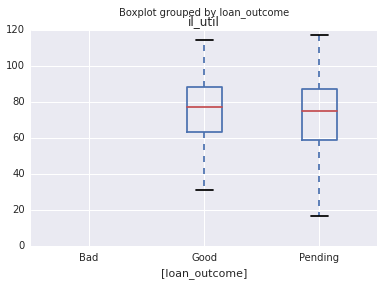



inq_fi by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,1.0,1.0,2.0,75.0,5.0,1.760000,1.0,1.195035
Pending,1.0,1.0,2.0,9526.0,5.0,1.828679,1.0,1.088253


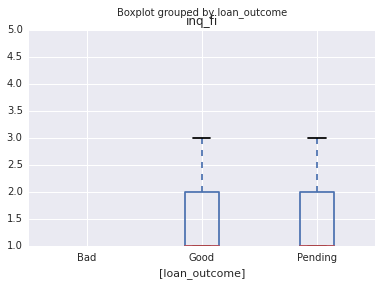



inq_last_12m by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,1.0,2.0,3.0,123.0,11.0,2.723577,0.0,2.506715
Pending,1.0,2.0,3.0,19661.0,11.0,2.251920,0.0,2.127847


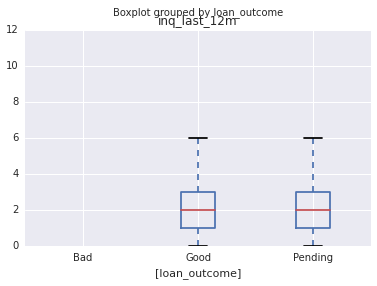



inq_last_6mths by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,1.0,1.0,2.0,31809.0,3.0,1.574177,1.0,0.728766
Good,1.0,1.0,2.0,99625.0,3.0,1.529164,1.0,0.707047
Pending,1.0,1.0,2.0,241575.0,3.0,1.405385,1.0,0.639937


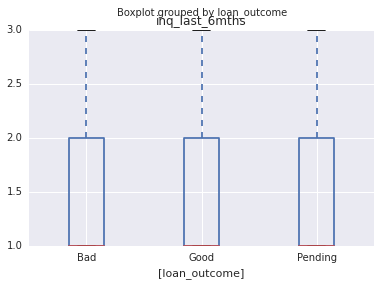



installment by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,270.10,392.73,570.24,59717.0,1184.56,438.177591,60.73,228.825438
Good,238.13,360.08,535.19,204377.0,1184.73,408.663993,60.66,227.254778
Pending,268.70,389.00,577.01,605459.0,1184.73,440.015044,60.66,229.854632


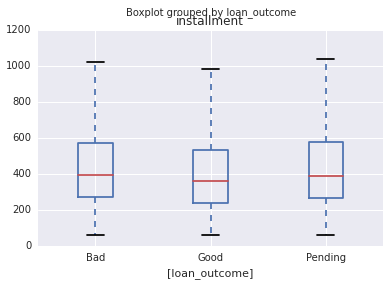



int_rate by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,12.99,15.61,18.54,59617.0,24.89,15.735880,5.42,4.051978
Good,10.16,13.11,15.80,208044.0,24.89,13.197868,5.42,4.135318
Pending,9.76,12.69,15.61,601044.0,24.89,12.955558,5.93,4.088316


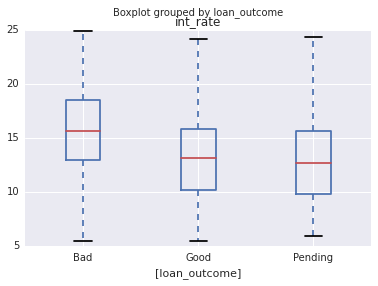



last_pymnt_amnt by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,252.14,386.345,580.7600,60454.0,22896.57,464.580988,0.01,541.880421
Good,1282.36,5305.715,10589.9975,200852.0,24281.64,6778.997860,0.01,6110.989349
Pending,268.66,392.810,586.9200,599526.0,23716.65,455.597034,0.18,385.940236


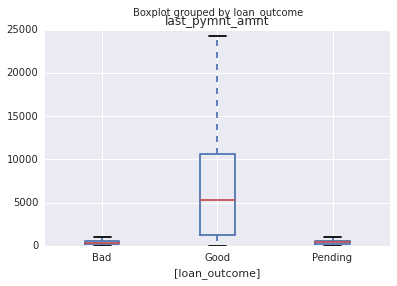



loan_amnt by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,8000.0,12350.0,19500.0,58057.0,34975.0,14003.755792,1850.0,7407.982384
Good,7200.0,11500.0,17500.0,200262.0,34975.0,12813.040167,1825.0,7117.303960
Pending,8500.0,13200.0,20000.0,583476.0,34975.0,14446.615114,1825.0,7452.425008


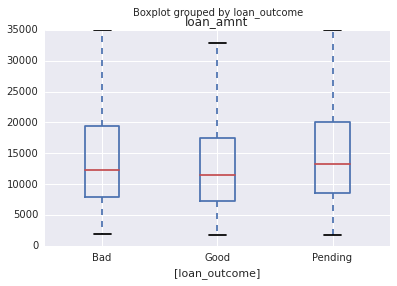



max_bal_bc by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,2271.25,4821.5,8335.75,138.0,22279.0,5757.224638,5.0,4451.652865
Pending,2494.00,4526.0,7702.25,20612.0,24418.0,5746.413400,2.0,4514.513384


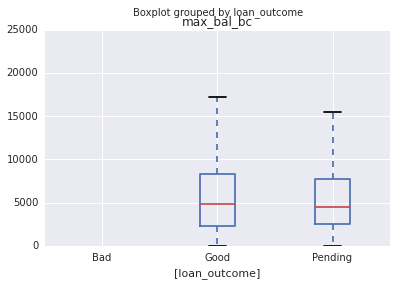



mths_since_last_delinq by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,15.0,30.0,49.0,27676.0,79.0,33.259936,2.0,21.057433
Good,17.0,32.0,50.0,90252.0,79.0,34.957995,2.0,20.851814
Pending,15.0,30.0,49.0,303595.0,79.0,33.381192,2.0,21.042227


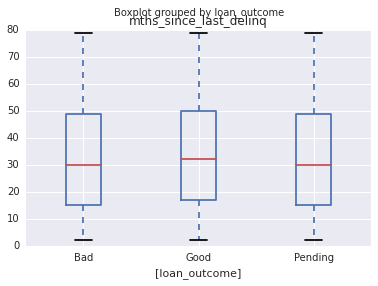



mths_since_last_major_derog by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,26.0,42.0,60.0,12898.0,94.0,43.015119,5.0,20.916635
Good,27.0,43.0,60.0,38032.0,94.0,43.536680,5.0,20.388639
Pending,27.0,44.0,61.0,165484.0,94.0,44.125130,5.0,20.672805


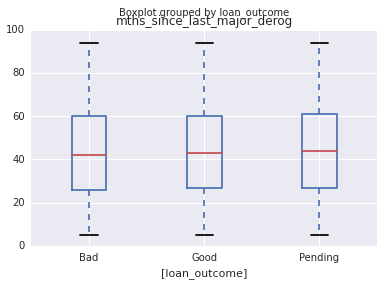



mths_since_last_record by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,57.0,80.0,101.0,8045.0,117.0,76.962585,3.0,27.639888
Good,55.0,77.0,100.0,24961.0,117.0,75.883218,3.0,27.190301
Pending,50.0,68.0,86.0,100198.0,117.0,67.949969,3.0,26.346092


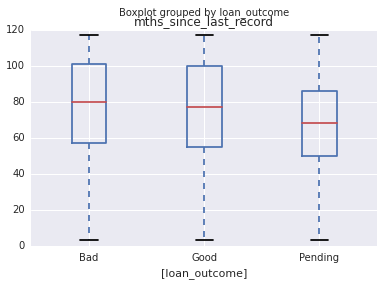



mths_since_rcnt_il by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,5.75,13.0,21.25,128.0,121.0,20.414062,2.0,24.219966
Pending,6.00,12.0,23.00,19900.0,133.0,19.951357,2.0,23.040765


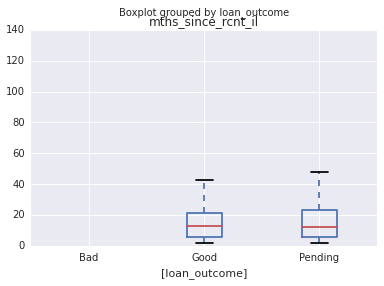



open_acc by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,8.0,10.0,14.0,59525.0,27.0,11.181252,4.0,4.559733
Good,8.0,10.0,13.0,204245.0,27.0,10.939264,4.0,4.497066
Pending,8.0,11.0,14.0,600270.0,27.0,11.612366,4.0,4.813259


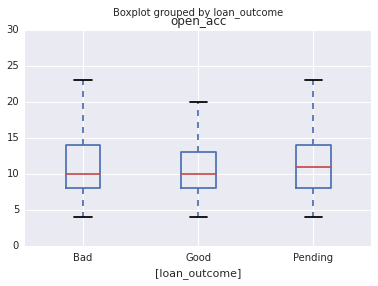



open_acc_6m by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,1.0,2.0,2.0,93.0,4.0,1.870968,1.0,0.862577
Pending,1.0,1.0,2.0,12632.0,4.0,1.680336,1.0,0.862267


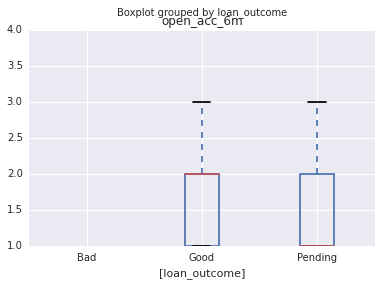



open_il_24m by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,1.0,2.0,3.0,103.0,6.0,2.097087,1.0,1.175856
Pending,1.0,2.0,3.0,15413.0,6.0,2.102122,1.0,1.247766


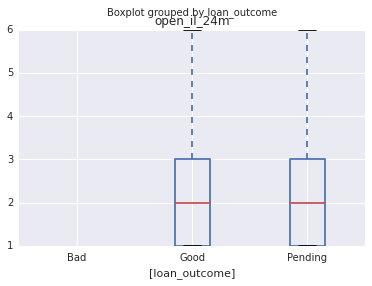



open_il_6m by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,1.0,2.0,4.0,125.0,13.0,3.27200,1.0,2.683209
Pending,1.0,2.0,4.0,18706.0,15.0,3.09088,1.0,2.522282


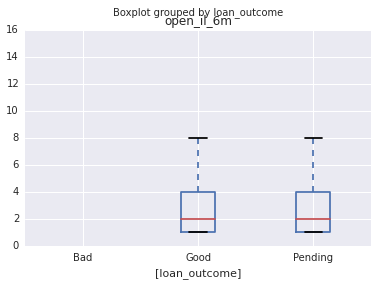



open_rv_24m by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,2.0,3.0,5.0,130.0,11.0,3.684615,1.0,2.329569
Pending,2.0,3.0,4.0,18155.0,11.0,3.298761,1.0,2.184751


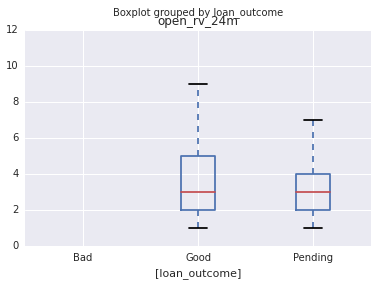



out_prncp by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,5436.74,10086.09,16017.7800,14981.0,32589.97,11394.234781,0.21,7379.779467
Good,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Pending,5491.96,10055.89,16186.4725,607706.0,32586.72,11494.774027,0.01,7419.312239


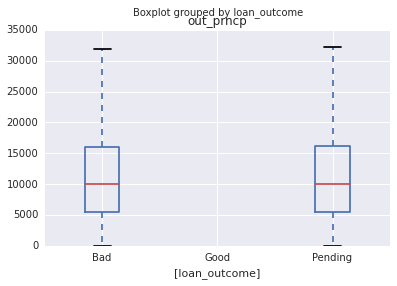



pub_rec by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,1.0,1.0,1.0,7117.0,1.0,1.0,1.0,0.0
Good,1.0,1.0,1.0,22642.0,1.0,1.0,1.0,0.0
Pending,1.0,1.0,1.0,83507.0,1.0,1.0,1.0,0.0


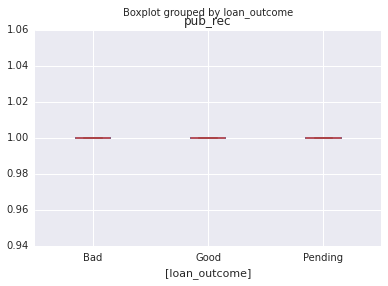



recoveries by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,255.475,622.1,1060.455,15803.0,1706.17,681.408266,0.25,489.320445
Good,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Pending,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN


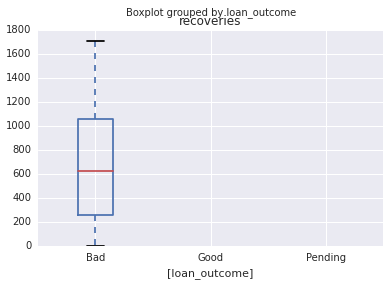



revol_bal by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,6306.0,11304.0,19135.0,59984.0,93253.0,14519.245515,310.0,11952.133584
Good,5958.0,10940.5,18978.0,204318.0,93349.0,14415.937353,310.0,12447.202119
Pending,6780.0,12268.0,21271.0,605318.0,93410.0,16093.128144,310.0,13395.986861


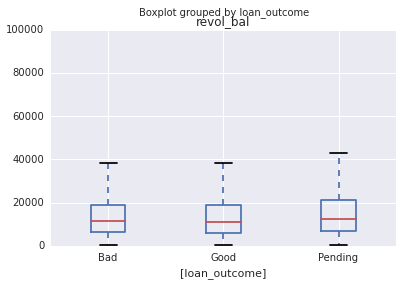



revol_util by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,43.2,61.0,77.3,59745.0,98.4,59.302062,2.3,22.520868
Good,35.8,54.9,72.8,204432.0,98.4,53.809241,2.3,23.858894
Pending,38.3,55.8,72.9,604825.0,98.4,55.195364,2.3,22.626493


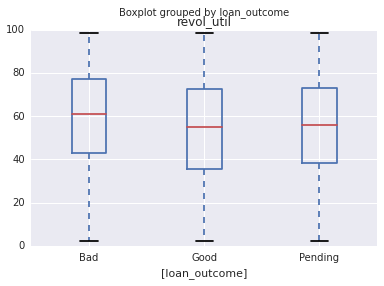



tot_coll_amt by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,100.0,271.0,725.5,6195.0,4605.0,591.639548,3.0,790.204431
Good,113.0,283.0,726.0,16405.0,4595.0,603.892045,7.0,801.926739
Pending,125.0,313.0,805.0,85385.0,4605.0,663.929039,2.0,856.480266


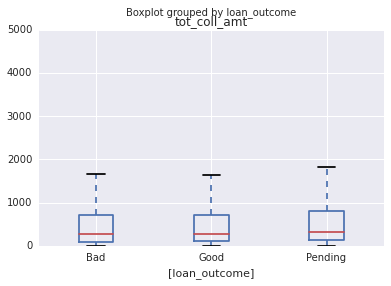



tot_cur_bal by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,26834.5,61503.0,173457.00,49415.0,658746.0,113708.101548,3665.0,117164.144261
Good,29852.0,88290.0,214151.00,150535.0,658992.0,137749.734049,3659.0,133209.187910
Pending,30879.0,80800.5,205612.25,600808.0,658984.0,133690.515975,3658.0,131218.838163


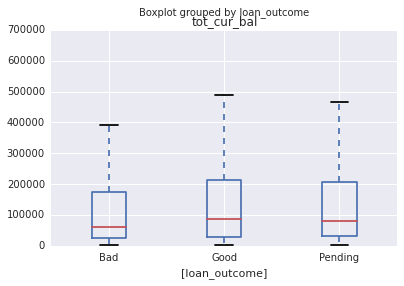



total_acc by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,16.0,23.0,31.0,59238.0,59.0,24.446943,7.0,10.741827
Good,17.0,24.0,32.0,203399.0,59.0,25.169858,7.0,10.879535
Pending,17.0,24.0,32.0,600017.0,59.0,25.204963,7.0,10.802938


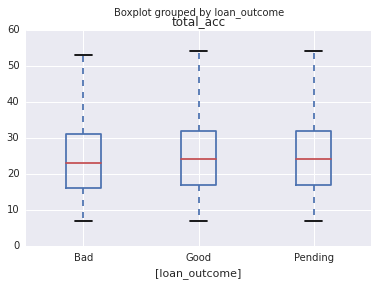



total_bal_il by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,15781.0,30905.5,55230.75,126.0,188977.0,39693.341270,1214.0,33323.917405
Pending,14444.0,28068.0,50346.00,18773.0,204244.0,38138.721994,7.0,34236.750382


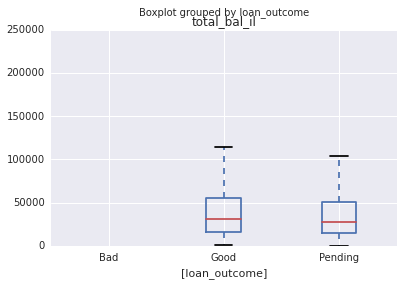



total_cu_tl by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
Good,1.0,2.0,4.0,61.0,12.0,3.573770,1.0,3.122280
Pending,1.0,2.0,4.0,9599.0,12.0,3.006146,1.0,2.428014


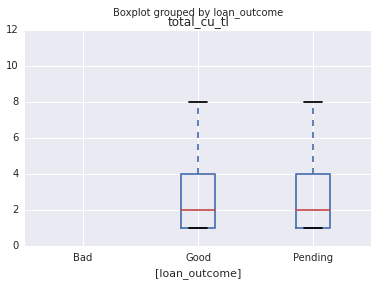



total_pymnt_inv by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,2437.215,4753.605,8515.080,60612.0,36493.59,6282.175598,0.92,5379.110094
Good,7653.950,12426.340,19151.960,201533.0,36530.89,14003.821878,0.49,8073.814287
Pending,1467.910,3417.800,7022.105,598323.0,36525.06,5197.467726,0.18,5336.319358


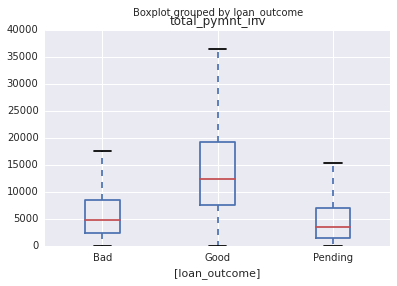



total_rec_int by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,721.035,1470.54,2786.14,59602.0,10271.88,2091.662148,4.61,1933.495809
Good,614.230,1270.19,2380.28,207792.0,10275.10,1802.669409,0.01,1727.325020
Pending,409.320,988.75,2092.71,592897.0,10274.42,1589.704447,4.61,1741.100016


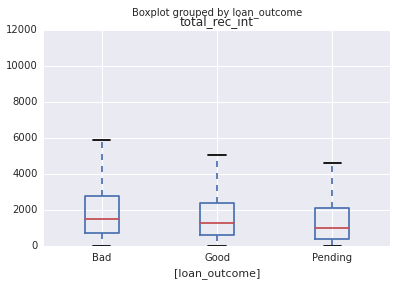



total_rec_late_fee by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,14.943652,14.972853,14.986594,610.0,14.999773,14.195449,0.0100,2.929358
Good,14.956432,14.975336,14.988530,678.0,15.000000,14.719551,0.0608,1.866477
Pending,14.966923,14.981611,14.992009,65.0,14.999457,14.745646,0.2000,1.832544


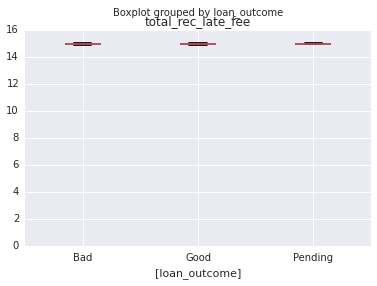



total_rec_prncp by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,1181.215,2432.330,4639.73,60395.0,29918.91,3494.598178,18.80,3427.686804
Good,7000.000,11000.000,16800.00,201178.0,30000.00,12349.574022,33.94,6903.586884
Pending,939.780,2222.555,4657.32,598784.0,30000.00,3524.260140,0.18,3838.747467


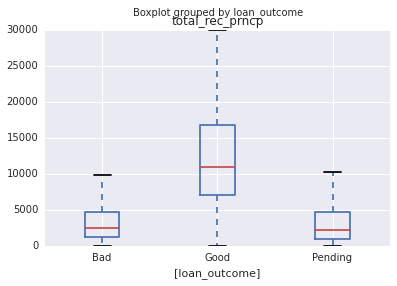



total_rev_hi_lim by loan_outcome


level_1,25%,50%,75%,count,max,mean,min,std
loan_outcome,,,,,,,,
Bad,12600.0,20600.0,33300.0,49227.0,151500.0,25968.595080,3050.0,19548.586289
Good,13700.0,22800.0,37400.0,151171.0,151570.0,29084.624485,3025.0,22335.705685
Pending,14400.0,24300.0,40300.0,599843.0,151560.0,31029.214780,3050.0,23754.716709


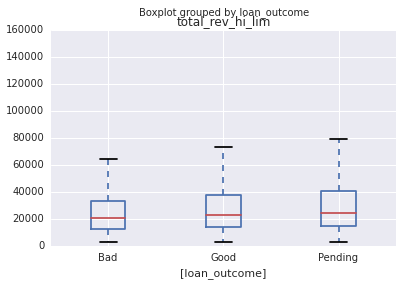

In [522]:
for col in num_vars2:
    plot_box(df_loan, col, 'loan_outcome')
# df_loan.groupby('loan_outcome')[target_var].plot(kind='box')

Apparently, "Bad" loans tend to have higher **dti**, **annual_inc**, **int_rate**.

## Section 5 Multivariate Analysis

In [756]:
def plot_mulvar_scatter(df, x_col, y_col, cat, mask=None, no_outliers=True, **kwargs):
    if mask is not None:
        df = df[mask]
    if no_outliers:
        df = remove_outliers(df, x_col, 1)
        df = remove_outliers(df, y_col, 1)
    df = df.sample(50000)
    g = sns.FacetGrid(df, 
                      hue=cat, 
                      size=10)
    g.map(plt.scatter, x_col, y_col, **kwargs)
    g.add_legend()
    plt.show()

In [749]:
target_num_vars = [
    'dti', 
    'total_rec_int',
    'annual_inc',
    'int_rate',
    'loan_amnt',
    'tot_cur_bal',
    'mths_to_date',
    'sub_grade_enc',
    'recoveries',
]

In [747]:
# sample the data
mask = (df_loan.dti < 40) & (df_loan.annual_inc < 100000)
df = df_loan[mask].sample(50000)

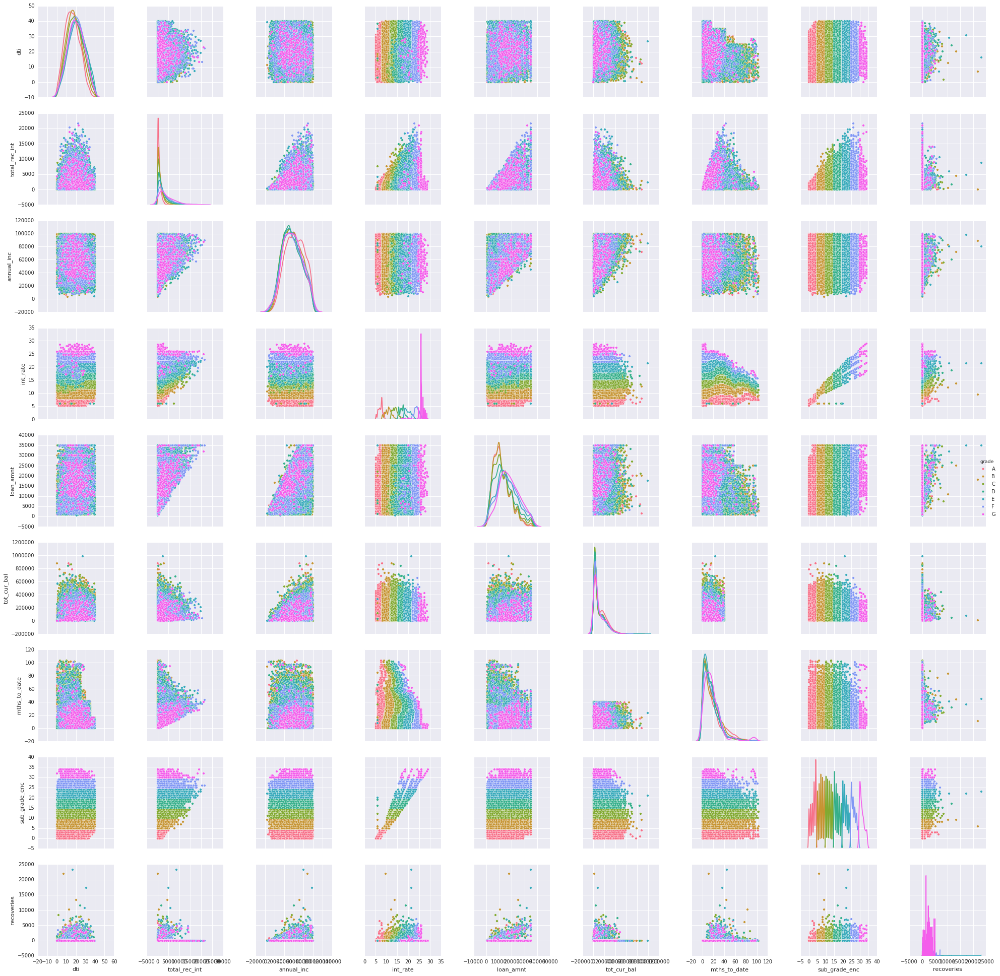

In [751]:
sns.pairplot(df, hue='grade', vars=target_num_vars, diag_kind='kde')
plt.tight_layout()
plt.savefig('scatter_matrix.01.by.grade.png')

In [739]:
df2 = df_loan[mask & (df_loan.loan_outcome != 'Pending')].sample(50000)
df2['loan_outcome'] = df2.loan_outcome.cat.remove_unused_categories()

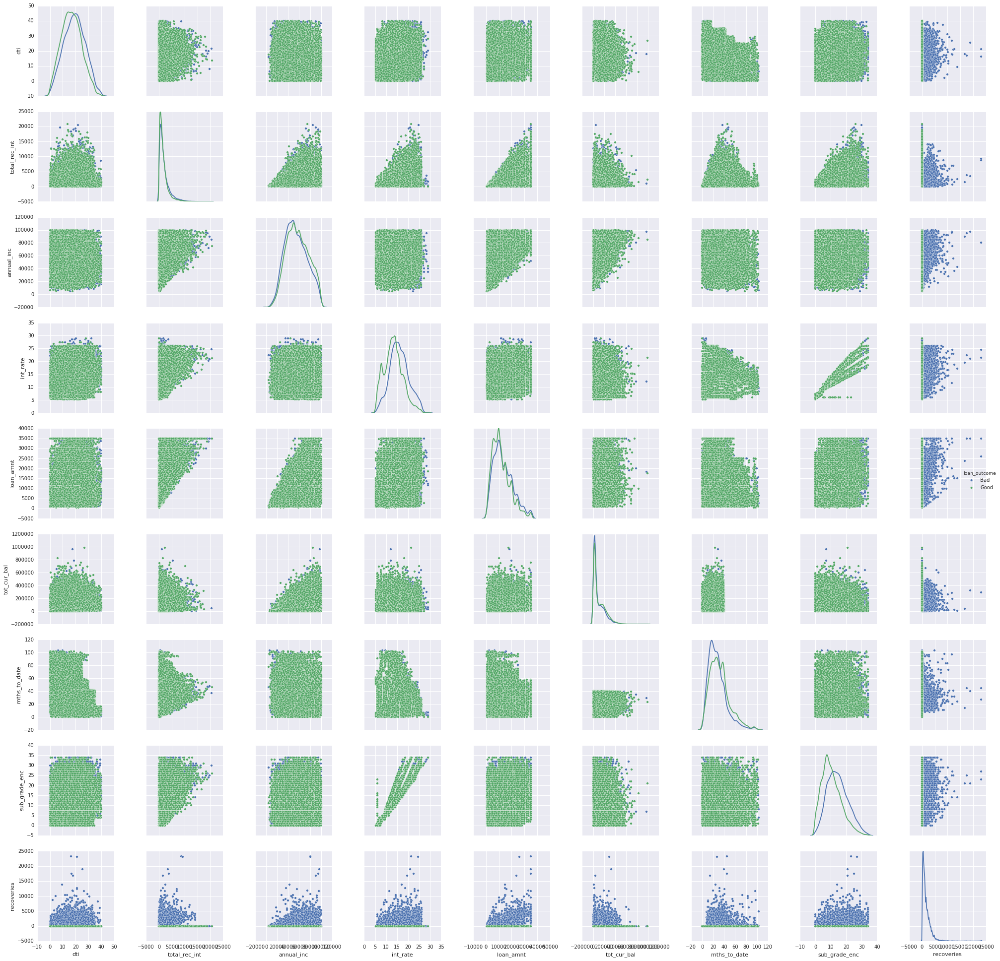

In [750]:
sns.pairplot(df2, 
             hue='loan_outcome', 
             vars=target_num_vars, diag_kind='kde')
plt.tight_layout()
plt.savefig('scatter_matrix.02.by.loan_outcome.png')

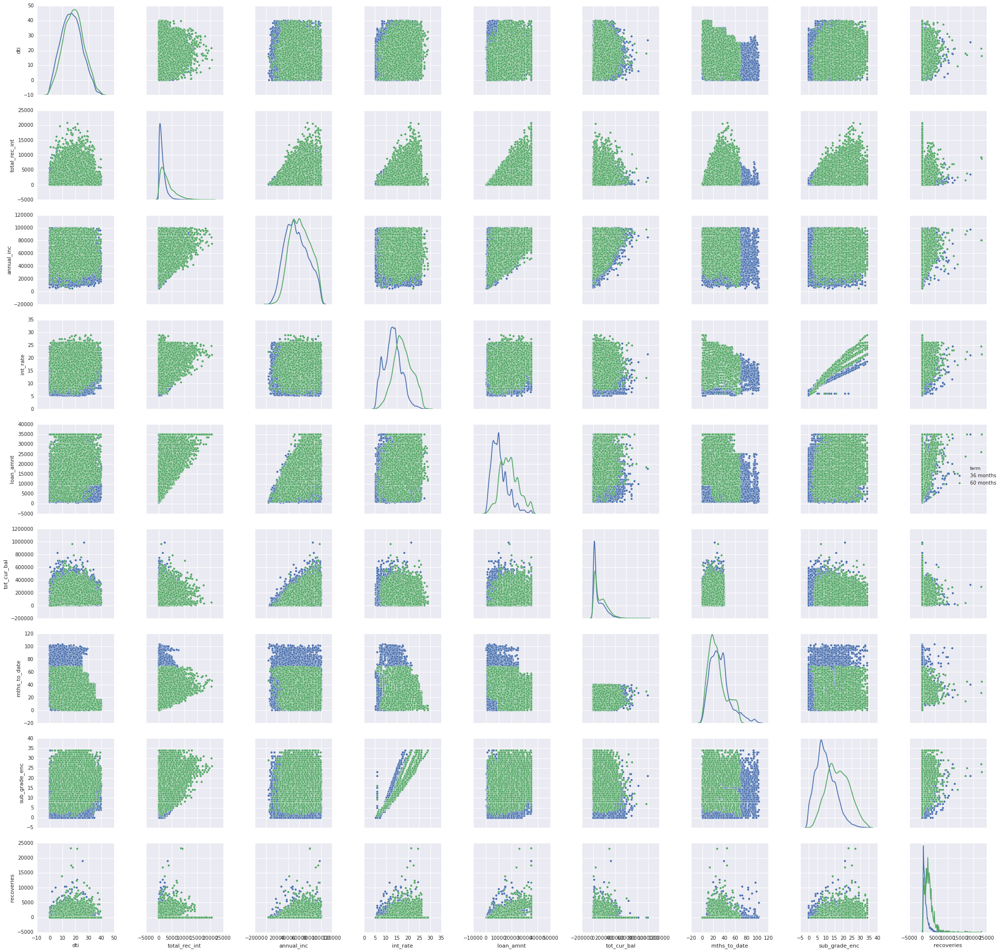

In [752]:
sns.pairplot(df2, 
             hue='term', 
             vars=target_num_vars, diag_kind='kde')
plt.tight_layout()
plt.savefig('scatter_matrix.03.by.term.png')

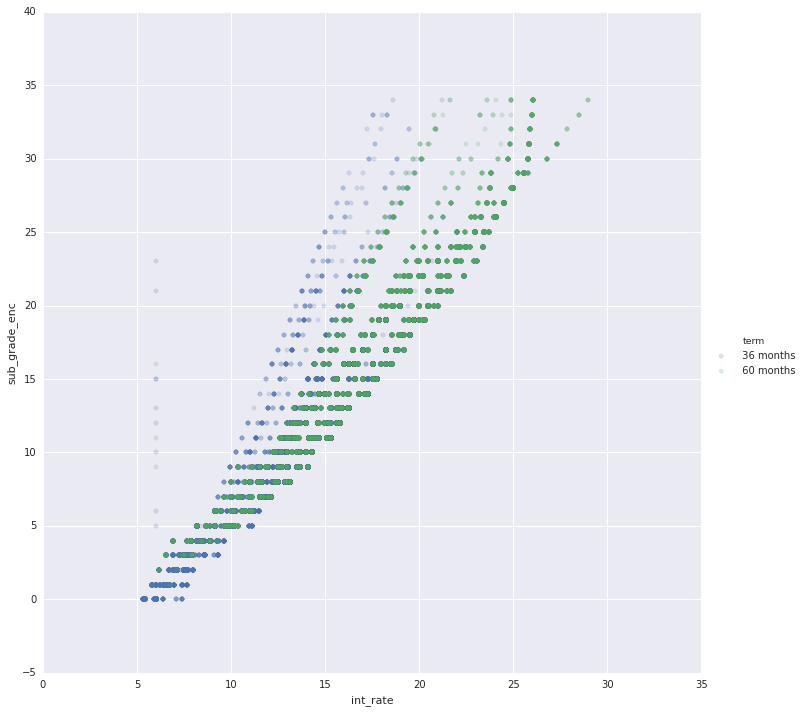

In [769]:
plot_mulvar_scatter(df2, 'int_rate', 'sub_grade_enc', 'term', no_outliers=False, alpha=1.0/5)